# Importing, Stratifying and Outliers

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import random
from statsmodels.tsa.seasonal import seasonal_decompose
import matplotlib.dates as mdates
import statsmodels.api as sm
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from statsmodels.stats.outliers_influence import variance_inflation_factor
from scipy.stats import chi2_contingency
from sklearn.preprocessing import PolynomialFeatures
from prophet import Prophet
from sklearn.tree import DecisionTreeClassifier  # to build a classification tree
from sklearn.tree import plot_tree  # to draw a classification tree
from sklearn.model_selection import TimeSeriesSplit, cross_val_score
from sklearn.tree import DecisionTreeRegressor
from sklearn.model_selection import train_test_split  # to split data into training and testing sets
from sklearn.model_selection import cross_val_score  # for cross validation

from sklearn.metrics import confusion_matrix  # to compute the confusion matrix
from sklearn.metrics import ConfusionMatrixDisplay  # modern way to plot confusion matrix

Mohit Bansal was here !

Daddy was here


daadu was here 

In [2]:
#Test and sample file
#df_test = pd.read_csv('test_file.csv')
#df_sample_submission = pd.read_csv('sample_submission.csv')

#Training Datasets
df_fulfillment_center = pd.read_csv('fulfilment_center_info.csv')
df_meal_info = pd.read_csv('meal_info.csv')
df_train = pd.read_csv('train.csv')

In [3]:
df_super = pd.merge(pd.merge(df_train, df_meal_info, on = 'meal_id', how = 'left'), df_fulfillment_center, on = 'center_id', how = 'left')


# Left join as the main table is df_train here and if there are no records in it that pertain to other tables, it is of no concern to us

In [4]:
df_super['discount_percent'] = (df_super['base_price'] - df_super['checkout_price']) * 100 / df_super['base_price']
df_super

,id,week,center_id,meal_id,checkout_price,base_price,emailer_for_promotion,homepage_featured,num_orders,category,cuisine,city_code,region_code,center_type,op_area,discount_percent
0,1379560,1,55,1885,136.83,152.29,0,0,177,Beverages,Thai,647,56,TYPE_C,2.0,10.151684
1,1466964,1,55,1993,136.83,135.83,0,0,270,Beverages,Thai,647,56,TYPE_C,2.0,-0.736214
2,1346989,1,55,2539,134.86,135.86,0,0,189,Beverages,Thai,647,56,TYPE_C,2.0,0.736052
3,1338232,1,55,2139,339.50,437.53,0,0,54,Beverages,Indian,647,56,TYPE_C,2.0,22.405321
4,1448490,1,55,2631,243.50,242.50,0,0,40,Beverages,Indian,647,56,TYPE_C,2.0,-0.412371
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
456543,1271326,145,61,1543,484.09,484.09,0,0,68,Desert,Indian,473,77,TYPE_A,4.5,0.000000
456544,1062036,145,61,2304,482.09,482.09,0,0,42,Desert,Indian,473,77,TYPE_A,4.5,0.000000
456545,1110849,145,61,2664,237.68,321.07,0,0,501,Salad,Italian,473,77,TYPE_A,4.5,25.972529
456546,1147725,145,61,2569,243.50,313.34,0,0,729,Salad,Italian,473,77,TYPE_A,4.5,22.288887


In [5]:

start_date = pd.to_datetime('2023-01-01')

df_super['date'] = pd.to_datetime(start_date + pd.to_timedelta(df_super['week'], unit='W'))


## Stratified Sample of df super 70:30 split

In [6]:
# Initialize empty dataframes for stratified training and testing data
df_train_stratified = pd.DataFrame()
df_test_stratified = pd.DataFrame()

# Loop over each group (center_id, meal_id)
for (center, meal), df in df_super.groupby(['center_id', 'meal_id']):
    # Sort by 'week' to ensure chronological order
    df_sorted = df.sort_values(by='week')

    if len(df_sorted) == 1:
      train_df = df_sorted.iloc[:,:]  # Top 80% for training

    else:

      # Split 80% for training and 20% for testing based on sorted week
      train_size = int(len(df_sorted) * 0.7)

      train_df = df_sorted.iloc[:train_size]  # Top 80% for training
      test_df = df_sorted.iloc[train_size:]   # Bottom 20% for testing

      # Concatenate the data for training and testing
      df_train_stratified = pd.concat([df_train_stratified, train_df], axis=0)
      df_test_stratified = pd.concat([df_test_stratified, test_df], axis=0)

  # After this, df_train_stratified will contain 80% of the data for training (chronologically ordered),
  # and df_test_stratified will contain 20% for testing (more recent data).


## Dealing with outliers

In [7]:
def windsorize_iqr(group):
    q1 = group['num_orders'].quantile(0.25)
    q3 = group['num_orders'].quantile(0.75)
    iqr = q3 - q1
    lower = q1 - 1.5 * iqr
    upper = q3 + 1.5 * iqr

    # Windsorize: cap values beyond lower/upper bounds
    group['num_orders'] = group['num_orders'].clip(lower=lower, upper=upper)
    return group

# Apply directly on df_super_stratified
df_train_stratified = df_train_stratified.groupby(['center_id', 'meal_id'], group_keys=False).apply(windsorize_iqr)


<ipython-input-7-9bb0c5ef23be>:13: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df_train_stratified = df_train_stratified.groupby(['center_id', 'meal_id'], group_keys=False).apply(windsorize_iqr)


#Functions

## Function to One hot encode

In [8]:
def one_hot_encode_feature(df, feature, drop_first=True, dtype=int):
    """
    One-hot encodes a single feature column in the dataframe.

    Parameters:
    - df: pandas DataFrame
    - feature: str, column name to one-hot encode
    - drop_first: bool, whether to drop the first dummy column (default: True)
    - dtype: data type for the dummy columns (default: int)

    Returns:
    - df_encoded: DataFrame with the encoded feature
    """
    df_encoded = df.copy()
    dummies = pd.get_dummies(df_encoded[feature], prefix=feature, drop_first=drop_first, dtype=dtype)
    df_encoded = pd.concat([df_encoded.drop(columns=[feature]), dummies], axis=1)
    return df_encoded


## Function to target encode

### On Training

In [9]:
def target_encode_train(df_train, group_cols, target_col='num_orders', prefix='_encoded'):
    df_train = df_train.copy()
    target_maps = {}

    for col in group_cols:
        # Calculate target mean per category
        target_means = df_train.groupby(col)[target_col].mean()
        target_map = target_means.to_dict()
        target_maps[col] = target_map

        # Map encoded values into new column
        df_train[col + prefix] = df_train[col].map(target_map)

    return df_train, target_maps


### On Test

In [10]:
def target_encode_test(df_test, target_maps, group_cols, global_mean=None, prefix='_encoded'):
    df_test = df_test.copy()

    for col in group_cols:
        target_map = target_maps[col]
        encoded_col = df_test[col].map(target_map)

        # Handle unseen categories in test set
        if global_mean is None:
            encoded_col = encoded_col.fillna(sum(target_map.values()) / len(target_map))
        else:
            encoded_col = encoded_col.fillna(global_mean)

        df_test[col + prefix] = encoded_col

    return df_test


##Function to bin and one hot encode features

### On Training

In [11]:
def generate_bins_from_train(df_train, group_cols, target_col='num_orders', q=5, prefix='_group'):
    bin_maps = {}
    df_train = df_train.copy()

    for col in group_cols:
        means = df_train.groupby(col)[target_col].mean().sort_values()
        bins = pd.qcut(means, q=q, labels=False, duplicates='drop')
        bin_map = bins.to_dict()  # Mapping from category -> bin label
        bin_maps[col] = bin_map
        df_train[col + prefix] = df_train[col].map(bin_map)

    group_columns = [col + prefix for col in group_cols]
    df_train = pd.get_dummies(df_train, columns=group_columns, drop_first=True, dtype=int)

    return df_train, bin_maps


### On Test

In [12]:
def apply_bins_to_test(df_test, bin_maps, group_cols, prefix='_group'):
    df_test = df_test.copy()

    for col in group_cols:
        bin_map = bin_maps[col]
        df_test[col + prefix] = df_test[col].map(bin_map)

    group_columns = [col + prefix for col in group_cols]
    df_test = pd.get_dummies(df_test, columns=group_columns, drop_first=True, dtype=int)

    return df_test

## Function to log a column for a dataframe

In [13]:
def log_it(df, col):
  df = df.copy()
  df[f'log_{col}'] = np.log1p(df[col])
  return df

## Seasonality

###Function for adding of the seasonality feature

In [14]:

def add_seasonality_feature(df, group_cols=['center_id', 'meal_id'], date_col='week', value_col='num_orders', period=52):
    """
    Adds a 'seasonality' column to the input dataframe by performing seasonal decomposition
    on the time series grouped by group_cols. Falls back to mean if series is too short.

    Parameters:
    - df: DataFrame with time-series data
    - group_cols: list of columns to group by (default ['center_id', 'meal_id'])
    - date_col: column name representing the time axis (default 'week')
    - value_col: column to decompose (default 'num_orders')
    - period: number of time periods in a season (default 52 for weekly data)

    Returns:
    - df_merged: original DataFrame with added 'seasonality' column
    """

    def seasonality_func(x):
        series = x.groupby(date_col)[value_col].sum().sort_index()
        if len(series) > 2 * period:
            decomposition = seasonal_decompose(series, model='additive', period=period)
            return decomposition.seasonal
        else:
            # Fallback: constant seasonality
            return pd.Series(0, index=series.index)

    # Compute seasonal component for each group
    seasonal_series = df.groupby(group_cols).apply(lambda x: seasonality_func(x))
    seasonal_series = seasonal_series.reset_index(level=list(range(len(group_cols) + 1)))
    seasonal_series = seasonal_series.rename(columns={0: 'seasonality'})

    # Merge with original dataframe
    df_merged = pd.merge(df, seasonal_series, on=group_cols + [date_col], how='left')

    return df_merged


### Seasonality incorporation through seasonal weeks

In [15]:
def seasonal_incorporation(df_train, df_test):
    df_train['seasonal_week'] = df_train['week'] % 52
    df_test['seasonal_week'] = df_test['week'] % 52

    # Aggregate to ensure one row per group
    seasonal_lookup = df_train.groupby(
        ['center_id', 'meal_id', 'seasonal_week']
    )['seasonality'].mean().reset_index()

    df_test = pd.merge(
        df_test,
        seasonal_lookup,
        on=['center_id', 'meal_id', 'seasonal_week'],
        how='left'
    )

    df_test['seasonality'].fillna(0, inplace=True)
    return df_test


## Function for standardizing

In [16]:

def scale_numeric_features(df, num_cols, scaler=None, fit=True):
    """
    Scales the specified numeric columns in the DataFrame using StandardScaler.

    Parameters:
    - df: The DataFrame to transform
    - num_cols: List of numeric column names to scale
    - scaler: Optional pre-fitted scaler (useful for test data)
    - fit: Whether to fit the scaler on the data (True for training, False for test)

    Returns:
    - df_scaled: DataFrame with scaled columns (copy of input df)
    - scaler: The fitted StandardScaler instance
    """
    df_scaled = df.copy()

    if scaler is None:
        scaler = StandardScaler()

    if fit:
        df_scaled[num_cols] = scaler.fit_transform(df_scaled[num_cols])
    else:
        df_scaled[num_cols] = scaler.transform(df_scaled[num_cols])

    return df_scaled, scaler


## Function for model assumptions

### Pre Model Assumptions Function

In [17]:
# Helper function for Cramér's V
def cramers_v(x, y):
    confusion_matrix = pd.crosstab(x, y)
    chi2 = chi2_contingency(confusion_matrix)[0]
    n = confusion_matrix.sum().sum()
    phi2 = chi2 / n
    r, k = confusion_matrix.shape
    phi2corr = max(0, phi2 - ((k-1)*(r-1))/(n-1))
    rcorr = r - ((r-1)**2)/(n-1)
    kcorr = k - ((k-1)**2)/(n-1)
    return np.sqrt(phi2corr / min((kcorr-1), (rcorr-1)))

# Master function
def assumptions_pre(df, num_cols, cat_cols):
    """
    Performs pre-model assumption checks:
    - Pearson correlation for numeric features
    - Cramér's V for categorical features
    - VIF for all numerical/dummy features

    Parameters:
    - df: pandas DataFrame with preprocessed data
    - num_cols: list of continuous numeric column names
    - cat_cols: list of categorical/dummy column names

    Returns:
    - None (plots and prints diagnostics)
    """

    print("\n📊 ------------------ PEARSON CORRELATION (NUMERIC) ------------------ 📊\n")
    if num_cols:
        plt.figure(figsize=(10, 6))
        sns.heatmap(df[num_cols].corr(), annot=True, fmt=".2f", cmap='coolwarm')
        plt.title("Pearson Correlation (Continuous Features)", fontsize=14)
        plt.show()

    print("\n🔁 ----------------- CRAMÉR'S V CORRELATION (CATEGORICAL) ---------------- 🔁\n")
    if cat_cols:
        cramers_matrix = pd.DataFrame(index=cat_cols, columns=cat_cols, dtype=float)
        for col1 in cat_cols:
            for col2 in cat_cols:
                if col1 == col2:
                    cramers_matrix.loc[col1, col2] = 1.0
                else:
                    cramers_matrix.loc[col1, col2] = cramers_v(df[col1], df[col2])

        plt.figure(figsize=(10, 6))
        sns.heatmap(cramers_matrix.astype(float), annot=True, fmt=".2f", cmap='YlGnBu')
        plt.title("Cramér's V (Categorical Features)", fontsize=14)
        plt.show()

    print("\n🧮 ----------------- VARIANCE INFLATION FACTOR (VIF) ----------------- 🧮\n")
    vif_df = df[num_cols + cat_cols].copy()
    vif_df = sm.add_constant(vif_df)

    vif_data = pd.DataFrame()
    vif_data['feature'] = vif_df.columns
    vif_data['VIF'] = [variance_inflation_factor(vif_df.values, i) for i in range(vif_df.shape[1])]

    print(vif_data.to_string(index=False))



### VIF

In [18]:
def calculate_vif_from_scaled_df(X_scaled):
    """
    Calculates and prints Variance Inflation Factor (VIF) for preprocessed and scaled predictor variables.

    Parameters:
    - X_scaled: pandas DataFrame of predictor variables (already scaled and encoded)

    Returns:
    - DataFrame of VIF values
    """
    X_scaled = X_scaled.fillna(0)  # Safety check
    X_const = sm.add_constant(X_scaled)

    vif_data = pd.DataFrame()
    vif_data["feature"] = X_const.columns
    vif_data["VIF"] = [variance_inflation_factor(X_const.values, i)
                       for i in range(X_const.shape[1])]

    print("\n🧮 ----------------- VARIANCE INFLATION FACTOR (VIF) ----------------- 🧮\n")
    print(vif_data.to_string(index=False))

    return vif_data


### Pearson corr and cramer V

In [19]:

# Helper function for Cramér's V
def cramers_v(x, y):
    confusion_matrix = pd.crosstab(x, y)
    chi2 = chi2_contingency(confusion_matrix)[0]
    n = confusion_matrix.sum().sum()
    phi2 = chi2 / n
    r, k = confusion_matrix.shape
    phi2corr = max(0, phi2 - ((k-1)*(r-1))/(n-1))
    rcorr = r - ((r-1)**2)/(n-1)
    kcorr = k - ((k-1)**2)/(n-1)
    return np.sqrt(phi2corr / min((kcorr-1), (rcorr-1)))

# Function for correlation and Cramér's V analysis
def pre_assumptions_analysis(df, num_cols, cat_cols):
    """
    Performs pre-model assumption checks:
    - Pearson correlation for numeric features
    - Cramér's V for categorical features

    Parameters:
    - df: pandas DataFrame with preprocessed data
    - num_cols: list of continuous numeric column names
    - cat_cols: list of categorical column names

    Returns:
    - None (plots and prints diagnostics)
    """

    # Pearson correlation for numeric features
    print("\n📊 ------------------ PEARSON CORRELATION (NUMERIC) ------------------ 📊\n")
    if num_cols:
        plt.figure(figsize=(10, 6))
        sns.heatmap(df[num_cols].corr(), annot=True, fmt=".2f", cmap='coolwarm')
        plt.title("Pearson Correlation (Continuous Features)", fontsize=14)
        plt.show()

    # Cramér's V for categorical features
    print("\n🔁 ----------------- CRAMÉR'S V CORRELATION (CATEGORICAL) ---------------- 🔁\n")
    if cat_cols:
        cramers_matrix = pd.DataFrame(index=cat_cols, columns=cat_cols, dtype=float)
        for col1 in cat_cols:
            for col2 in cat_cols:
                if col1 == col2:
                    cramers_matrix.loc[col1, col2] = 1.0
                else:
                    cramers_matrix.loc[col1, col2] = cramers_v(df[col1], df[col2])

        plt.figure(figsize=(10, 6))
        sns.heatmap(cramers_matrix.astype(float), annot=True, fmt=".2f", cmap='YlGnBu')
        plt.title("Cramér's V (Categorical Features)", fontsize=14)
        plt.show()


### Post Model Assumptions Function

In [20]:
def assumptions_post(model, X, Y):
    """
    Post-model diagnostic checks for linear regression assumptions.

    Parameters:
    - model: A fitted statsmodels OLS model object
    - X: Predictor DataFrame (used in fitting)
    - Y: Actual target values

    Returns:
    - None (displays diagnostic plots)
    """

    # Residuals
    residuals = model.resid
    fitted_vals = model.fittedvalues
    standardized_resid = model.get_influence().resid_studentized_internal
    leverage = model.get_influence().hat_matrix_diag
    cooks = model.get_influence().cooks_distance[0]

    print("\n📈 ------------------ LINEARITY + HOMOSCEDASTICITY ------------------ 📈")
    plt.figure(figsize=(8, 5))
    sns.scatterplot(x=fitted_vals, y=residuals)
    plt.axhline(0, color='red', linestyle='--')
    plt.xlabel("Fitted Values")
    plt.ylabel("Residuals")
    plt.title("Residuals vs Fitted")
    plt.show()

    print("\n📊 ------------------ NORMALITY OF RESIDUALS ------------------ 📊")
    fig = sm.qqplot(residuals, line='45', fit=True)
    plt.title("QQ Plot of Residuals")
    plt.show()

    sns.histplot(residuals, kde=True)
    plt.title("Histogram of Residuals")
    plt.xlabel("Residuals")
    plt.ylabel("Frequency")
    plt.show()
'''
    print("\n🔥 ------------------ INFLUENTIAL POINTS ------------------ 🔥")
    plt.figure(figsize=(8, 5))
    sns.scatterplot(x=leverage, y=standardized_resid, size=cooks, sizes=(20, 200), hue=cooks, palette='coolwarm', legend=False)
    plt.axhline(0, linestyle='--', color='grey')
    plt.xlabel("Leverage")
    plt.ylabel("Standardized Residuals")
    plt.title("Influence Plot (Leverage vs Std. Residuals, sized by Cook's Distance)")
    plt.show()

    print("\n✅ Post-model diagnostics complete.\n")

    # Optionally return residuals and influence if needed
    # return residuals, leverage, cooks
'''

'\n    print("\n🔥 ------------------ INFLUENTIAL POINTS ------------------ 🔥")\n    plt.figure(figsize=(8, 5))\n    sns.scatterplot(x=leverage, y=standardized_resid, size=cooks, sizes=(20, 200), hue=cooks, palette=\'coolwarm\', legend=False)\n    plt.axhline(0, linestyle=\'--\', color=\'grey\')\n    plt.xlabel("Leverage")\n    plt.ylabel("Standardized Residuals")\n    plt.title("Influence Plot (Leverage vs Std. Residuals, sized by Cook\'s Distance)")\n    plt.show()\n\n    print("\n✅ Post-model diagnostics complete.\n")\n\n    # Optionally return residuals and influence if needed\n    # return residuals, leverage, cooks\n'

## Function for RMSLE

In [21]:
def rmsle(model,X,Y):
  log_preds = model.predict(X)
  rmse_log = np.sqrt(np.mean((log_preds - Y) ** 2))
  return float(rmse_log)


# OLS 1 [Percentile Bins]

## Train Time!

### Feature Engineering

In [ ]:
df_train_stratified_1 = df_train_stratified.copy()
df_test_stratified_1 = df_test_stratified.copy()

In [ ]:
df_train_stratified_1, bin_maps = generate_bins_from_train(df_train_stratified_1, ['meal_id', 'center_id'])

df_train_stratified_1 = log_it(df_train_stratified_1, 'num_orders')
df_train_stratified_1 = add_seasonality_feature(df_train_stratified_1)



<ipython-input-174-bd44f4a44d6f>:27: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  seasonal_series = df.groupby(group_cols).apply(lambda x: seasonality_func(x))


In [ ]:
df_train_stratified_1.head()

,id,week,center_id,meal_id,checkout_price,base_price,emailer_for_promotion,homepage_featured,num_orders,category,...,meal_id_group_1,meal_id_group_2,meal_id_group_3,meal_id_group_4,center_id_group_1,center_id_group_2,center_id_group_3,center_id_group_4,log_num_orders,seasonality
0,1436842,1,10,1062,181.39,181.39,0,0,865.0,Beverages,...,0,0,0,1,0,0,0,1,6.763885,-9.220634
1,1205013,2,10,1062,183.36,182.36,0,0,782.0,Beverages,...,0,0,0,1,0,0,0,1,6.663133,-469.999480
2,1447751,3,10,1062,184.36,182.36,0,0,851.0,Beverages,...,0,0,0,1,0,0,0,1,6.747587,101.413982
3,1014968,4,10,1062,182.36,183.36,0,0,1202.0,Beverages,...,0,0,0,1,0,0,0,1,7.092574,-82.230249
4,1003563,5,10,1062,183.39,181.39,0,0,958.0,Beverages,...,0,0,0,1,0,0,0,1,6.865891,99.673597


### Scaling and Regression

In [ ]:
# Define the target variable Y
Y = df_train_stratified_1['log_num_orders']

# Define the predictor variables X (excluding 'id', 'week', 'meal_id', 'center_id' which are likely categorical)
X = df_train_stratified_1[[ 'emailer_for_promotion', 'homepage_featured',
                          'op_area',
                          'discount_percent', 'seasonality', 'meal_id_group_1', 'meal_id_group_2', 'meal_id_group_3',
                          'meal_id_group_4', 'center_id_group_1', 'center_id_group_2', 'center_id_group_3', 'center_id_group_4']]


X_scaled, trained_scaler = scale_numeric_features(X, ['op_area', 'discount_percent', 'seasonality'])




📊 ------------------ PEARSON CORRELATION (NUMERIC) ------------------ 📊



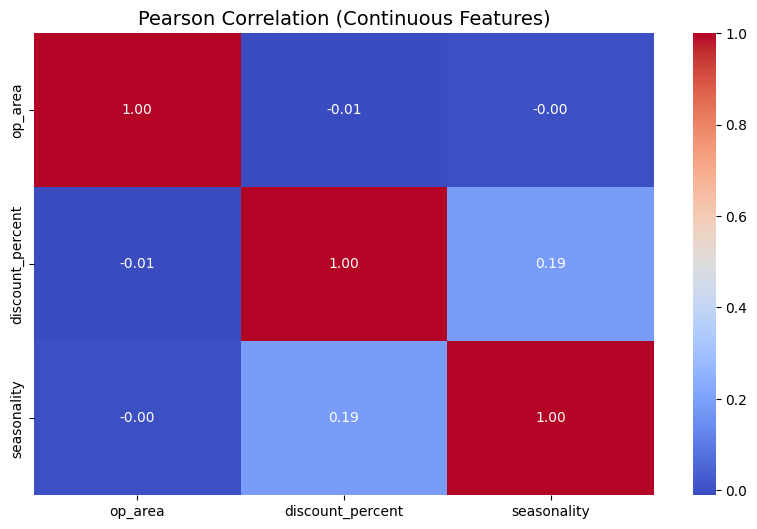


🔁 ----------------- CRAMÉR'S V CORRELATION (CATEGORICAL) ---------------- 🔁



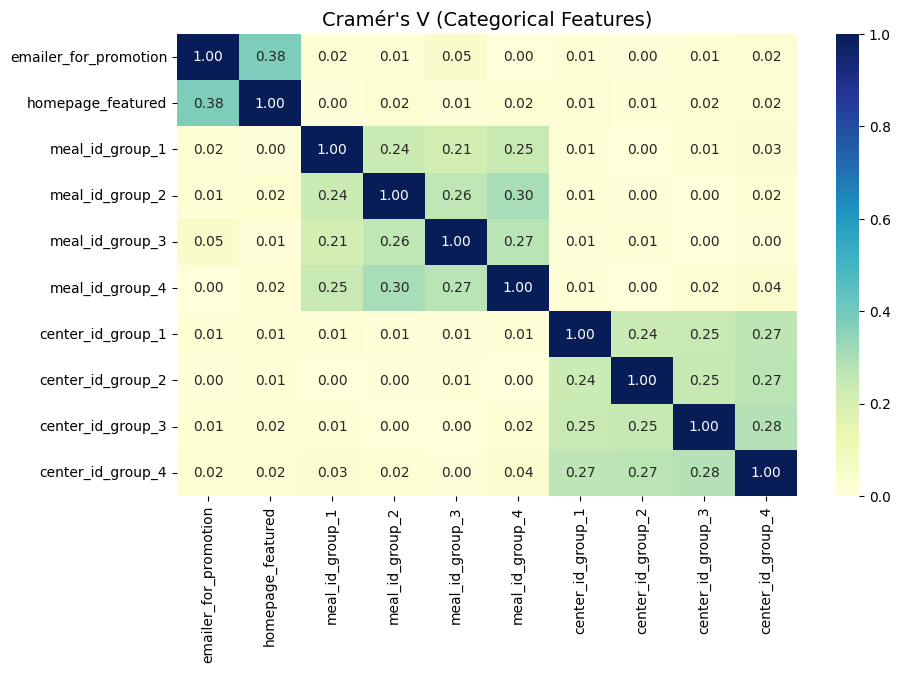


🧮 ----------------- VARIANCE INFLATION FACTOR (VIF) ----------------- 🧮

              feature       VIF
                const 12.613362
              op_area  2.035253
     discount_percent  1.392345
          seasonality  1.060501
emailer_for_promotion  1.413703
    homepage_featured  1.236781
      meal_id_group_1  1.603074
      meal_id_group_2  1.750420
      meal_id_group_3  1.675289
      meal_id_group_4  1.785785
    center_id_group_1  1.814204
    center_id_group_2  1.946473
    center_id_group_3  2.125798
    center_id_group_4  3.454045


In [ ]:
num_cols = ['op_area', 'discount_percent', 'seasonality']
cat_cols = ['emailer_for_promotion', 'homepage_featured',
            'meal_id_group_1', 'meal_id_group_2', 'meal_id_group_3', 'meal_id_group_4',
            'center_id_group_1', 'center_id_group_2', 'center_id_group_3', 'center_id_group_4']

assumptions_pre(X_scaled, num_cols, cat_cols)



In [ ]:
X = sm.add_constant(X_scaled)



# Fit the OLS model
model = sm.OLS(Y, X).fit()

# Show the summary of the model
print(model.summary())


                            OLS Regression Results                            
Dep. Variable:         log_num_orders   R-squared:                       0.679
Model:                            OLS   Adj. R-squared:                  0.679
Method:                 Least Squares   F-statistic:                 5.934e+04
Date:                Thu, 24 Apr 2025   Prob (F-statistic):               0.00
Time:                        08:48:33   Log-Likelihood:            -3.6915e+05
No. Observations:              364322   AIC:                         7.383e+05
Df Residuals:                  364308   BIC:                         7.385e+05
Df Model:                          13                                         
Covariance Type:            nonrobust                                         
                            coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------
const                     3.14


📈 ------------------ LINEARITY + HOMOSCEDASTICITY ------------------ 📈


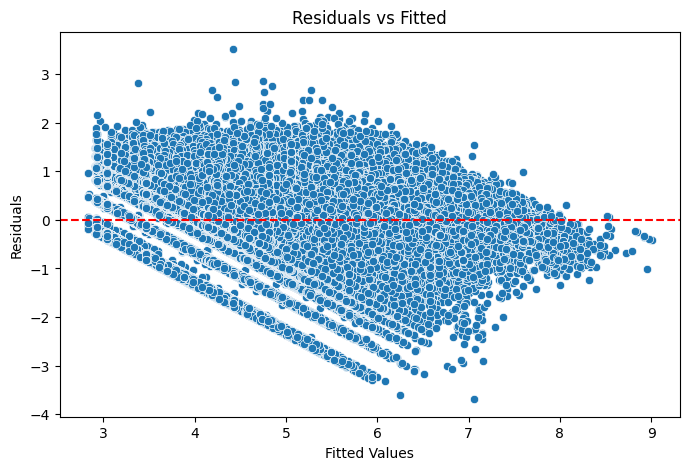


📊 ------------------ NORMALITY OF RESIDUALS ------------------ 📊


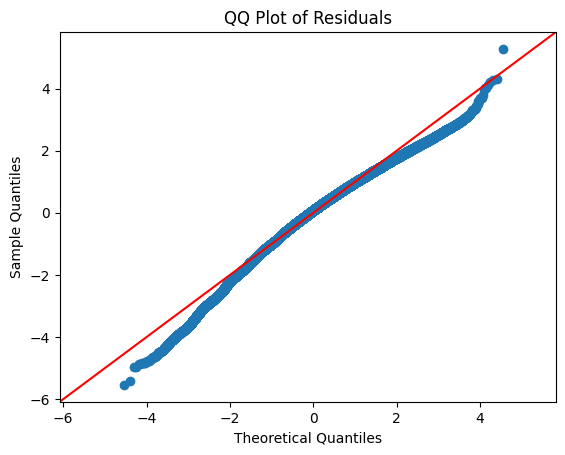

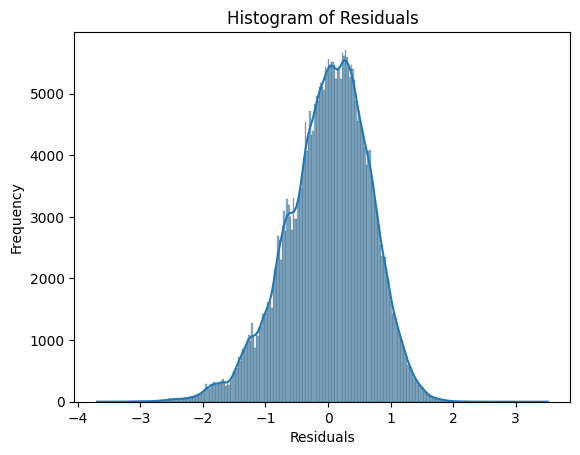

In [ ]:
assumptions_post(model, X, Y)

In [ ]:
rmsle(model, X, Y)

0.6665153491790331

## Test Time!

### Feature Conforming

In [ ]:
df_test_stratified_1 = seasonal_incorporation(df_train_stratified_1, df_test_stratified_1)

<ipython-input-175-c95ab83d473d>:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df_test['seasonality'].fillna(0, inplace=True)


In [ ]:
df_test_stratified_1  = log_it(df_test_stratified_1, 'num_orders')
df_test_stratified_1

,id,week,center_id,meal_id,checkout_price,base_price,emailer_for_promotion,homepage_featured,num_orders,category,cuisine,city_code,region_code,center_type,op_area,discount_percent,seasonal_week,seasonality,log_num_orders
0,1323770,117,10,1062,131.95,182.36,0,1,1093,Beverages,Italian,590,56,TYPE_B,6.3,27.643123,13,96.933212,6.997596
1,1323770,117,10,1062,131.95,182.36,0,1,1093,Beverages,Italian,590,56,TYPE_B,6.3,27.643123,13,96.933212,6.997596
2,1469984,118,10,1062,162.96,183.36,0,0,1067,Beverages,Italian,590,56,TYPE_B,6.3,11.125654,14,218.365905,6.973543
3,1469984,118,10,1062,162.96,183.36,0,0,1067,Beverages,Italian,590,56,TYPE_B,6.3,11.125654,14,218.365905,6.973543
4,1397783,119,10,1062,193.06,193.06,0,0,1160,Beverages,Italian,590,56,TYPE_B,6.3,0.000000,15,188.808212,7.057037
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
170814,1255251,112,186,2956,583.03,581.03,0,0,82,Fish,Continental,649,34,TYPE_A,3.4,-0.344216,8,0.000000,4.418841
170815,1436164,113,186,2956,583.03,582.03,0,0,40,Fish,Continental,649,34,TYPE_A,3.4,-0.171812,9,0.000000,3.713572
170816,1000576,114,186,2956,583.03,581.03,0,0,27,Fish,Continental,649,34,TYPE_A,3.4,-0.344216,10,0.000000,3.332205
170817,1429037,115,186,2956,581.03,583.03,0,0,15,Fish,Continental,649,34,TYPE_A,3.4,0.343036,11,0.000000,2.772589


In [ ]:
df_test_stratified_1 =  apply_bins_to_test(df_test_stratified_1, bin_maps, ['meal_id', 'center_id'])


### Transforming and Prediction

In [ ]:
X_test = df_test_stratified_1[[ 'emailer_for_promotion', 'homepage_featured',
                                'op_area',
                                'discount_percent', 'seasonality', 'meal_id_group_1', 'meal_id_group_2', 'meal_id_group_3',
                                'meal_id_group_4', 'center_id_group_1', 'center_id_group_2', 'center_id_group_3', 'center_id_group_4']]

X_test_scaled, _ = scale_numeric_features(
    X_test,
    ['op_area', 'discount_percent', 'seasonality'],
    scaler=trained_scaler,
    fit=False
)

X_test_scaled = sm.add_constant(X_test_scaled)  # Add intercept column


In [ ]:
rmsle(model, X_test_scaled, df_test_stratified_1['log_num_orders'])

0.7007518269831491

# OLS 2 [Target Encoded]

## Train Time!

### Feature Engineering

In [ ]:
df_train_stratified_1 = df_train_stratified.copy()
df_test_stratified_1 = df_test_stratified.copy()

In [ ]:
df_train_stratified_1, target_maps = target_encode_train(
    df_train_stratified_1,
    group_cols=['meal_id', 'center_id'],
    target_col='num_orders'
)


In [ ]:
df_train_stratified_1['op_area_sq'] = df_train_stratified_1['op_area'] ** 2

In [ ]:
df_train_stratified_1 = log_it(df_train_stratified_1, 'num_orders')
df_train_stratified_1 = add_seasonality_feature(df_train_stratified_1)

<ipython-input-13-bd44f4a44d6f>:27: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  seasonal_series = df.groupby(group_cols).apply(lambda x: seasonality_func(x))


In [ ]:
df_train_stratified_1

,id,week,center_id,meal_id,checkout_price,base_price,emailer_for_promotion,homepage_featured,num_orders,category,...,city_code,region_code,center_type,op_area,discount_percent,meal_id_encoded,center_id_encoded,op_area_sq,log_num_orders,seasonality
0,1436842,1,10,1062,181.39,181.39,0,0,865.0,Beverages,...,590,56,TYPE_B,6.3,0.000000,424.966509,453.409730,39.69,6.763885,-9.220634
1,1205013,2,10,1062,183.36,182.36,0,0,782.0,Beverages,...,590,56,TYPE_B,6.3,-0.548366,424.966509,453.409730,39.69,6.663133,-469.999480
2,1447751,3,10,1062,184.36,182.36,0,0,851.0,Beverages,...,590,56,TYPE_B,6.3,-1.096732,424.966509,453.409730,39.69,6.747587,101.413982
3,1014968,4,10,1062,182.36,183.36,0,0,1202.0,Beverages,...,590,56,TYPE_B,6.3,0.545375,424.966509,453.409730,39.69,7.092574,-82.230249
4,1003563,5,10,1062,183.39,181.39,0,0,958.0,Beverages,...,590,56,TYPE_B,6.3,-1.102597,424.966509,453.409730,39.69,6.865891,99.673597
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
364317,1082692,99,186,2956,583.03,582.03,0,0,28.0,Fish,...,649,34,TYPE_A,3.4,-0.171812,84.113844,140.891071,11.56,3.367296,0.000000
364318,1214821,100,186,2956,486.03,581.03,0,0,40.0,Fish,...,649,34,TYPE_A,3.4,16.350275,84.113844,140.891071,11.56,3.713572,0.000000
364319,1308197,101,186,2956,485.03,581.03,0,0,13.0,Fish,...,649,34,TYPE_A,3.4,16.522383,84.113844,140.891071,11.56,2.639057,0.000000
364320,1071894,103,186,2956,582.03,581.03,0,0,40.0,Fish,...,649,34,TYPE_A,3.4,-0.172108,84.113844,140.891071,11.56,3.713572,0.000000


### Scaling and Regression

In [ ]:
# Define the target variable Y
Y = df_train_stratified_1['log_num_orders']

# Define the predictor variables X (excluding 'id', 'week', 'meal_id', 'center_id' which are likely categorical)
X = df_train_stratified_1[[ 'emailer_for_promotion', 'homepage_featured',
                          'op_area_sq',
                          'discount_percent', 'seasonality', 'meal_id_encoded', 'center_id_encoded']]


X_scaled, trained_scaler = scale_numeric_features(X, ['op_area_sq', 'discount_percent', 'seasonality'])




📊 ------------------ PEARSON CORRELATION (NUMERIC) ------------------ 📊



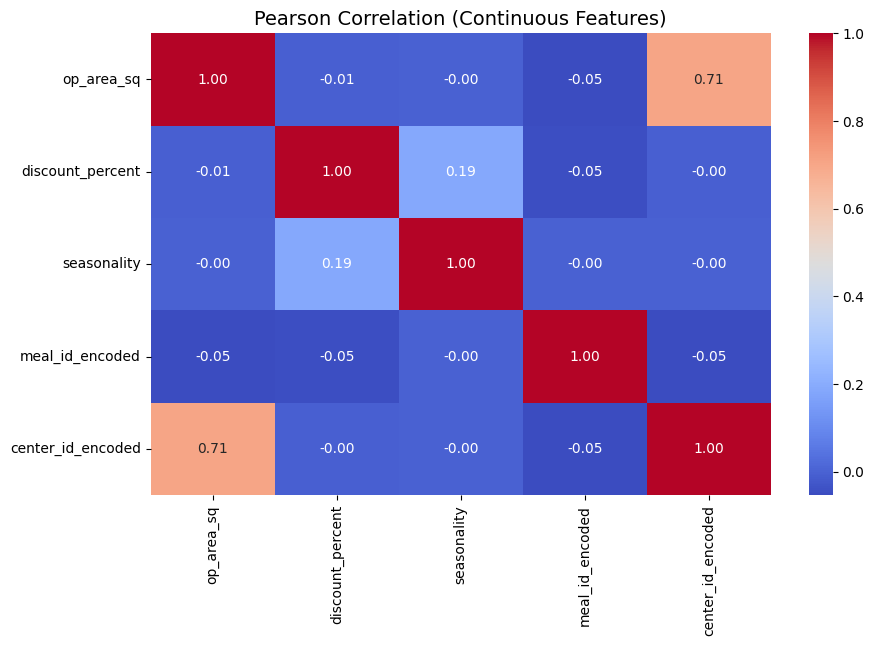


🔁 ----------------- CRAMÉR'S V CORRELATION (CATEGORICAL) ---------------- 🔁



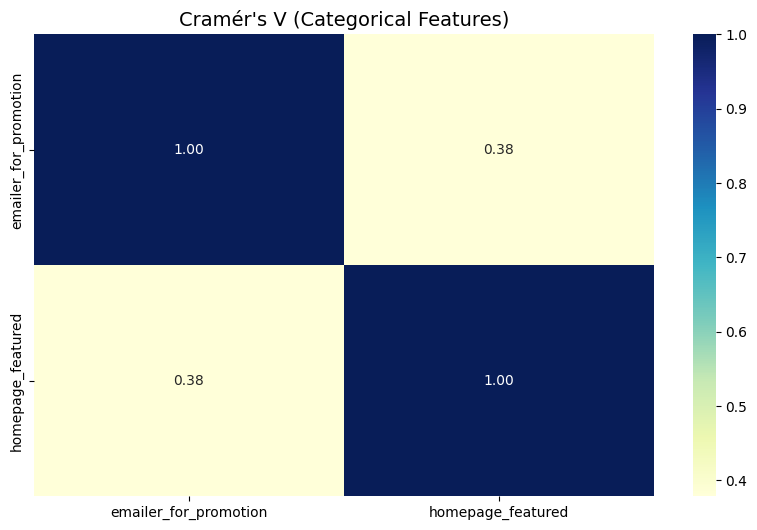


🧮 ----------------- VARIANCE INFLATION FACTOR (VIF) ----------------- 🧮

              feature       VIF
                const 16.798739
           op_area_sq  1.995842
     discount_percent  1.371390
          seasonality  1.060088
      meal_id_encoded  1.011593
    center_id_encoded  1.997591
emailer_for_promotion  1.408873
    homepage_featured  1.236195


,emailer_for_promotion,homepage_featured,op_area_sq,discount_percent,seasonality,meal_id_encoded,center_id_encoded
0,0,0,2.198122,-0.501399,-0.073172,424.966509,453.409730
1,0,0,2.198122,-0.549351,-3.776461,424.966509,453.409730
2,0,0,2.198122,-0.597303,0.816001,424.966509,453.409730
3,0,0,2.198122,-0.453709,-0.659952,424.966509,453.409730
4,0,0,2.198122,-0.597816,0.802014,424.966509,453.409730
...,...,...,...,...,...,...,...
364317,0,0,-0.635749,-0.516423,0.000935,84.113844,140.891071
364318,0,0,-0.635749,0.928356,0.000935,84.113844,140.891071
364319,0,0,-0.635749,0.943406,0.000935,84.113844,140.891071
364320,0,0,-0.635749,-0.516449,0.000935,84.113844,140.891071


In [ ]:
num_cols = ['op_area_sq', 'discount_percent', 'seasonality',  'meal_id_encoded', 'center_id_encoded'	]
cat_cols = ['emailer_for_promotion', 'homepage_featured']
assumptions_pre(X_scaled, num_cols, cat_cols)

X_scaled

In [ ]:
X = sm.add_constant(X_scaled)


# Fit the OLS model
model = sm.OLS(Y, X).fit()

# Show the summary of the model
print(model.summary())


                            OLS Regression Results                            
Dep. Variable:         log_num_orders   R-squared:                       0.639
Model:                            OLS   Adj. R-squared:                  0.639
Method:                 Least Squares   F-statistic:                 9.226e+04
Date:                Fri, 25 Apr 2025   Prob (F-statistic):               0.00
Time:                        05:57:31   Log-Likelihood:            -3.9049e+05
No. Observations:              364322   AIC:                         7.810e+05
Df Residuals:                  364314   BIC:                         7.811e+05
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
                            coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------
const                     2.88


📈 ------------------ LINEARITY + HOMOSCEDASTICITY ------------------ 📈


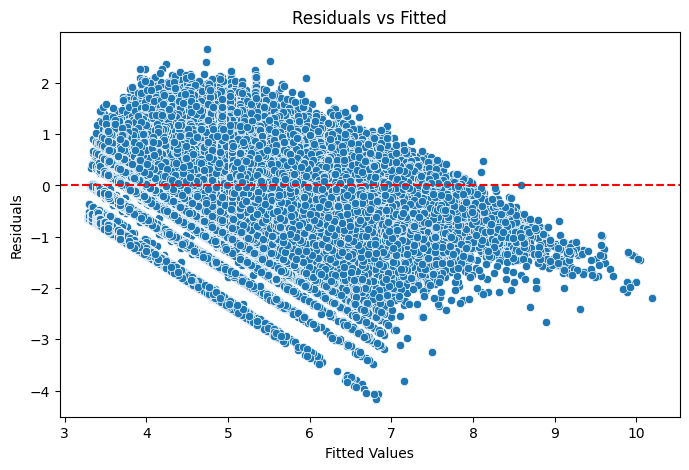


📊 ------------------ NORMALITY OF RESIDUALS ------------------ 📊


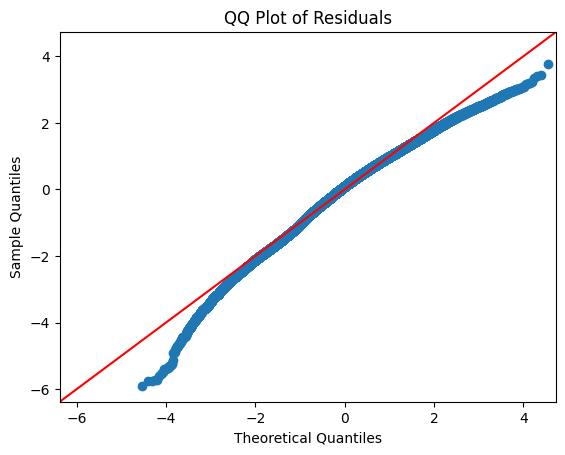

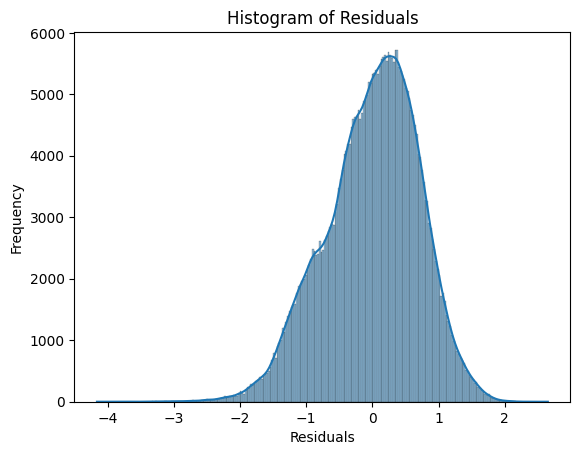

In [ ]:
assumptions_post(model, X, Y)

In [ ]:
rmsle(model, X, Y)

0.7067216339148344

## Test Time!

### Feature Conforming

In [ ]:
df_test_stratified_1 = seasonal_incorporation(df_train_stratified_1, df_test_stratified_1)

<ipython-input-14-c95ab83d473d>:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df_test['seasonality'].fillna(0, inplace=True)


In [ ]:
df_test_stratified_1  = log_it(df_test_stratified_1, 'num_orders')
df_test_stratified_1['op_area_sq'] = df_test_stratified_1['op_area'] ** 2

In [ ]:
df_test_stratified_1 =  target_encode_test(df_test_stratified_1, target_maps, ['meal_id', 'center_id'])

### Transforming and Prediction

In [ ]:
X_test = df_test_stratified_1[[ 'emailer_for_promotion', 'homepage_featured',
                                'op_area_sq',
                                'discount_percent', 'seasonality', 'meal_id_encoded', 'center_id_encoded']]

X_test_scaled, _ = scale_numeric_features(
    X_test,
    ['op_area_sq', 'discount_percent', 'seasonality'],
    scaler=trained_scaler,
    fit=False
)

X_test_scaled = sm.add_constant(X_test_scaled)  # Add intercept column


In [ ]:
rmsle(model, X_test_scaled, df_test_stratified_1['log_num_orders'])

0.7129333701504701

# Lasso [All Features]

## Train Time!

### Feature Engineering

In [ ]:
df_train_stratified_1 = df_train_stratified.copy()
df_test_stratified_1 = df_test_stratified.copy()

In [ ]:
df_train_stratified_1 = log_it(df_train_stratified_1, 'num_orders')
df_train_stratified_1 = add_seasonality_feature(df_train_stratified_1)

<ipython-input-374-bd44f4a44d6f>:27: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  seasonal_series = df.groupby(group_cols).apply(lambda x: seasonality_func(x))



📊 ------------------ PEARSON CORRELATION (NUMERIC) ------------------ 📊



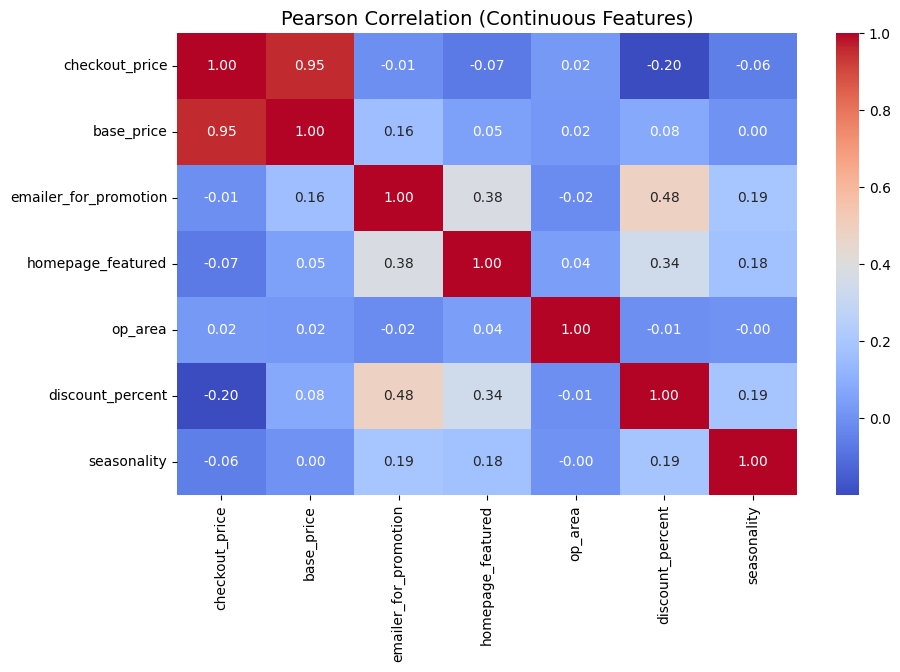


🔁 ----------------- CRAMÉR'S V CORRELATION (CATEGORICAL) ---------------- 🔁



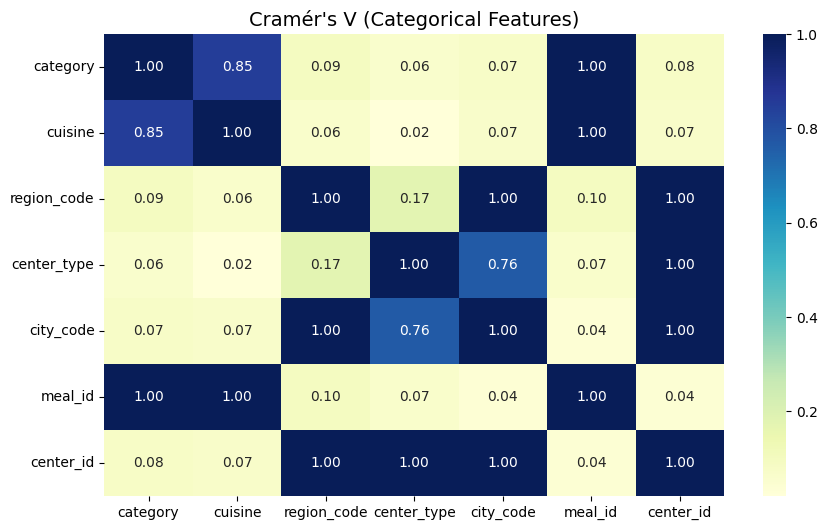

In [ ]:
num_cols = [
    'checkout_price', 'base_price',
    'emailer_for_promotion', 'homepage_featured',
    'op_area', 'discount_percent', 'seasonality'
]

cat_cols = [
    'category', 'cuisine', 'region_code',
    'center_type', 'city_code',
    'meal_id', 'center_id'
]

# Call your assumptions_pre or analysis function
pre_assumptions_analysis(df_train_stratified_1, num_cols, cat_cols)


In [ ]:
for col in ['category', 'cuisine', 'region_code', 'center_type']:
    df_train_stratified_1 = one_hot_encode_feature(df_train_stratified_1, col)


In [ ]:
df_train_stratified_1, target_maps = target_encode_train(
    df_train_stratified_1,
    group_cols=['city_code'],
    target_col='num_orders'
)


In [ ]:
df_train_stratified_1, bin_maps = generate_bins_from_train(df_train_stratified_1, ['meal_id', 'center_id'])


In [ ]:
df_train_stratified_1.columns

Index(['id', 'week', 'center_id', 'meal_id', 'checkout_price', 'base_price',
       'emailer_for_promotion', 'homepage_featured', 'num_orders', 'city_code',
       'op_area', 'discount_percent', 'log_num_orders', 'seasonality',
       'category_Biryani', 'category_Desert', 'category_Extras',
       'category_Fish', 'category_Other Snacks', 'category_Pasta',
       'category_Pizza', 'category_Rice Bowl', 'category_Salad',
       'category_Sandwich', 'category_Seafood', 'category_Soup',
       'category_Starters', 'cuisine_Indian', 'cuisine_Italian',
       'cuisine_Thai', 'region_code_34', 'region_code_35', 'region_code_56',
       'region_code_71', 'region_code_77', 'region_code_85', 'region_code_93',
       'center_type_TYPE_B', 'center_type_TYPE_C', 'city_code_encoded',
       'meal_id_group_1', 'meal_id_group_2', 'meal_id_group_3',
       'meal_id_group_4', 'center_id_group_1', 'center_id_group_2',
       'center_id_group_3', 'center_id_group_4'],
      dtype='object')

### Scaling and Regression

In [ ]:
# Define the target variable Y
Y = df_train_stratified_1['log_num_orders']

# Define the predictor variables X
X = df_train_stratified_1.loc[:, ~df_train_stratified_1.columns.isin(['log_num_orders', 'num_orders', 'id', 'week',  'center_id', 'meal_id', 'city_code'])]


X_scaled, trained_scaler = scale_numeric_features(X, ['op_area', 'discount_percent', 'seasonality'])

X_scaled = sm.add_constant(X_scaled)



In [ ]:
X_scaled.columns

Index(['const', 'checkout_price', 'base_price', 'emailer_for_promotion',
       'homepage_featured', 'op_area', 'discount_percent', 'seasonality',
       'category_Biryani', 'category_Desert', 'category_Extras',
       'category_Fish', 'category_Other Snacks', 'category_Pasta',
       'category_Pizza', 'category_Rice Bowl', 'category_Salad',
       'category_Sandwich', 'category_Seafood', 'category_Soup',
       'category_Starters', 'cuisine_Indian', 'cuisine_Italian',
       'cuisine_Thai', 'region_code_34', 'region_code_35', 'region_code_56',
       'region_code_71', 'region_code_77', 'region_code_85', 'region_code_93',
       'center_type_TYPE_B', 'center_type_TYPE_C', 'city_code_encoded',
       'meal_id_group_1', 'meal_id_group_2', 'meal_id_group_3',
       'meal_id_group_4', 'center_id_group_1', 'center_id_group_2',
       'center_id_group_3', 'center_id_group_4'],
      dtype='object')

In [ ]:
from sklearn.linear_model import LassoCV
from sklearn.metrics import mean_squared_error, r2_score

# Use X_scaled and Y from your existing setup
# X_scaled should be a DataFrame, Y is your log_num_orders target

# Initialize LassoCV with cross-validation to tune alpha
lasso = LassoCV(cv=5, random_state=42, max_iter=10000)

# Fit the model on training data
lasso.fit(X_scaled, Y)

# Print the best alpha chosen via cross-validation
print(f"Best alpha: {lasso.alpha_:.5f}")

# Coefficients
lasso_coeffs = pd.Series(lasso.coef_, index=X_scaled.columns)
print("\n🔍 Non-zero Coefficients in Lasso:")
print(lasso_coeffs[lasso_coeffs != 0].sort_values(ascending=False))

# Predictions on training set
train_preds = lasso.predict(X_scaled)

# Evaluation metrics
mse = mean_squared_error(Y, train_preds)
r2 = r2_score(Y, train_preds)
rmsle_score = rmsle(lasso, X_scaled, Y)

print(f"\n📊 Training MSE: {mse:.4f}")
print(f"📈 Training R² Score: {r2:.4f}")
print(f"📈 Training rmsle Score: {rmsle_score:.4f}")


Best alpha: 0.07203

🔍 Non-zero Coefficients in Lasso:
meal_id_group_4      0.996568
meal_id_group_3      0.456050
op_area              0.114754
seasonality          0.050530
base_price           0.003088
city_code_encoded    0.002525
checkout_price      -0.005105
cuisine_Indian      -0.068067
dtype: float64

📊 Training MSE: 0.7040
📈 Training R² Score: 0.4917
📈 Training rmsle Score: 0.8390



📈 ------------------ LINEARITY + HOMOSCEDASTICITY ------------------ 📈


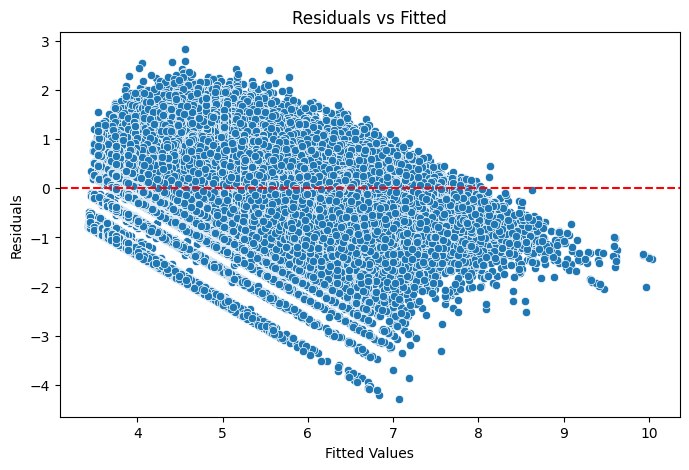


📊 ------------------ NORMALITY OF RESIDUALS ------------------ 📊


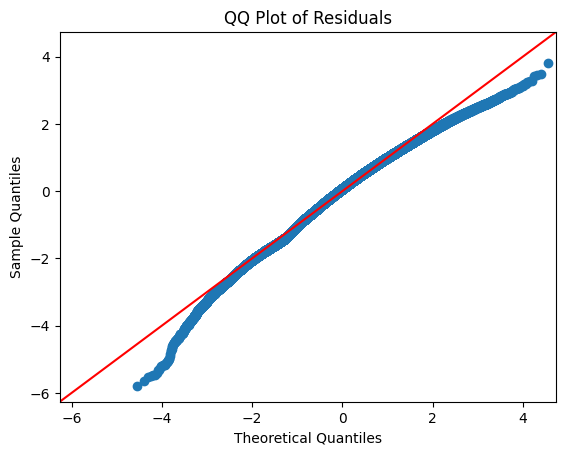

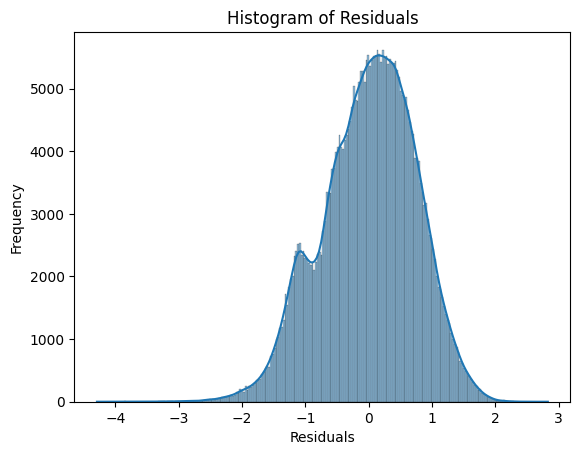

In [ ]:
assumptions_post(model, X, Y)

## Test Time!

### Feature Conforming

In [ ]:
df_test_stratified_1.columns

Index(['id', 'week', 'center_id', 'meal_id', 'checkout_price', 'base_price',
       'emailer_for_promotion', 'homepage_featured', 'num_orders', 'category',
       'cuisine', 'city_code', 'region_code', 'center_type', 'op_area',
       'discount_percent'],
      dtype='object')

In [ ]:
df_test_stratified_1 = seasonal_incorporation(df_train_stratified_1, df_test_stratified_1)

<ipython-input-375-c95ab83d473d>:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df_test['seasonality'].fillna(0, inplace=True)


In [ ]:
df_test_stratified_1  = log_it(df_test_stratified_1, 'num_orders')

In [ ]:
df_test_stratified.columns

Index(['id', 'week', 'center_id', 'meal_id', 'checkout_price', 'base_price',
       'emailer_for_promotion', 'homepage_featured', 'num_orders', 'category',
       'cuisine', 'city_code', 'region_code', 'center_type', 'op_area',
       'discount_percent'],
      dtype='object')

In [ ]:
for col in ['category', 'cuisine', 'region_code', 'center_type']:
    df_test_stratified_1 = one_hot_encode_feature(df_test_stratified_1, col)


In [ ]:
df_test_stratified_1 = target_encode_test(df_test_stratified_1, target_maps, ['city_code'])


In [ ]:
df_test_stratified_1 =  apply_bins_to_test(df_test_stratified_1, bin_maps, ['meal_id', 'center_id'])

In [ ]:
df_test_stratified_1.columns

Index(['id', 'week', 'center_id', 'meal_id', 'checkout_price', 'base_price',
       'emailer_for_promotion', 'homepage_featured', 'num_orders', 'city_code',
       'op_area', 'discount_percent', 'seasonal_week', 'seasonality',
       'log_num_orders', 'category_Biryani', 'category_Desert',
       'category_Extras', 'category_Fish', 'category_Other Snacks',
       'category_Pasta', 'category_Pizza', 'category_Rice Bowl',
       'category_Salad', 'category_Sandwich', 'category_Seafood',
       'category_Soup', 'category_Starters', 'cuisine_Indian',
       'cuisine_Italian', 'cuisine_Thai', 'region_code_34', 'region_code_35',
       'region_code_56', 'region_code_71', 'region_code_77', 'region_code_85',
       'region_code_93', 'center_type_TYPE_B', 'center_type_TYPE_C',
       'city_code_encoded', 'meal_id_group_1', 'meal_id_group_2',
       'meal_id_group_3', 'meal_id_group_4', 'center_id_group_1',
       'center_id_group_2', 'center_id_group_3', 'center_id_group_4'],
      dtype='objec

### Transforming and Prediction

In [ ]:
# Define the target variable Y
Y = df_test_stratified_1['log_num_orders']

# Define the predictor variables X
X_test = df_test_stratified_1.loc[:, ~df_test_stratified_1.columns.isin(['log_num_orders', 'num_orders', 'id', 'week',  'center_id', 'meal_id', 'city_code', 'seasonal_week'])]


X_test_scaled, _ = scale_numeric_features(
    X_test,
    ['op_area', 'discount_percent', 'seasonality'],
    scaler=trained_scaler,
    fit=False
)

X_test_scaled = sm.add_constant(X_test_scaled)  # Add intercept column


In [ ]:
# Step 1: Make predictions on the test set using the trained Lasso model
test_preds = lasso.predict(X_test_scaled)

# Step 2: Define the target variable for the test set (log-transformed target variable)
Y_test = df_test_stratified_1['log_num_orders']

# Step 3: Calculate the MSE and R² Score on the test set
from sklearn.metrics import mean_squared_error, r2_score

# Calculate MSE (Mean Squared Error)
test_mse = mean_squared_error(Y_test, test_preds)

# Calculate R² (coefficient of determination)
test_r2 = r2_score(Y_test, test_preds)

# Print results
print(f"\n📊 Test MSE: {test_mse:.4f}")
print(f"📈 Test R² Score: {test_r2:.4f}")



📊 Test MSE: 0.7184
📈 Test R² Score: 0.4709


# Ridge [All features]

## Train Time!

### Feature Engineering

In [ ]:
df_train_stratified_1 = df_train_stratified.copy()
df_test_stratified_1 = df_test_stratified.copy()

In [ ]:
df_train_stratified_1 = log_it(df_train_stratified_1, 'num_orders')
df_train_stratified_1 = add_seasonality_feature(df_train_stratified_1)

<ipython-input-174-bd44f4a44d6f>:27: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  seasonal_series = df.groupby(group_cols).apply(lambda x: seasonality_func(x))



📊 ------------------ PEARSON CORRELATION (NUMERIC) ------------------ 📊



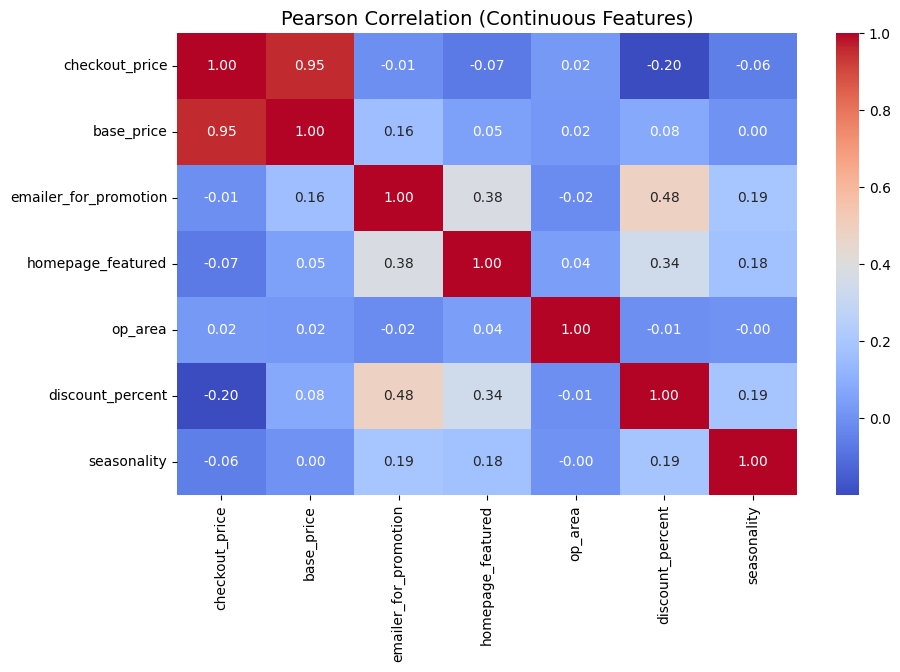


🔁 ----------------- CRAMÉR'S V CORRELATION (CATEGORICAL) ---------------- 🔁



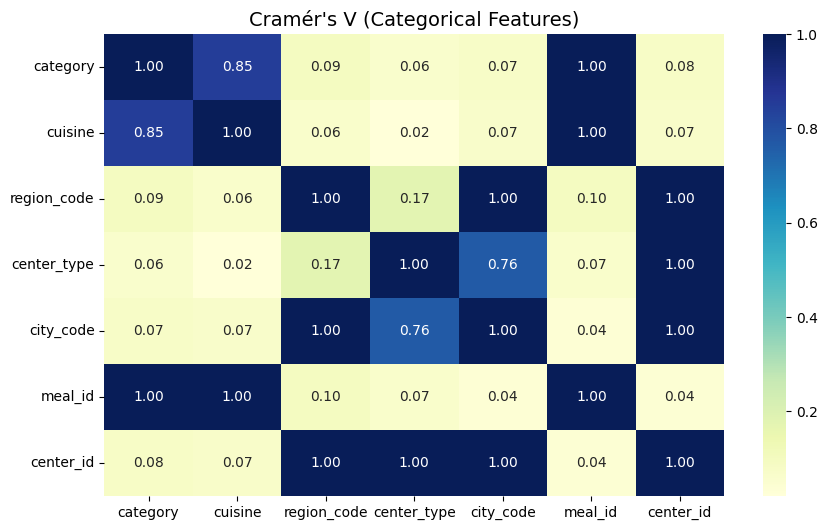

In [ ]:
num_cols = [
    'checkout_price', 'base_price',
    'emailer_for_promotion', 'homepage_featured',
    'op_area', 'discount_percent', 'seasonality'
]

cat_cols = [
    'category', 'cuisine', 'region_code',
    'center_type', 'city_code',
    'meal_id', 'center_id'
]

# Call your assumptions_pre or analysis function
pre_assumptions_analysis(df_train_stratified_1, num_cols, cat_cols)


In [ ]:
for col in ['category', 'cuisine', 'region_code', 'center_type']:
    df_train_stratified_1 = one_hot_encode_feature(df_train_stratified_1, col)


In [ ]:
df_train_stratified_1, target_maps = target_encode_train(
    df_train_stratified_1,
    group_cols=['city_code'],
    target_col='num_orders'
)


In [ ]:
df_train_stratified_1, bin_maps = generate_bins_from_train(df_train_stratified_1, ['meal_id', 'center_id'])


In [ ]:
df_train_stratified_1.columns

Index(['id', 'week', 'center_id', 'meal_id', 'checkout_price', 'base_price',
       'emailer_for_promotion', 'homepage_featured', 'num_orders', 'city_code',
       'op_area', 'discount_percent', 'log_num_orders', 'seasonality',
       'category_Biryani', 'category_Desert', 'category_Extras',
       'category_Fish', 'category_Other Snacks', 'category_Pasta',
       'category_Pizza', 'category_Rice Bowl', 'category_Salad',
       'category_Sandwich', 'category_Seafood', 'category_Soup',
       'category_Starters', 'cuisine_Indian', 'cuisine_Italian',
       'cuisine_Thai', 'region_code_34', 'region_code_35', 'region_code_56',
       'region_code_71', 'region_code_77', 'region_code_85', 'region_code_93',
       'center_type_TYPE_B', 'center_type_TYPE_C', 'city_code_encoded',
       'meal_id_group_1', 'meal_id_group_2', 'meal_id_group_3',
       'meal_id_group_4', 'center_id_group_1', 'center_id_group_2',
       'center_id_group_3', 'center_id_group_4'],
      dtype='object')

### Scaling and Regression

In [ ]:
# Define the target variable Y
Y = df_train_stratified_1['log_num_orders']

# Define the predictor variables X
X = df_train_stratified_1.loc[:, ~df_train_stratified_1.columns.isin(['log_num_orders', 'num_orders', 'id', 'week',  'center_id', 'meal_id', 'city_code'])]


X_scaled, trained_scaler = scale_numeric_features(X, ['op_area', 'discount_percent', 'seasonality'])

X_scaled = sm.add_constant(X_scaled)



In [ ]:
X_scaled.columns

Index(['const', 'checkout_price', 'base_price', 'emailer_for_promotion',
       'homepage_featured', 'op_area', 'discount_percent', 'seasonality',
       'category_Biryani', 'category_Desert', 'category_Extras',
       'category_Fish', 'category_Other Snacks', 'category_Pasta',
       'category_Pizza', 'category_Rice Bowl', 'category_Salad',
       'category_Sandwich', 'category_Seafood', 'category_Soup',
       'category_Starters', 'cuisine_Indian', 'cuisine_Italian',
       'cuisine_Thai', 'region_code_34', 'region_code_35', 'region_code_56',
       'region_code_71', 'region_code_77', 'region_code_85', 'region_code_93',
       'center_type_TYPE_B', 'center_type_TYPE_C', 'city_code_encoded',
       'meal_id_group_1', 'meal_id_group_2', 'meal_id_group_3',
       'meal_id_group_4', 'center_id_group_1', 'center_id_group_2',
       'center_id_group_3', 'center_id_group_4'],
      dtype='object')

In [ ]:
from sklearn.linear_model import RidgeCV
from sklearn.metrics import mean_squared_error, r2_score

# Use X_scaled and Y from your existing setup
# X_scaled should be a DataFrame, Y is your log_num_orders target

# Initialize RidgeCV with cross-validation to tune alpha
# You can provide a list of alphas to search over
alphas = [200, 300, 225, 275, 250]
ridge = RidgeCV(alphas=alphas, cv=5)

# Fit the model on training data
ridge.fit(X_scaled, Y)

# Print the best alpha chosen via cross-validation
print(f"Best alpha: {ridge.alpha_:.5f}")

# Coefficients
ridge_coeffs = pd.Series(ridge.coef_, index=X_scaled.columns)
print("\n🧮 Ridge Coefficients:")
print(ridge_coeffs.sort_values(ascending=False))

# Predictions on training set
train_preds = ridge.predict(X_scaled)

# Evaluation metrics
mse = mean_squared_error(Y, train_preds)
r2 = r2_score(Y, train_preds)

print(f"\n📊 Training MSE: {mse:.4f}")
print(f"📈 Training R² Score: {r2:.4f}")


Best alpha: 200.00000

🧮 Ridge Coefficients:
meal_id_group_4          1.500090
category_Rice Bowl       1.075049
meal_id_group_3          1.026573
center_id_group_4        0.687993
meal_id_group_2          0.543263
center_id_group_3        0.459370
homepage_featured        0.388748
category_Desert          0.381385
center_id_group_2        0.307315
category_Salad           0.300035
meal_id_group_1          0.258779
emailer_for_promotion    0.258133
center_id_group_1        0.210592
category_Pizza           0.129831
seasonality              0.105859
center_type_TYPE_B       0.098764
op_area                  0.071336
category_Sandwich        0.067502
region_code_85           0.031501
region_code_34           0.003203
base_price               0.001549
city_code_encoded        0.000799
const                    0.000000
checkout_price          -0.003625
region_code_56          -0.008900
region_code_77          -0.011934
region_code_35          -0.014545
discount_percent        -0.031867
reg

In [ ]:
#assumptions_post(ridge, X, Y)

## Test Time!

### Feature Conforming

In [ ]:
df_test_stratified_1.columns

Index(['id', 'week', 'center_id', 'meal_id', 'checkout_price', 'base_price',
       'emailer_for_promotion', 'homepage_featured', 'num_orders', 'category',
       'cuisine', 'city_code', 'region_code', 'center_type', 'op_area',
       'discount_percent'],
      dtype='object')

In [ ]:
df_test_stratified_1 = seasonal_incorporation(df_train_stratified_1, df_test_stratified_1)

<ipython-input-175-c95ab83d473d>:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df_test['seasonality'].fillna(0, inplace=True)


In [ ]:
df_test_stratified_1  = log_it(df_test_stratified_1, 'num_orders')

In [ ]:
df_test_stratified.columns

Index(['id', 'week', 'center_id', 'meal_id', 'checkout_price', 'base_price',
       'emailer_for_promotion', 'homepage_featured', 'num_orders', 'category',
       'cuisine', 'city_code', 'region_code', 'center_type', 'op_area',
       'discount_percent'],
      dtype='object')

In [ ]:
for col in ['category', 'cuisine', 'region_code', 'center_type']:
    df_test_stratified_1 = one_hot_encode_feature(df_test_stratified_1, col)


In [ ]:
df_test_stratified_1 = target_encode_test(df_test_stratified_1, target_maps, ['city_code'])


In [ ]:
df_test_stratified_1 =  apply_bins_to_test(df_test_stratified_1, bin_maps, ['meal_id', 'center_id'])

In [ ]:
df_test_stratified_1.columns

Index(['id', 'week', 'center_id', 'meal_id', 'checkout_price', 'base_price',
       'emailer_for_promotion', 'homepage_featured', 'num_orders', 'city_code',
       'op_area', 'discount_percent', 'seasonal_week', 'seasonality',
       'log_num_orders', 'category_Biryani', 'category_Desert',
       'category_Extras', 'category_Fish', 'category_Other Snacks',
       'category_Pasta', 'category_Pizza', 'category_Rice Bowl',
       'category_Salad', 'category_Sandwich', 'category_Seafood',
       'category_Soup', 'category_Starters', 'cuisine_Indian',
       'cuisine_Italian', 'cuisine_Thai', 'region_code_34', 'region_code_35',
       'region_code_56', 'region_code_71', 'region_code_77', 'region_code_85',
       'region_code_93', 'center_type_TYPE_B', 'center_type_TYPE_C',
       'city_code_encoded', 'meal_id_group_1', 'meal_id_group_2',
       'meal_id_group_3', 'meal_id_group_4', 'center_id_group_1',
       'center_id_group_2', 'center_id_group_3', 'center_id_group_4'],
      dtype='objec

### Transforming and Prediction

In [ ]:
# Define the target variable Y
Y = df_test_stratified_1['log_num_orders']

# Define the predictor variables X
X_test = df_test_stratified_1.loc[:, ~df_test_stratified_1.columns.isin(['log_num_orders', 'num_orders', 'id', 'week',  'center_id', 'meal_id', 'city_code', 'seasonal_week'])]


X_test_scaled, _ = scale_numeric_features(
    X_test,
    ['op_area', 'discount_percent', 'seasonality'],
    scaler=trained_scaler,
    fit=False
)

X_test_scaled = sm.add_constant(X_test_scaled)  # Add intercept column


In [ ]:
# Step 1: Make predictions on the test set using the trained Ridge model
test_preds = ridge.predict(X_test_scaled)

# Step 2: Define the target variable for the test set
Y_test = df_test_stratified_1['log_num_orders']

# Step 3: Calculate the MSE and R² Score on the test set
from sklearn.metrics import mean_squared_error, r2_score

# Calculate MSE
test_mse = mean_squared_error(Y_test, test_preds)

# Calculate R²
test_r2 = r2_score(Y_test, test_preds)

# Print results
print(f"\n📊 Ridge Test MSE: {test_mse:.4f}")
print(f"📈 Ridge Test R² Score: {test_r2:.4f}")



📊 Ridge Test MSE: 0.4492
📈 Ridge Test R² Score: 0.6691


# Ridge [Important Features]

## Train Time!

### Feature Engineering

In [ ]:
df_train_stratified_1 = df_train_stratified.copy()
df_test_stratified_1 = df_test_stratified.copy()

In [ ]:
df_train_stratified_1, bin_maps = generate_bins_from_train(df_train_stratified_1, ['meal_id', 'center_id'])

df_train_stratified_1 = log_it(df_train_stratified_1, 'num_orders')
df_train_stratified_1 = add_seasonality_feature(df_train_stratified_1)



<ipython-input-374-bd44f4a44d6f>:27: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  seasonal_series = df.groupby(group_cols).apply(lambda x: seasonality_func(x))


### Scaling and Regression

In [ ]:
# Define the target variable Y
Y = df_train_stratified_1['log_num_orders']

# Define the predictor variables X (excluding 'id', 'week', 'meal_id', 'center_id' which are likely categorical)
X = df_train_stratified_1[[ 'emailer_for_promotion', 'homepage_featured',
                          'op_area',
                          'discount_percent', 'seasonality', 'meal_id_group_1', 'meal_id_group_2', 'meal_id_group_3',
                          'meal_id_group_4', 'center_id_group_1', 'center_id_group_2', 'center_id_group_3', 'center_id_group_4']]


X_scaled, trained_scaler = scale_numeric_features(X, ['op_area', 'discount_percent', 'seasonality'])
X_scaled = sm.add_constant(X_scaled)




In [ ]:
X_scaled.columns

Index(['const', 'emailer_for_promotion', 'homepage_featured', 'op_area',
       'discount_percent', 'seasonality', 'meal_id_group_1', 'meal_id_group_2',
       'meal_id_group_3', 'meal_id_group_4', 'center_id_group_1',
       'center_id_group_2', 'center_id_group_3', 'center_id_group_4'],
      dtype='object')

In [ ]:
from sklearn.linear_model import RidgeCV
from sklearn.metrics import mean_squared_error, r2_score

# Use X_scaled and Y from your existing setup
# X_scaled should be a DataFrame, Y is your log_num_orders target

# Initialize RidgeCV with cross-validation to tune alpha
# You can provide a list of alphas to search over
alphas = [0.01, 0.1, 1, 10, 100]
ridge = RidgeCV(alphas=alphas, cv=5)

# Fit the model on training data
ridge.fit(X_scaled, Y)

# Print the best alpha chosen via cross-validation
print(f"Best alpha: {ridge.alpha_:.5f}")

# Coefficients
ridge_coeffs = pd.Series(ridge.coef_, index=X_scaled.columns)
print("\n🧮 Ridge Coefficients:")
print(ridge_coeffs.sort_values(ascending=False))

# Predictions on training set
train_preds = ridge.predict(X_scaled)

# Evaluation metrics
mse = mean_squared_error(Y, train_preds)
r2 = r2_score(Y, train_preds)
rmsle_score = rmsle(ridge, X_scaled, Y)

print(f"\n📊 Training MSE: {mse:.4f}")
print(f"📈 Training R² Score: {r2:.4f}")
print(f"📈 Training rmsle Score: {rmsle_score}")


Best alpha: 1.00000

🧮 Ridge Coefficients:
meal_id_group_4          2.407205
meal_id_group_3          1.775928
meal_id_group_2          1.147260
center_id_group_4        0.829333
center_id_group_3        0.508393
meal_id_group_1          0.426219
homepage_featured        0.412233
center_id_group_2        0.342825
emailer_for_promotion    0.294263
center_id_group_1        0.238494
seasonality              0.112780
discount_percent         0.096456
op_area                  0.089806
const                    0.000000
dtype: float64

📊 Training MSE: 0.4442
📈 Training R² Score: 0.6792
📈 Training rmsle Score: 0.6665153507392894


In [ ]:
#assumptions_post(ridge, X, Y)

## Test Time!

### Feature Conforming

In [ ]:
df_test_stratified_1.columns

Index(['id', 'week', 'center_id', 'meal_id', 'checkout_price', 'base_price',
       'emailer_for_promotion', 'homepage_featured', 'num_orders', 'category',
       'cuisine', 'city_code', 'region_code', 'center_type', 'op_area',
       'discount_percent'],
      dtype='object')

In [ ]:
df_test_stratified_1 = seasonal_incorporation(df_train_stratified_1, df_test_stratified_1)

<ipython-input-375-c95ab83d473d>:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df_test['seasonality'].fillna(0, inplace=True)


In [ ]:
df_test_stratified_1  = log_it(df_test_stratified_1, 'num_orders')

In [ ]:
df_test_stratified.columns

Index(['id', 'week', 'center_id', 'meal_id', 'checkout_price', 'base_price',
       'emailer_for_promotion', 'homepage_featured', 'num_orders', 'category',
       'cuisine', 'city_code', 'region_code', 'center_type', 'op_area',
       'discount_percent'],
      dtype='object')

In [ ]:
df_test_stratified_1 =  apply_bins_to_test(df_test_stratified_1, bin_maps, ['meal_id', 'center_id'])


In [ ]:
df_test_stratified_1.columns

Index(['id', 'week', 'center_id', 'meal_id', 'checkout_price', 'base_price',
       'emailer_for_promotion', 'homepage_featured', 'num_orders', 'category',
       'cuisine', 'city_code', 'region_code', 'center_type', 'op_area',
       'discount_percent', 'seasonal_week', 'seasonality', 'log_num_orders',
       'meal_id_group_1', 'meal_id_group_2', 'meal_id_group_3',
       'meal_id_group_4', 'center_id_group_1', 'center_id_group_2',
       'center_id_group_3', 'center_id_group_4'],
      dtype='object')

### Transforming and Prediction

In [ ]:
X_test = df_test_stratified_1[[ 'emailer_for_promotion', 'homepage_featured',
                                'op_area',
                                'discount_percent', 'seasonality', 'meal_id_group_1', 'meal_id_group_2', 'meal_id_group_3',
                                'meal_id_group_4', 'center_id_group_1', 'center_id_group_2', 'center_id_group_3', 'center_id_group_4']]

X_test_scaled, _ = scale_numeric_features(
    X_test,
    ['op_area', 'discount_percent', 'seasonality'],
    scaler=trained_scaler,
    fit=False
)

X_test_scaled = sm.add_constant(X_test_scaled)  # Add intercept column


In [ ]:
# Step 1: Make predictions on the test set using the trained Ridge model
test_preds = ridge.predict(X_test_scaled)

# Step 2: Define the target variable for the test set
Y_test = df_test_stratified_1['log_num_orders']

# Step 3: Calculate the MSE and R² Score on the test set
from sklearn.metrics import mean_squared_error, r2_score

# Calculate MSE
test_mse = mean_squared_error(Y_test, test_preds)

# Calculate R²
test_r2 = r2_score(Y_test, test_preds)

# Print results
print(f"\n📊 Ridge Test MSE: {test_mse:.4f}")
print(f"📈 Ridge Test R² Score: {test_r2:.4f}")



📊 Ridge Test MSE: 0.4910
📈 Ridge Test R² Score: 0.6383


# Elastic Net [All features]

## Train Time!

### Feature Engineering

In [ ]:
df_train_stratified_1 = df_train_stratified.copy()
df_test_stratified_1 = df_test_stratified.copy()

In [ ]:
df_train_stratified_1 = log_it(df_train_stratified_1, 'num_orders')
df_train_stratified_1 = add_seasonality_feature(df_train_stratified_1)

<ipython-input-174-bd44f4a44d6f>:27: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  seasonal_series = df.groupby(group_cols).apply(lambda x: seasonality_func(x))



📊 ------------------ PEARSON CORRELATION (NUMERIC) ------------------ 📊



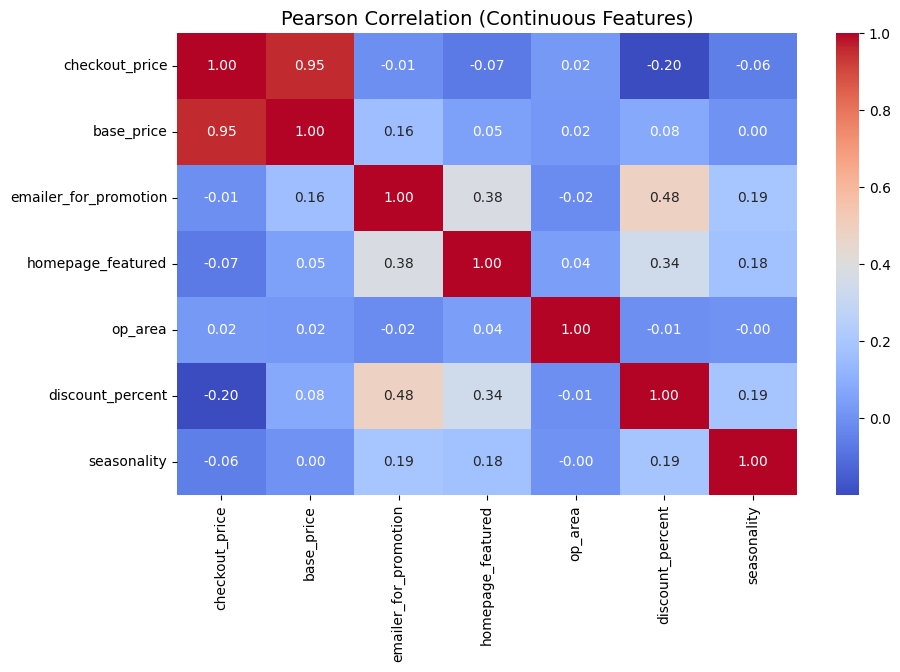


🔁 ----------------- CRAMÉR'S V CORRELATION (CATEGORICAL) ---------------- 🔁



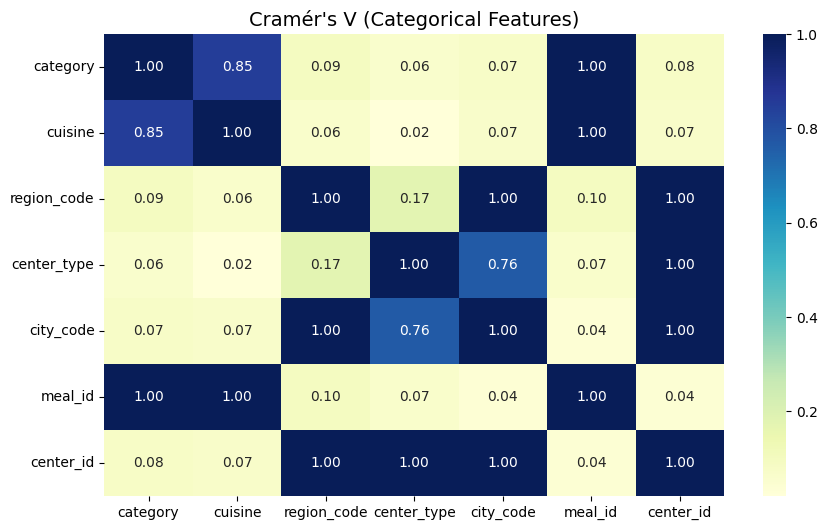

In [ ]:
num_cols = [
    'checkout_price', 'base_price',
    'emailer_for_promotion', 'homepage_featured',
    'op_area', 'discount_percent', 'seasonality'
]

cat_cols = [
    'category', 'cuisine', 'region_code',
    'center_type', 'city_code',
    'meal_id', 'center_id'
]

# Call your assumptions_pre or analysis function
pre_assumptions_analysis(df_train_stratified_1, num_cols, cat_cols)


In [ ]:
for col in ['category', 'cuisine', 'region_code', 'center_type']:
    df_train_stratified_1 = one_hot_encode_feature(df_train_stratified_1, col)


In [ ]:
df_train_stratified_1, target_maps = target_encode_train(
    df_train_stratified_1,
    group_cols=['city_code'],
    target_col='num_orders'
)


In [ ]:
df_train_stratified_1, bin_maps = generate_bins_from_train(df_train_stratified_1, ['meal_id', 'center_id'])


In [ ]:
df_train_stratified_1.columns

Index(['id', 'week', 'center_id', 'meal_id', 'checkout_price', 'base_price',
       'emailer_for_promotion', 'homepage_featured', 'num_orders', 'city_code',
       'op_area', 'discount_percent', 'log_num_orders', 'seasonality',
       'category_Biryani', 'category_Desert', 'category_Extras',
       'category_Fish', 'category_Other Snacks', 'category_Pasta',
       'category_Pizza', 'category_Rice Bowl', 'category_Salad',
       'category_Sandwich', 'category_Seafood', 'category_Soup',
       'category_Starters', 'cuisine_Indian', 'cuisine_Italian',
       'cuisine_Thai', 'region_code_34', 'region_code_35', 'region_code_56',
       'region_code_71', 'region_code_77', 'region_code_85', 'region_code_93',
       'center_type_TYPE_B', 'center_type_TYPE_C', 'city_code_encoded',
       'meal_id_group_1', 'meal_id_group_2', 'meal_id_group_3',
       'meal_id_group_4', 'center_id_group_1', 'center_id_group_2',
       'center_id_group_3', 'center_id_group_4'],
      dtype='object')

### Scaling and Regression

In [ ]:
# Define the target variable Y
Y = df_train_stratified_1['log_num_orders']

# Define the predictor variables X
X = df_train_stratified_1.loc[:, ~df_train_stratified_1.columns.isin(['log_num_orders', 'num_orders', 'id', 'week',  'center_id', 'meal_id', 'city_code'])]


X_scaled, trained_scaler = scale_numeric_features(X, ['op_area', 'discount_percent', 'seasonality'])

X_scaled = sm.add_constant(X_scaled)



In [ ]:
X_scaled.columns

Index(['const', 'checkout_price', 'base_price', 'emailer_for_promotion',
       'homepage_featured', 'op_area', 'discount_percent', 'seasonality',
       'category_Biryani', 'category_Desert', 'category_Extras',
       'category_Fish', 'category_Other Snacks', 'category_Pasta',
       'category_Pizza', 'category_Rice Bowl', 'category_Salad',
       'category_Sandwich', 'category_Seafood', 'category_Soup',
       'category_Starters', 'cuisine_Indian', 'cuisine_Italian',
       'cuisine_Thai', 'region_code_34', 'region_code_35', 'region_code_56',
       'region_code_71', 'region_code_77', 'region_code_85', 'region_code_93',
       'center_type_TYPE_B', 'center_type_TYPE_C', 'city_code_encoded',
       'meal_id_group_1', 'meal_id_group_2', 'meal_id_group_3',
       'meal_id_group_4', 'center_id_group_1', 'center_id_group_2',
       'center_id_group_3', 'center_id_group_4'],
      dtype='object')

In [ ]:
from sklearn.linear_model import ElasticNetCV
from sklearn.metrics import mean_squared_error, r2_score
import pandas as pd

# ElasticNetCV combines L1 and L2 regularization
# l1_ratio = 1.0 is Lasso, 0.0 is Ridge → you let CV find best mix

# Initialize ElasticNetCV with cross-validation to tune both alpha and l1_ratio
elastic_net = ElasticNetCV(
    l1_ratio=[.1, .3, .5, .7, .9, .95, .99, 1],  # 1 = Lasso, 0 = Ridge
    cv=5,
    random_state=42,
    max_iter=10000
)

# Fit model
elastic_net.fit(X_scaled, Y)

# Best parameters found
print(f"Best alpha: {elastic_net.alpha_:.5f}")
print(f"Best l1_ratio (mix of L1 & L2): {elastic_net.l1_ratio_:.2f}")

# Coefficients
enet_coeffs = pd.Series(elastic_net.coef_, index=X_scaled.columns)
print("\n🔍 Non-zero Coefficients in Elastic Net:")
print(enet_coeffs[enet_coeffs != 0].sort_values(ascending=False))

# Predictions
train_preds = elastic_net.predict(X_scaled)

# Evaluation
mse = mean_squared_error(Y, train_preds)
r2 = r2_score(Y, train_preds)

print(f"\n📊 Training MSE: {mse:.4f}")
print(f"📈 Training R² Score: {r2:.4f}")


Best alpha: 0.07203
Best l1_ratio (mix of L1 & L2): 1.00

🔍 Non-zero Coefficients in Elastic Net:
meal_id_group_4      0.996568
meal_id_group_3      0.456050
op_area              0.114754
seasonality          0.050530
base_price           0.003088
city_code_encoded    0.002525
checkout_price      -0.005105
cuisine_Indian      -0.068067
dtype: float64

📊 Training MSE: 0.7040
📈 Training R² Score: 0.4917


In [ ]:
#assumptions_post(model, X, Y)

## Test Time!

### Feature Conforming

In [ ]:
df_test_stratified_1.columns

Index(['id', 'week', 'center_id', 'meal_id', 'checkout_price', 'base_price',
       'emailer_for_promotion', 'homepage_featured', 'num_orders', 'category',
       'cuisine', 'city_code', 'region_code', 'center_type', 'op_area',
       'discount_percent'],
      dtype='object')

In [ ]:
df_test_stratified_1 = seasonal_incorporation(df_train_stratified_1, df_test_stratified_1)

<ipython-input-175-c95ab83d473d>:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df_test['seasonality'].fillna(0, inplace=True)


In [ ]:
df_test_stratified_1  = log_it(df_test_stratified_1, 'num_orders')

In [ ]:
df_test_stratified.columns

Index(['id', 'week', 'center_id', 'meal_id', 'checkout_price', 'base_price',
       'emailer_for_promotion', 'homepage_featured', 'num_orders', 'category',
       'cuisine', 'city_code', 'region_code', 'center_type', 'op_area',
       'discount_percent'],
      dtype='object')

In [ ]:
for col in ['category', 'cuisine', 'region_code', 'center_type']:
    df_test_stratified_1 = one_hot_encode_feature(df_test_stratified_1, col)


In [ ]:
df_test_stratified_1 = target_encode_test(df_test_stratified_1, target_maps, ['city_code'])


In [ ]:
df_test_stratified_1 =  apply_bins_to_test(df_test_stratified_1, bin_maps, ['meal_id', 'center_id'])

In [ ]:
df_test_stratified_1.columns

Index(['id', 'week', 'center_id', 'meal_id', 'checkout_price', 'base_price',
       'emailer_for_promotion', 'homepage_featured', 'num_orders', 'city_code',
       'op_area', 'discount_percent', 'seasonal_week', 'seasonality',
       'log_num_orders', 'category_Biryani', 'category_Desert',
       'category_Extras', 'category_Fish', 'category_Other Snacks',
       'category_Pasta', 'category_Pizza', 'category_Rice Bowl',
       'category_Salad', 'category_Sandwich', 'category_Seafood',
       'category_Soup', 'category_Starters', 'cuisine_Indian',
       'cuisine_Italian', 'cuisine_Thai', 'region_code_34', 'region_code_35',
       'region_code_56', 'region_code_71', 'region_code_77', 'region_code_85',
       'region_code_93', 'center_type_TYPE_B', 'center_type_TYPE_C',
       'city_code_encoded', 'meal_id_group_1', 'meal_id_group_2',
       'meal_id_group_3', 'meal_id_group_4', 'center_id_group_1',
       'center_id_group_2', 'center_id_group_3', 'center_id_group_4'],
      dtype='objec

### Transforming and Prediction

In [ ]:
# Define the target variable Y
Y = df_test_stratified_1['log_num_orders']

# Define the predictor variables X
X_test = df_test_stratified_1.loc[:, ~df_test_stratified_1.columns.isin(['log_num_orders', 'num_orders', 'id', 'week',  'center_id', 'meal_id', 'city_code', 'seasonal_week'])]


X_test_scaled, _ = scale_numeric_features(
    X_test,
    ['op_area', 'discount_percent', 'seasonality'],
    scaler=trained_scaler,
    fit=False
)

X_test_scaled = sm.add_constant(X_test_scaled)  # Add intercept column


In [ ]:
# Step 1: Make predictions on the test set using the trained Elastic Net model
test_preds = elastic_net.predict(X_test_scaled)

# Step 2: Define the target variable for the test set (log-transformed target variable)
Y_test = df_test_stratified_1['log_num_orders']

# Step 3: Calculate the MSE and R² Score on the test set
from sklearn.metrics import mean_squared_error, r2_score

# Calculate MSE (Mean Squared Error)
test_mse = mean_squared_error(Y_test, test_preds)

# Calculate R² (coefficient of determination)
test_r2 = r2_score(Y_test, test_preds)

# Print results
print(f"\n📊 Test MSE (Elastic Net): {test_mse:.4f}")
print(f"📈 Test R² Score (Elastic Net): {test_r2:.4f}")



📊 Test MSE (Elastic Net): 0.7184
📈 Test R² Score (Elastic Net): 0.4709


# Elastic Net (Important Features)

## Train Time!

### Feature Engineering

In [ ]:
df_train_stratified_1 = df_train_stratified.copy()
df_test_stratified_1 = df_test_stratified.copy()

In [ ]:
df_train_stratified_1, bin_maps = generate_bins_from_train(df_train_stratified_1, ['meal_id', 'center_id'])

df_train_stratified_1 = log_it(df_train_stratified_1, 'num_orders')
df_train_stratified_1 = add_seasonality_feature(df_train_stratified_1)



<ipython-input-174-bd44f4a44d6f>:27: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  seasonal_series = df.groupby(group_cols).apply(lambda x: seasonality_func(x))


### Scaling and Regression

In [ ]:
# Define the target variable Y
Y = df_train_stratified_1['log_num_orders']

# Define the predictor variables X (excluding 'id', 'week', 'meal_id', 'center_id' which are likely categorical)
X = df_train_stratified_1[[ 'emailer_for_promotion', 'homepage_featured',
                          'op_area',
                          'discount_percent', 'seasonality', 'meal_id_group_1', 'meal_id_group_2', 'meal_id_group_3',
                          'meal_id_group_4', 'center_id_group_1', 'center_id_group_2', 'center_id_group_3', 'center_id_group_4']]


X_scaled, trained_scaler = scale_numeric_features(X, ['op_area', 'discount_percent', 'seasonality'])
X_scaled = sm.add_constant(X_scaled)




In [ ]:
X_scaled.columns

Index(['const', 'emailer_for_promotion', 'homepage_featured', 'op_area',
       'discount_percent', 'seasonality', 'meal_id_group_1', 'meal_id_group_2',
       'meal_id_group_3', 'meal_id_group_4', 'center_id_group_1',
       'center_id_group_2', 'center_id_group_3', 'center_id_group_4'],
      dtype='object')

In [ ]:
from sklearn.linear_model import ElasticNetCV
from sklearn.metrics import mean_squared_error, r2_score
import pandas as pd

# ElasticNetCV combines L1 and L2 regularization
# l1_ratio = 1.0 is Lasso, 0.0 is Ridge → you let CV find best mix

# Initialize ElasticNetCV with cross-validation to tune both alpha and l1_ratio
elastic_net = ElasticNetCV(
    l1_ratio=[.1, .3, .5, .7, .9, .95, .99, 1],  # 1 = Lasso, 0 = Ridge
    cv=5,
    random_state=42,
    max_iter=10000
)

# Fit model
elastic_net.fit(X_scaled, Y)

# Best parameters found
print(f"Best alpha: {elastic_net.alpha_:.5f}")
print(f"Best l1_ratio (mix of L1 & L2): {elastic_net.l1_ratio_:.2f}")

# Coefficients
enet_coeffs = pd.Series(elastic_net.coef_, index=X_scaled.columns)
print("\n🔍 Non-zero Coefficients in Elastic Net:")
print(enet_coeffs[enet_coeffs != 0].sort_values(ascending=False))

# Predictions
train_preds = elastic_net.predict(X_scaled)

# Evaluation
mse = mean_squared_error(Y, train_preds)
r2 = r2_score(Y, train_preds)

print(f"\n📊 Training MSE: {mse:.4f}")
print(f"📈 Training R² Score: {r2:.4f}")


Best alpha: 0.00027
Best l1_ratio (mix of L1 & L2): 1.00

🔍 Non-zero Coefficients in Elastic Net:
meal_id_group_4          2.400071
meal_id_group_3          1.768719
meal_id_group_2          1.140192
center_id_group_4        0.817350
center_id_group_3        0.498466
meal_id_group_1          0.418794
homepage_featured        0.410662
center_id_group_2        0.333255
emailer_for_promotion    0.290953
center_id_group_1        0.229362
seasonality              0.112687
discount_percent         0.096893
op_area                  0.091816
dtype: float64

📊 Training MSE: 0.4443
📈 Training R² Score: 0.6792


In [ ]:
#assumptions_post(ridge, X, Y)

## Test Time!

### Feature Conforming

In [ ]:
df_test_stratified_1.columns

Index(['id', 'week', 'center_id', 'meal_id', 'checkout_price', 'base_price',
       'emailer_for_promotion', 'homepage_featured', 'num_orders', 'category',
       'cuisine', 'city_code', 'region_code', 'center_type', 'op_area',
       'discount_percent'],
      dtype='object')

In [ ]:
df_test_stratified_1 = seasonal_incorporation(df_train_stratified_1, df_test_stratified_1)

<ipython-input-175-c95ab83d473d>:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df_test['seasonality'].fillna(0, inplace=True)


In [ ]:
df_test_stratified_1  = log_it(df_test_stratified_1, 'num_orders')

In [ ]:
df_test_stratified.columns

Index(['id', 'week', 'center_id', 'meal_id', 'checkout_price', 'base_price',
       'emailer_for_promotion', 'homepage_featured', 'num_orders', 'category',
       'cuisine', 'city_code', 'region_code', 'center_type', 'op_area',
       'discount_percent'],
      dtype='object')

In [ ]:
df_test_stratified_1 =  apply_bins_to_test(df_test_stratified_1, bin_maps, ['meal_id', 'center_id'])


In [ ]:
df_test_stratified_1.columns

Index(['id', 'week', 'center_id', 'meal_id', 'checkout_price', 'base_price',
       'emailer_for_promotion', 'homepage_featured', 'num_orders', 'category',
       'cuisine', 'city_code', 'region_code', 'center_type', 'op_area',
       'discount_percent', 'seasonal_week', 'seasonality', 'log_num_orders',
       'meal_id_group_1', 'meal_id_group_2', 'meal_id_group_3',
       'meal_id_group_4', 'center_id_group_1', 'center_id_group_2',
       'center_id_group_3', 'center_id_group_4'],
      dtype='object')

### Transforming and Prediction

In [ ]:
X_test = df_test_stratified_1[[ 'emailer_for_promotion', 'homepage_featured',
                                'op_area',
                                'discount_percent', 'seasonality', 'meal_id_group_1', 'meal_id_group_2', 'meal_id_group_3',
                                'meal_id_group_4', 'center_id_group_1', 'center_id_group_2', 'center_id_group_3', 'center_id_group_4']]

X_test_scaled, _ = scale_numeric_features(
    X_test,
    ['op_area', 'discount_percent', 'seasonality'],
    scaler=trained_scaler,
    fit=False
)

X_test_scaled = sm.add_constant(X_test_scaled)  # Add intercept column


In [ ]:
# Step 1: Make predictions on the test set using the trained Elastic Net model
test_preds = elastic_net.predict(X_test_scaled)

# Step 2: Define the target variable for the test set (log-transformed target variable)
Y_test = df_test_stratified_1['log_num_orders']

# Step 3: Calculate the MSE and R² Score on the test set
from sklearn.metrics import mean_squared_error, r2_score

# Calculate MSE (Mean Squared Error)
test_mse = mean_squared_error(Y_test, test_preds)

# Calculate R² (coefficient of determination)
test_r2 = r2_score(Y_test, test_preds)

# Print results
print(f"\n📊 Test MSE (Elastic Net): {test_mse:.4f}")
print(f"📈 Test R² Score (Elastic Net): {test_r2:.4f}")



📊 Test MSE (Elastic Net): 0.4909
📈 Test R² Score (Elastic Net): 0.6384


# OLS with Lag

In [ ]:
df_train_stratified_1 = df_train_stratified.copy()
df_test_stratified_1 = df_test_stratified.copy()

## Train Time!

### Feature Engineering

In [ ]:
df_train_stratified_1 = log_it(df_train_stratified_1, 'num_orders')



In [ ]:
df_train_stratified_1.head()

,id,week,center_id,meal_id,checkout_price,base_price,emailer_for_promotion,homepage_featured,num_orders,category,cuisine,city_code,region_code,center_type,op_area,discount_percent,log_num_orders
2370,1436842,1,10,1062,181.39,181.39,0,0,865.0,Beverages,Italian,590,56,TYPE_B,6.3,0.000000,6.763885
5273,1205013,2,10,1062,183.36,182.36,0,0,782.0,Beverages,Italian,590,56,TYPE_B,6.3,-0.548366,6.663133
8175,1447751,3,10,1062,184.36,182.36,0,0,851.0,Beverages,Italian,590,56,TYPE_B,6.3,-1.096732,6.747587
11064,1014968,4,10,1062,182.36,183.36,0,0,1202.0,Beverages,Italian,590,56,TYPE_B,6.3,0.545375,7.092574
13918,1003563,5,10,1062,183.39,181.39,0,0,958.0,Beverages,Italian,590,56,TYPE_B,6.3,-1.102597,6.865891


### Lag

In [ ]:
from statsmodels.tsa.stattools import acf, pacf
import numpy as np

SIGNIFICANT_LAG_LIMIT = 10
significant_lags_info = []

for (center, meal), group in df_train_stratified_1.groupby(['center_id', 'meal_id']):
    group_sorted = group.sort_values(by='week')
    ts = group_sorted['log_num_orders'].values
    n = len(ts)

    if n > 15:
        max_lag = min(20, (n // 2) - 1)
        conf_thresh = 1.96 / np.sqrt(n)

        acf_vals = acf(ts, nlags=max_lag, fft=True)
        pacf_vals = pacf(ts, nlags=max_lag, method='ols')

        significant_acf_lags = [i for i in range(SIGNIFICANT_LAG_LIMIT, len(acf_vals)) if abs(acf_vals[i]) > conf_thresh]
        significant_pacf_lags = [i for i in range(SIGNIFICANT_LAG_LIMIT, len(pacf_vals)) if abs(pacf_vals[i]) > conf_thresh]

        # Take only the first (smallest) significant lag if any
        first_acf_lag = min(significant_acf_lags) if significant_acf_lags else None
        first_pacf_lag = min(significant_pacf_lags) if significant_pacf_lags else None

        if first_acf_lag or first_pacf_lag:
            significant_lags_info.append({
                'center_id': center,
                'meal_id': meal,
                'first_significant_acf_lag': first_acf_lag,
                'first_significant_pacf_lag': first_pacf_lag
            })


In [ ]:
significant_lags_info

[{'center_id': np.int64(10),
  'meal_id': np.int64(1109),
  'first_significant_acf_lag': 11,
  'first_significant_pacf_lag': 11},
 {'center_id': np.int64(10),
  'meal_id': np.int64(1198),
  'first_significant_acf_lag': 10,
  'first_significant_pacf_lag': None},
 {'center_id': np.int64(10),
  'meal_id': np.int64(1230),
  'first_significant_acf_lag': 15,
  'first_significant_pacf_lag': 14},
 {'center_id': np.int64(10),
  'meal_id': np.int64(1247),
  'first_significant_acf_lag': 16,
  'first_significant_pacf_lag': 16},
 {'center_id': np.int64(10),
  'meal_id': np.int64(1248),
  'first_significant_acf_lag': 12,
  'first_significant_pacf_lag': 12},
 {'center_id': np.int64(10),
  'meal_id': np.int64(1311),
  'first_significant_acf_lag': 10,
  'first_significant_pacf_lag': 14},
 {'center_id': np.int64(10),
  'meal_id': np.int64(1445),
  'first_significant_acf_lag': 14,
  'first_significant_pacf_lag': 14},
 {'center_id': np.int64(10),
  'meal_id': np.int64(1543),
  'first_significant_acf_lag':

In [ ]:
# Convert significant_lags_info into a dictionary for easy lookup
lag_dict = {
    (row['center_id'], row['meal_id']): {
        'lag_acf': row['first_significant_acf_lag'],
        'lag_pacf': row['first_significant_pacf_lag']
    }
    for row in significant_lags_info
}

# Make a copy to avoid overwriting original df
df_lagged = df_train_stratified_1.copy()

# Initialize the new lag columns
df_lagged['log_num_orders_lag_acf'] = np.nan
df_lagged['log_num_orders_lag_pacf'] = np.nan

# Apply the lag features per group
for (center, meal), group in df_lagged.groupby(['center_id', 'meal_id']):
    lags = lag_dict.get((center, meal), {'lag_acf': None, 'lag_pacf': None})
    lag_acf = lags['lag_acf']
    lag_pacf = lags['lag_pacf']

    if lag_acf is not None:
        df_lagged.loc[group.index, 'log_num_orders_lag_acf'] = group['log_num_orders'].shift(lag_acf)
    if lag_pacf is not None:
        df_lagged.loc[group.index, 'log_num_orders_lag_pacf'] = group['log_num_orders'].shift(lag_pacf)


In [ ]:
'''
 {'center_id': np.int64(10),
  'meal_id': np.int64(1971),
  'first_significant_acf_lag': 15,
  'first_significant_pacf_lag': 14},
  '''

df_lagged.loc[(df_lagged['center_id'] == 10) & (df_lagged['meal_id'] == 1971), :].head(20)

,id,week,center_id,meal_id,checkout_price,base_price,emailer_for_promotion,homepage_featured,num_orders,category,cuisine,city_code,region_code,center_type,op_area,discount_percent,log_num_orders,log_num_orders_lag_acf,log_num_orders_lag_pacf
2386,1460982,1,10,1971,261.93,322.04,1,0,472.000,Sandwich,Italian,590,56,TYPE_B,6.3,18.665383,6.159095,NaN,NaN
5289,1272141,2,10,1971,260.99,322.04,1,0,190.000,Sandwich,Italian,590,56,TYPE_B,6.3,18.957272,5.252273,NaN,NaN
8191,1252526,3,10,1971,322.10,320.10,0,0,352.000,Sandwich,Italian,590,56,TYPE_B,6.3,-0.624805,5.866468,NaN,NaN
11080,1257583,4,10,1971,322.04,324.04,0,0,243.000,Sandwich,Italian,590,56,TYPE_B,6.3,0.617208,5.497168,NaN,NaN
13934,1022571,5,10,1971,323.04,323.04,0,0,310.000,Sandwich,Italian,590,56,TYPE_B,6.3,0.000000,5.739793,NaN,NaN
16793,1104049,6,10,1971,322.04,323.04,0,0,204.000,Sandwich,Italian,590,56,TYPE_B,6.3,0.309559,5.323010,NaN,NaN
19590,1028679,7,10,1971,324.04,323.04,0,0,229.000,Sandwich,Italian,590,56,TYPE_B,6.3,-0.309559,5.438079,NaN,NaN
22384,1083429,8,10,1971,323.04,323.04,0,0,148.000,Sandwich,Italian,590,56,TYPE_B,6.3,0.000000,5.003946,NaN,NaN
25220,1397415,9,10,1971,323.04,323.04,0,0,216.000,Sandwich,Italian,590,56,TYPE_B,6.3,0.000000,5.379897,NaN,NaN
28084,1124582,10,10,1971,243.50,324.04,1,1,1001.125,Sandwich,Italian,590,56,TYPE_B,6.3,24.854956,6.909878,NaN,NaN


In [ ]:
df_lagged = df_lagged.fillna(0)

In [ ]:
df_lagged, bin_maps = generate_bins_from_train(df_lagged, ['meal_id', 'center_id'])

df_lagged = add_seasonality_feature(df_lagged)


<ipython-input-429-bd44f4a44d6f>:27: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  seasonal_series = df.groupby(group_cols).apply(lambda x: seasonality_func(x))


In [ ]:
df_lagged

,id,week,center_id,meal_id,checkout_price,base_price,emailer_for_promotion,homepage_featured,num_orders,category,...,log_num_orders_lag_pacf,meal_id_group_1,meal_id_group_2,meal_id_group_3,meal_id_group_4,center_id_group_1,center_id_group_2,center_id_group_3,center_id_group_4,seasonality
0,1436842,1,10,1062,181.39,181.39,0,0,865.0,Beverages,...,0.000000,0,0,0,1,0,0,0,1,-9.220634
1,1205013,2,10,1062,183.36,182.36,0,0,782.0,Beverages,...,0.000000,0,0,0,1,0,0,0,1,-469.999480
2,1447751,3,10,1062,184.36,182.36,0,0,851.0,Beverages,...,0.000000,0,0,0,1,0,0,0,1,101.413982
3,1014968,4,10,1062,182.36,183.36,0,0,1202.0,Beverages,...,0.000000,0,0,0,1,0,0,0,1,-82.230249
4,1003563,5,10,1062,183.39,181.39,0,0,958.0,Beverages,...,0.000000,0,0,0,1,0,0,0,1,99.673597
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
364317,1082692,99,186,2956,583.03,582.03,0,0,28.0,Fish,...,2.639057,1,0,0,0,0,0,0,0,0.000000
364318,1214821,100,186,2956,486.03,581.03,0,0,40.0,Fish,...,2.708050,1,0,0,0,0,0,0,0,0.000000
364319,1308197,101,186,2956,485.03,581.03,0,0,13.0,Fish,...,3.295837,1,0,0,0,0,0,0,0,0.000000
364320,1071894,103,186,2956,582.03,581.03,0,0,40.0,Fish,...,3.295837,1,0,0,0,0,0,0,0,0.000000


### Scaling and Regression

In [ ]:
# Define the target variable Y
Y = df_lagged['log_num_orders']

# Define the predictor variables X (excluding 'id', 'week', 'meal_id', 'center_id' which are likely categorical)
X = df_lagged[[ 'emailer_for_promotion', 'homepage_featured',
                          'op_area',
                          'discount_percent', 'seasonality', 'meal_id_group_1', 'meal_id_group_2', 'meal_id_group_3',
                          'meal_id_group_4', 'center_id_group_1', 'center_id_group_2', 'center_id_group_3', 'center_id_group_4', 'log_num_orders_lag_acf'	,'log_num_orders_lag_pacf']]


X_scaled, trained_scaler = scale_numeric_features(X, ['op_area', 'discount_percent', 'seasonality'])




📊 ------------------ PEARSON CORRELATION (NUMERIC) ------------------ 📊



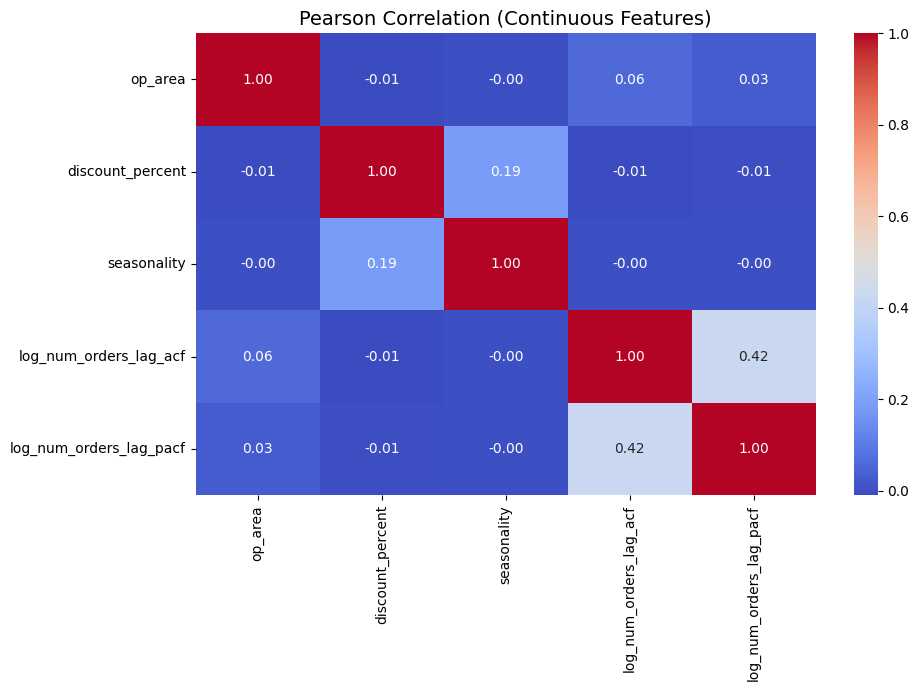


🔁 ----------------- CRAMÉR'S V CORRELATION (CATEGORICAL) ---------------- 🔁



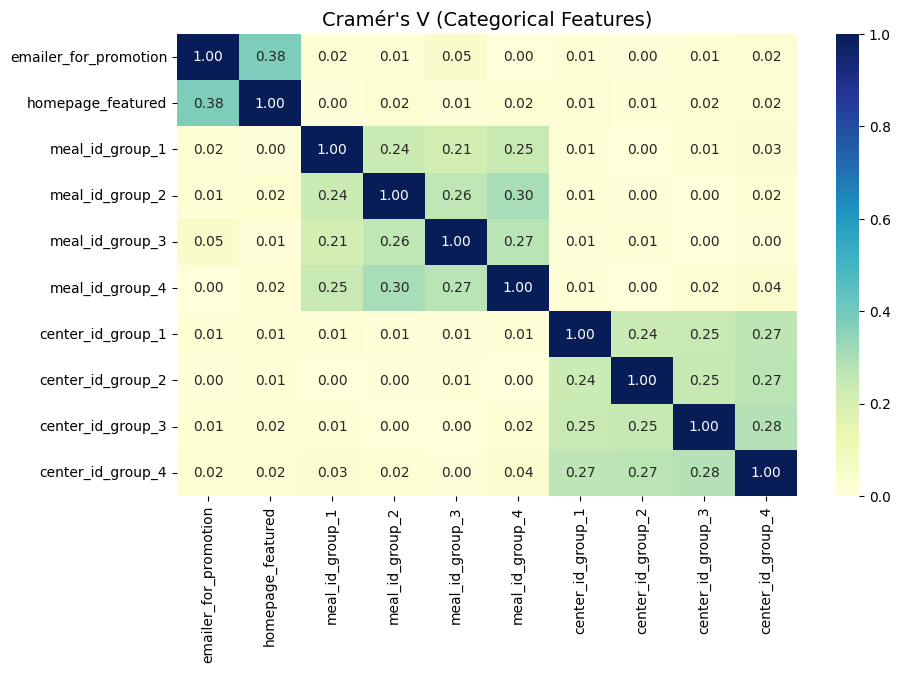


🧮 ----------------- VARIANCE INFLATION FACTOR (VIF) ----------------- 🧮

                feature       VIF
                  const 13.124258
                op_area  2.036680
       discount_percent  1.392354
            seasonality  1.060525
 log_num_orders_lag_acf  1.262552
log_num_orders_lag_pacf  1.230578
  emailer_for_promotion  1.414215
      homepage_featured  1.237663
        meal_id_group_1  1.603307
        meal_id_group_2  1.762167
        meal_id_group_3  1.716198
        meal_id_group_4  1.859703
      center_id_group_1  1.814353
      center_id_group_2  1.948126
      center_id_group_3  2.125904
      center_id_group_4  3.459342


In [ ]:
num_cols = ['op_area', 'discount_percent', 'seasonality',  'log_num_orders_lag_acf'	,'log_num_orders_lag_pacf']
cat_cols = ['emailer_for_promotion', 'homepage_featured',
            'meal_id_group_1', 'meal_id_group_2', 'meal_id_group_3', 'meal_id_group_4',
            'center_id_group_1', 'center_id_group_2', 'center_id_group_3', 'center_id_group_4']

assumptions_pre(X_scaled, num_cols, cat_cols)



In [ ]:
X_scaled

,emailer_for_promotion,homepage_featured,op_area,discount_percent,seasonality,meal_id_group_1,meal_id_group_2,meal_id_group_3,meal_id_group_4,center_id_group_1,center_id_group_2,center_id_group_3,center_id_group_4,log_num_orders_lag_acf,log_num_orders_lag_pacf
0,0,0,2.029950,-0.501399,-0.073172,0,0,0,1,0,0,0,1,0.0,0.000000
1,0,0,2.029950,-0.549351,-3.776461,0,0,0,1,0,0,0,1,0.0,0.000000
2,0,0,2.029950,-0.597303,0.816001,0,0,0,1,0,0,0,1,0.0,0.000000
3,0,0,2.029950,-0.453709,-0.659952,0,0,0,1,0,0,0,1,0.0,0.000000
4,0,0,2.029950,-0.597816,0.802014,0,0,0,1,0,0,0,1,0.0,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
364317,0,0,-0.626557,-0.516423,0.000935,1,0,0,0,0,0,0,0,0.0,2.639057
364318,0,0,-0.626557,0.928356,0.000935,1,0,0,0,0,0,0,0,0.0,2.708050
364319,0,0,-0.626557,0.943406,0.000935,1,0,0,0,0,0,0,0,0.0,3.295837
364320,0,0,-0.626557,-0.516449,0.000935,1,0,0,0,0,0,0,0,0.0,3.295837


In [ ]:
X = sm.add_constant(X_scaled)



# Fit the OLS model
model = sm.OLS(Y, X).fit()

# Show the summary of the model
print(model.summary())


                            OLS Regression Results                            
Dep. Variable:         log_num_orders   R-squared:                       0.680
Model:                            OLS   Adj. R-squared:                  0.680
Method:                 Least Squares   F-statistic:                 5.169e+04
Date:                Thu, 24 Apr 2025   Prob (F-statistic):               0.00
Time:                        09:35:21   Log-Likelihood:            -3.6850e+05
No. Observations:              364322   AIC:                         7.370e+05
Df Residuals:                  364306   BIC:                         7.372e+05
Df Model:                          15                                         
Covariance Type:            nonrobust                                         
                              coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------
const                     


📈 ------------------ LINEARITY + HOMOSCEDASTICITY ------------------ 📈


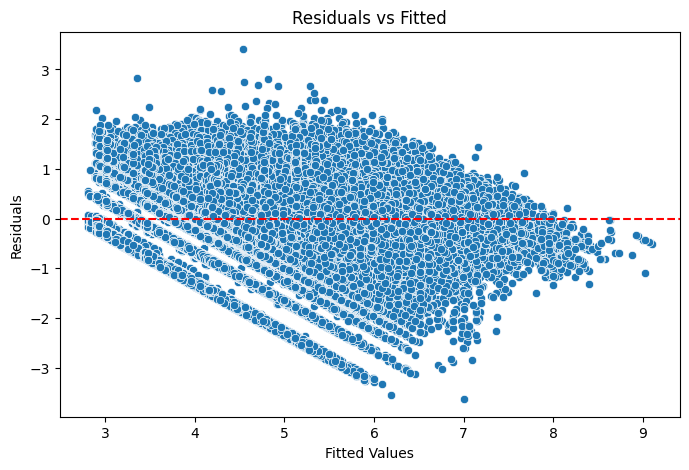


📊 ------------------ NORMALITY OF RESIDUALS ------------------ 📊


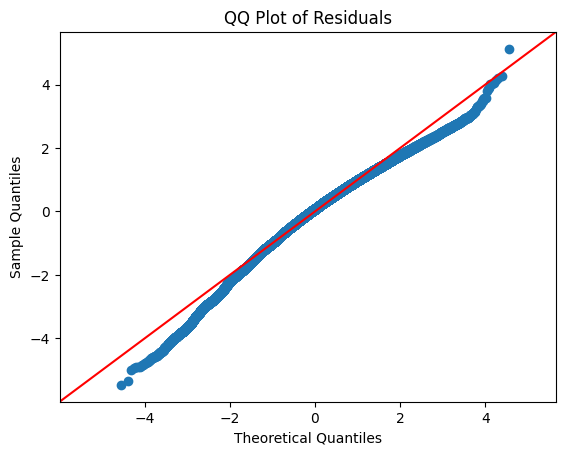

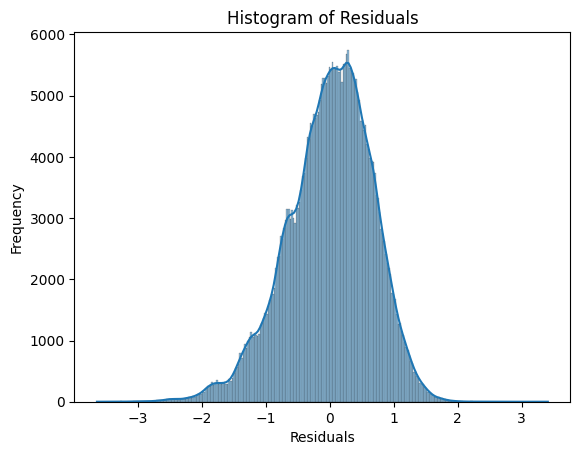

In [ ]:
assumptions_post(model, X, Y)

In [ ]:
rmsle(model, X, Y)

0.665338144033422

## Test Time!

### Feature Conforming

In [ ]:
df_test_stratified_1 = seasonal_incorporation(df_lagged, df_test_stratified_1)

<ipython-input-430-c95ab83d473d>:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df_test['seasonality'].fillna(0, inplace=True)


In [ ]:
df_test_stratified_1  = log_it(df_test_stratified_1, 'num_orders')


In [ ]:
df_test_stratified_1 =  apply_bins_to_test(df_test_stratified_1, bin_maps, ['meal_id', 'center_id'])


In [ ]:
df_test_stratified_1.sort_values(by=['center_id', 'meal_id', 'week']).tail(10)

,id,week,center_id,meal_id,checkout_price,base_price,emailer_for_promotion,homepage_featured,num_orders,category,...,seasonality,log_num_orders,meal_id_group_1,meal_id_group_2,meal_id_group_3,meal_id_group_4,center_id_group_1,center_id_group_2,center_id_group_3,center_id_group_4
170809,1123781,145,186,2867,727.53,727.53,0,0,28,Seafood,...,0.0,3.367296,1,0,0,0,0,0,0,0
170810,1380818,107,186,2956,583.03,583.03,0,0,55,Fish,...,0.0,4.025352,1,0,0,0,0,0,0,0
170811,1380244,108,186,2956,583.03,583.03,0,0,42,Fish,...,0.0,3.761200,1,0,0,0,0,0,0,0
170812,1350102,110,186,2956,582.03,583.03,0,0,54,Fish,...,0.0,4.007333,1,0,0,0,0,0,0,0
170813,1052219,111,186,2956,583.03,582.03,0,0,55,Fish,...,0.0,4.025352,1,0,0,0,0,0,0,0
170814,1255251,112,186,2956,583.03,581.03,0,0,82,Fish,...,0.0,4.418841,1,0,0,0,0,0,0,0
170815,1436164,113,186,2956,583.03,582.03,0,0,40,Fish,...,0.0,3.713572,1,0,0,0,0,0,0,0
170816,1000576,114,186,2956,583.03,581.03,0,0,27,Fish,...,0.0,3.332205,1,0,0,0,0,0,0,0
170817,1429037,115,186,2956,581.03,583.03,0,0,15,Fish,...,0.0,2.772589,1,0,0,0,0,0,0,0
170818,1285049,116,186,2956,292.03,582.03,0,0,122,Fish,...,0.0,4.812184,1,0,0,0,0,0,0,0


In [ ]:
significant_lags_info

[{'center_id': np.int64(10),
  'meal_id': np.int64(1109),
  'first_significant_acf_lag': 11,
  'first_significant_pacf_lag': 11},
 {'center_id': np.int64(10),
  'meal_id': np.int64(1198),
  'first_significant_acf_lag': 10,
  'first_significant_pacf_lag': None},
 {'center_id': np.int64(10),
  'meal_id': np.int64(1230),
  'first_significant_acf_lag': 15,
  'first_significant_pacf_lag': 14},
 {'center_id': np.int64(10),
  'meal_id': np.int64(1247),
  'first_significant_acf_lag': 16,
  'first_significant_pacf_lag': 16},
 {'center_id': np.int64(10),
  'meal_id': np.int64(1248),
  'first_significant_acf_lag': 12,
  'first_significant_pacf_lag': 12},
 {'center_id': np.int64(10),
  'meal_id': np.int64(1311),
  'first_significant_acf_lag': 10,
  'first_significant_pacf_lag': 14},
 {'center_id': np.int64(10),
  'meal_id': np.int64(1445),
  'first_significant_acf_lag': 14,
  'first_significant_pacf_lag': 14},
 {'center_id': np.int64(10),
  'meal_id': np.int64(1543),
  'first_significant_acf_lag':

In [ ]:
target_center = 186
target_meal = 2956

matches = [
    item for item in significant_lags_info
    if item['center_id'] == target_center and item['meal_id'] == target_meal
]

print(matches)


[{'center_id': np.int64(186), 'meal_id': np.int64(2956), 'first_significant_acf_lag': None, 'first_significant_pacf_lag': 14}]


In [ ]:
# 1. Construct lag_dict from significant_lags_info
lag_dict = {
    (row['center_id'], row['meal_id']): {
        'lag_acf': row['first_significant_acf_lag'],
        'lag_pacf': row['first_significant_pacf_lag']
    }
    for row in significant_lags_info
}

# 2. Create a train_lookup dictionary from the train set
train_lookup = df_train_stratified_1.set_index(['center_id', 'meal_id', 'week'])['log_num_orders'].to_dict()

# 3. Define the function to get lagged values
def get_lagged_value(row, lag_type):
    center = row['center_id']
    meal = row['meal_id']
    week = row['week']

    # Fetch lags from lag_dict
    lags = lag_dict.get((center, meal), {'lag_acf': None, 'lag_pacf': None})
    lag = lags.get(lag_type)

    # If the lag exists, shift the week accordingly
    if lag is not None:
        lookup_key = (center, meal, week - lag)
        return train_lookup.get(lookup_key, np.nan)  # Get the value from train_lookup (if exists)
    else:
        return np.nan  # If no significant lag, return NaN

# 4. Apply the function to the test set
df_test_stratified_1['log_num_orders_lag_acf'] = df_test_stratified_1.apply(lambda row: get_lagged_value(row, 'lag_acf'), axis=1)
df_test_stratified_1['log_num_orders_lag_pacf'] = df_test_stratified_1.apply(lambda row: get_lagged_value(row, 'lag_pacf'), axis=1)


In [ ]:
df_test_stratified_1.fillna(0,  inplace = True)

In [ ]:
df_test_stratified_1

,id,week,center_id,meal_id,checkout_price,base_price,emailer_for_promotion,homepage_featured,num_orders,category,...,meal_id_group_1,meal_id_group_2,meal_id_group_3,meal_id_group_4,center_id_group_1,center_id_group_2,center_id_group_3,center_id_group_4,log_num_orders_lag_acf,log_num_orders_lag_pacf
0,1323770,117,10,1062,131.95,182.36,0,1,1093,Beverages,...,0,0,0,1,0,0,0,1,0.0,0.000000
1,1323770,117,10,1062,131.95,182.36,0,1,1093,Beverages,...,0,0,0,1,0,0,0,1,0.0,0.000000
2,1469984,118,10,1062,162.96,183.36,0,0,1067,Beverages,...,0,0,0,1,0,0,0,1,0.0,0.000000
3,1469984,118,10,1062,162.96,183.36,0,0,1067,Beverages,...,0,0,0,1,0,0,0,1,0.0,0.000000
4,1397783,119,10,1062,193.06,193.06,0,0,1160,Beverages,...,0,0,0,1,0,0,0,1,0.0,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
170814,1255251,112,186,2956,583.03,581.03,0,0,82,Fish,...,1,0,0,0,0,0,0,0,0.0,3.295837
170815,1436164,113,186,2956,583.03,582.03,0,0,40,Fish,...,1,0,0,0,0,0,0,0,0.0,3.367296
170816,1000576,114,186,2956,583.03,581.03,0,0,27,Fish,...,1,0,0,0,0,0,0,0,0.0,3.713572
170817,1429037,115,186,2956,581.03,583.03,0,0,15,Fish,...,1,0,0,0,0,0,0,0,0.0,2.639057


### Transforming and Prediction

In [ ]:
X_test = df_test_stratified_1[[ 'emailer_for_promotion', 'homepage_featured',
                                'op_area',
                                'discount_percent', 'seasonality', 'meal_id_group_1', 'meal_id_group_2', 'meal_id_group_3',
                                'meal_id_group_4', 'center_id_group_1', 'center_id_group_2', 'center_id_group_3', 'center_id_group_4', 'log_num_orders_lag_acf'	,'log_num_orders_lag_pacf']]

X_test_scaled, _ = scale_numeric_features(
    X_test,
    ['op_area', 'discount_percent', 'seasonality'],
    scaler=trained_scaler,
    fit=False
)

X_test_scaled = sm.add_constant(X_test_scaled)  # Add intercept column


In [ ]:
rmsle(model, X_test_scaled, df_test_stratified_1['log_num_orders'])

0.701009144029351

#Polynomial Model

## Train Time!

### Feature Engineering

In [ ]:
df_train_stratified_1 = df_train_stratified.copy()
df_test_stratified_1 = df_test_stratified.copy()

In [ ]:
df_train_stratified_1, target_maps = target_encode_train(
    df_train_stratified_1,
    group_cols=['meal_id', 'center_id'],
    target_col='num_orders'
)


In [ ]:
df_train_stratified_1 = log_it(df_train_stratified_1, 'num_orders')
df_train_stratified_1 = add_seasonality_feature(df_train_stratified_1)

<ipython-input-13-bd44f4a44d6f>:27: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  seasonal_series = df.groupby(group_cols).apply(lambda x: seasonality_func(x))


In [ ]:
df_train_stratified_1

,id,week,center_id,meal_id,checkout_price,base_price,emailer_for_promotion,homepage_featured,num_orders,category,cuisine,city_code,region_code,center_type,op_area,discount_percent,meal_id_encoded,center_id_encoded,log_num_orders,seasonality
0,1436842,1,10,1062,181.39,181.39,0,0,865.0,Beverages,Italian,590,56,TYPE_B,6.3,0.000000,424.966509,453.409730,6.763885,-9.220634
1,1205013,2,10,1062,183.36,182.36,0,0,782.0,Beverages,Italian,590,56,TYPE_B,6.3,-0.548366,424.966509,453.409730,6.663133,-469.999480
2,1447751,3,10,1062,184.36,182.36,0,0,851.0,Beverages,Italian,590,56,TYPE_B,6.3,-1.096732,424.966509,453.409730,6.747587,101.413982
3,1014968,4,10,1062,182.36,183.36,0,0,1202.0,Beverages,Italian,590,56,TYPE_B,6.3,0.545375,424.966509,453.409730,7.092574,-82.230249
4,1003563,5,10,1062,183.39,181.39,0,0,958.0,Beverages,Italian,590,56,TYPE_B,6.3,-1.102597,424.966509,453.409730,6.865891,99.673597
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
364317,1082692,99,186,2956,583.03,582.03,0,0,28.0,Fish,Continental,649,34,TYPE_A,3.4,-0.171812,84.113844,140.891071,3.367296,0.000000
364318,1214821,100,186,2956,486.03,581.03,0,0,40.0,Fish,Continental,649,34,TYPE_A,3.4,16.350275,84.113844,140.891071,3.713572,0.000000
364319,1308197,101,186,2956,485.03,581.03,0,0,13.0,Fish,Continental,649,34,TYPE_A,3.4,16.522383,84.113844,140.891071,2.639057,0.000000
364320,1071894,103,186,2956,582.03,581.03,0,0,40.0,Fish,Continental,649,34,TYPE_A,3.4,-0.172108,84.113844,140.891071,3.713572,0.000000


### Scaling and Regression

In [ ]:
from sklearn.preprocessing import PolynomialFeatures
import pandas as pd

# Step 1: Define the target variable
Y = df_train_stratified_1['log_num_orders']

# Step 2: Select numeric features for polynomial expansion
numeric_poly_features = df_train_stratified_1[['op_area', 'discount_percent', 'seasonality','meal_id_encoded', 'center_id_encoded']]

# Step 3: Apply polynomial transformation (e.g., degree = 2)
poly = PolynomialFeatures(degree=2, include_bias=False)
X_poly = poly.fit_transform(numeric_poly_features)

# Optional: Get column names for clarity
poly_feature_names = poly.get_feature_names_out(['op_area', 'discount_percent', 'seasonality','meal_id_encoded', 'center_id_encoded'])
df_X_poly = pd.DataFrame(X_poly, columns=poly_feature_names, index=df_train_stratified_1.index)

# Step 4: Combine with other non-polynomial features
X_other = df_train_stratified_1[['emailer_for_promotion', 'homepage_featured']]

# Step 5: Concatenate polynomial and other features
X_final = pd.concat([df_X_poly, X_other], axis=1)
X_final.shape

(364322, 22)


📊 ------------------ PEARSON CORRELATION (NUMERIC) ------------------ 📊



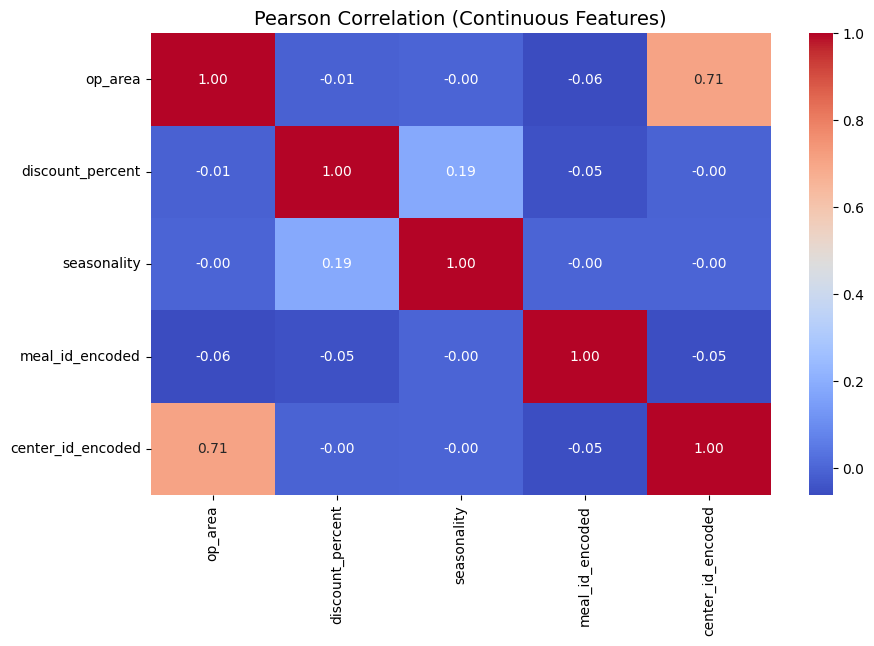


🔁 ----------------- CRAMÉR'S V CORRELATION (CATEGORICAL) ---------------- 🔁



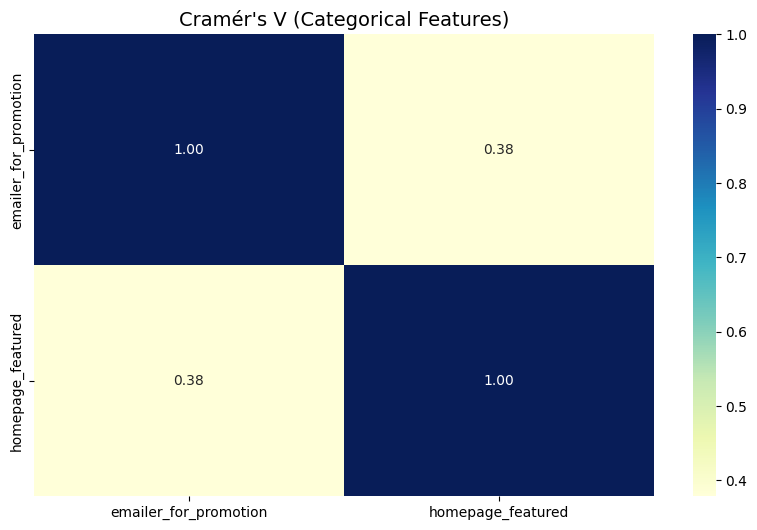


🧮 ----------------- VARIANCE INFLATION FACTOR (VIF) ----------------- 🧮

              feature       VIF
                const 17.691724
              op_area  2.000726
     discount_percent  1.371764
          seasonality  1.060089
      meal_id_encoded  1.012424
    center_id_encoded  1.998930
emailer_for_promotion  1.408883
    homepage_featured  1.236810


,op_area,discount_percent,seasonality,meal_id_encoded,center_id_encoded,op_area^2,op_area discount_percent,op_area seasonality,op_area meal_id_encoded,op_area center_id_encoded,...,discount_percent meal_id_encoded,discount_percent center_id_encoded,seasonality^2,seasonality meal_id_encoded,seasonality center_id_encoded,meal_id_encoded^2,meal_id_encoded center_id_encoded,center_id_encoded^2,emailer_for_promotion,homepage_featured
0,6.3,0.000000,-9.220634,424.966509,453.409730,39.69,0.000000,-58.089993,2677.289004,2856.481297,...,0.000000,0.000000,85.020087,-3918.460546,-4180.725071,180596.533420,192683.949772,205580.382948,0,0
1,6.3,-0.548366,-469.999480,424.966509,453.409730,39.69,-3.454705,-2960.996724,2677.289004,2856.481297,...,-233.037129,-248.634421,220899.511141,-199734.038027,-213102.337137,180596.533420,192683.949772,205580.382948,0,0
2,6.3,-1.096732,101.413982,424.966509,453.409730,39.69,-6.909410,638.908084,2677.289004,2856.481297,...,-466.074258,-497.268841,10284.795664,43097.545683,45982.085981,180596.533420,192683.949772,205580.382948,0,0
3,6.3,0.545375,-82.230249,424.966509,453.409730,39.69,3.435864,-518.050570,2677.289004,2856.481297,...,231.766202,247.278430,6761.813878,-34945.101889,-37283.995045,180596.533420,192683.949772,205580.382948,0,0
4,6.3,-1.102597,99.673597,424.966509,453.409730,39.69,-6.946359,627.943661,2677.289004,2856.481297,...,-468.566634,-499.928033,9934.825936,42357.940509,45192.978663,180596.533420,192683.949772,205580.382948,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
364317,3.4,-0.171812,0.000000,84.113844,140.891071,11.56,-0.584162,0.000000,285.987068,479.029643,...,-14.451805,-24.206840,0.000000,0.000000,0.000000,7075.138672,11850.889536,19850.294008,0,0
364318,3.4,16.350275,0.000000,84.113844,140.891071,11.56,55.590933,0.000000,285.987068,479.029643,...,1375.284432,2303.607694,0.000000,0.000000,0.000000,7075.138672,11850.889536,19850.294008,0,0
364319,3.4,16.522383,0.000000,84.113844,140.891071,11.56,56.176101,0.000000,285.987068,479.029643,...,1389.761110,2327.856196,0.000000,0.000000,0.000000,7075.138672,11850.889536,19850.294008,0,0
364320,3.4,-0.172108,0.000000,84.113844,140.891071,11.56,-0.585168,0.000000,285.987068,479.029643,...,-14.476678,-24.248502,0.000000,0.000000,0.000000,7075.138672,11850.889536,19850.294008,0,0


In [ ]:
num_cols = ['op_area', 'discount_percent', 'seasonality',  'meal_id_encoded', 'center_id_encoded'	]
cat_cols = ['emailer_for_promotion', 'homepage_featured']
assumptions_pre(X_final, num_cols, cat_cols)

X_final

In [ ]:
X = sm.add_constant(X_final)


# Fit the OLS model
model = sm.OLS(Y, X).fit()

# Show the summary of the model
print(model.summary())


                            OLS Regression Results                            
Dep. Variable:         log_num_orders   R-squared:                       0.713
Model:                            OLS   Adj. R-squared:                  0.713
Method:                 Least Squares   F-statistic:                 4.109e+04
Date:                Fri, 25 Apr 2025   Prob (F-statistic):               0.00
Time:                        06:30:22   Log-Likelihood:            -3.4902e+05
No. Observations:              364322   AIC:                         6.981e+05
Df Residuals:                  364299   BIC:                         6.983e+05
Df Model:                          22                                         
Covariance Type:            nonrobust                                         
                                         coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------
cons


📈 ------------------ LINEARITY + HOMOSCEDASTICITY ------------------ 📈


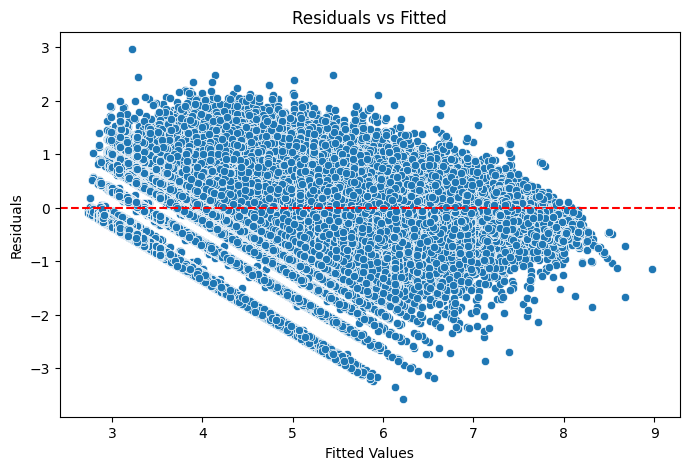


📊 ------------------ NORMALITY OF RESIDUALS ------------------ 📊


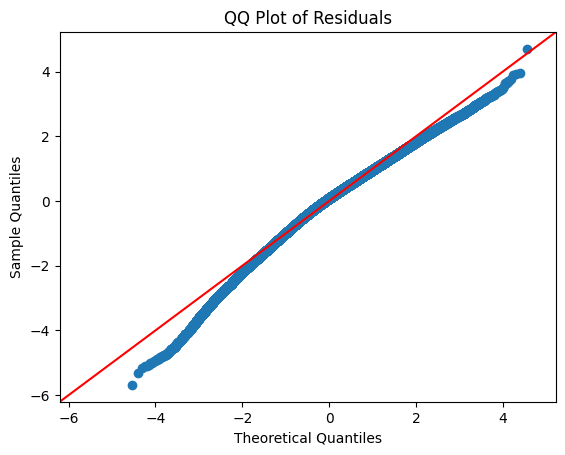

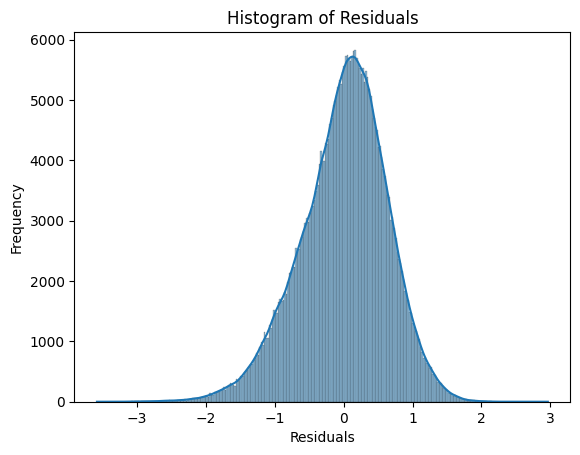

In [ ]:
assumptions_post(model, X, Y)

In [ ]:
rmsle(model, X, Y)

0.6306903734293813

## Test Time!

### Feature Conforming

In [ ]:
df_test_stratified_1 = seasonal_incorporation(df_train_stratified_1, df_test_stratified_1)

<ipython-input-14-c95ab83d473d>:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df_test['seasonality'].fillna(0, inplace=True)


In [ ]:
df_test_stratified_1  = log_it(df_test_stratified_1, 'num_orders')

In [ ]:
df_test_stratified_1 =  target_encode_test(df_test_stratified_1, target_maps, ['meal_id', 'center_id'])

### Transforming and Prediction

In [ ]:
from sklearn.preprocessing import PolynomialFeatures
import pandas as pd

# Step 1: Define the numeric columns to be transformed
numeric_poly_features_test = df_test_stratified_1[['op_area', 'discount_percent', 'seasonality','meal_id_encoded', 'center_id_encoded']]

# Step 2: Apply the same polynomial transformation to the test data
X_test_poly = poly.transform(numeric_poly_features_test)

# Step 3: Create a DataFrame with polynomial features for clarity (optional)
poly_feature_names_test = poly.get_feature_names_out(['op_area', 'discount_percent', 'seasonality','meal_id_encoded', 'center_id_encoded'])
df_X_test_poly = pd.DataFrame(X_test_poly, columns=poly_feature_names_test, index=df_test_stratified_1.index)

# Step 4: Concatenate with other non-polynomial features
X_test_other = df_test_stratified_1[['emailer_for_promotion', 'homepage_featured']]

# Step 5: Combine polynomial features and non-polynomial features
X_test_final = pd.concat([df_X_test_poly, X_test_other], axis=1)


# Step 7: Add intercept column (for statsmodels regression)
X_test_scaled = sm.add_constant(X_test_final, has_constant='add')  # Add intercept column


In [ ]:
X_test_scaled

,const,op_area,discount_percent,seasonality,meal_id_encoded,center_id_encoded,op_area^2,op_area discount_percent,op_area seasonality,op_area meal_id_encoded,...,discount_percent meal_id_encoded,discount_percent center_id_encoded,seasonality^2,seasonality meal_id_encoded,seasonality center_id_encoded,meal_id_encoded^2,meal_id_encoded center_id_encoded,center_id_encoded^2,emailer_for_promotion,homepage_featured
0,1.0,6.3,27.643123,96.933212,424.966509,453.409730,39.69,174.151678,610.679238,2677.289004,...,11747.401677,12533.661149,9396.047660,41193.368827,43950.461616,180596.533420,192683.949772,205580.382948,0,1
1,1.0,6.3,27.643123,96.933212,424.966509,453.409730,39.69,174.151678,610.679238,2677.289004,...,11747.401677,12533.661149,9396.047660,41193.368827,43950.461616,180596.533420,192683.949772,205580.382948,0,1
2,1.0,6.3,11.125654,218.365905,424.966509,453.409730,39.69,70.091623,1375.705199,2677.289004,...,4728.030527,5044.479977,47683.668326,92798.196106,99009.225807,180596.533420,192683.949772,205580.382948,0,0
3,1.0,6.3,11.125654,218.365905,424.966509,453.409730,39.69,70.091623,1375.705199,2677.289004,...,4728.030527,5044.479977,47683.668326,92798.196106,99009.225807,180596.533420,192683.949772,205580.382948,0,0
4,1.0,6.3,0.000000,188.808212,424.966509,453.409730,39.69,0.000000,1189.491738,2677.289004,...,0.000000,0.000000,35648.541059,80237.166804,85607.480528,180596.533420,192683.949772,205580.382948,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
170814,1.0,3.4,-0.344216,0.000000,84.113844,140.891071,11.56,-1.170335,0.000000,285.987068,...,-28.953356,-48.497004,0.000000,0.000000,0.000000,7075.138672,11850.889536,19850.294008,0,0
170815,1.0,3.4,-0.171812,0.000000,84.113844,140.891071,11.56,-0.584162,0.000000,285.987068,...,-14.451805,-24.206840,0.000000,0.000000,0.000000,7075.138672,11850.889536,19850.294008,0,0
170816,1.0,3.4,-0.344216,0.000000,84.113844,140.891071,11.56,-1.170335,0.000000,285.987068,...,-28.953356,-48.497004,0.000000,0.000000,0.000000,7075.138672,11850.889536,19850.294008,0,0
170817,1.0,3.4,0.343036,0.000000,84.113844,140.891071,11.56,1.166321,0.000000,285.987068,...,28.854036,48.330642,0.000000,0.000000,0.000000,7075.138672,11850.889536,19850.294008,0,0


In [ ]:
rmsle(model, X_test_scaled, df_test_stratified_1['log_num_orders'])

0.6649812637030436

# Prophet for sampled top 1000 df's

## Prophet (Purely Date and target) on top 1000 training data

### Training on top center , meal id

In [ ]:
df_train_stratified_1 = df_train_stratified.copy()
df_test_stratified_1 = df_test_stratified.copy()


In [ ]:
df_train_prophet_allcol = df_train_stratified_1.rename(columns={'date': 'ds', 'num_orders': 'y'})
df_train_prophet_allcol.head()

,id,week,center_id,meal_id,checkout_price,base_price,emailer_for_promotion,homepage_featured,y,category,cuisine,city_code,region_code,center_type,op_area,discount_percent,ds
2370,1436842,1,10,1062,181.39,181.39,0,0,865.0,Beverages,Italian,590,56,TYPE_B,6.3,0.000000,2023-01-08
5273,1205013,2,10,1062,183.36,182.36,0,0,782.0,Beverages,Italian,590,56,TYPE_B,6.3,-0.548366,2023-01-15
8175,1447751,3,10,1062,184.36,182.36,0,0,851.0,Beverages,Italian,590,56,TYPE_B,6.3,-1.096732,2023-01-22
11064,1014968,4,10,1062,182.36,183.36,0,0,1202.0,Beverages,Italian,590,56,TYPE_B,6.3,0.545375,2023-01-29
13918,1003563,5,10,1062,183.39,181.39,0,0,958.0,Beverages,Italian,590,56,TYPE_B,6.3,-1.102597,2023-02-05


In [ ]:
df_top_1000 = df_train_prophet_allcol.groupby(['center_id', 'meal_id'])['y'].sum().sort_values(ascending = False).head(1000).reset_index()
df_train_prophet_1000 = df_train_prophet_allcol.merge(df_top_1000[['center_id', 'meal_id']], on=['center_id', 'meal_id'], how = 'inner')

In [ ]:
df_train_prophet_1000.head()

,id,week,center_id,meal_id,checkout_price,base_price,emailer_for_promotion,homepage_featured,y,category,cuisine,city_code,region_code,center_type,op_area,discount_percent,ds
0,1436842,1,10,1062,181.39,181.39,0,0,865.0,Beverages,Italian,590,56,TYPE_B,6.3,0.000000,2023-01-08
1,1205013,2,10,1062,183.36,182.36,0,0,782.0,Beverages,Italian,590,56,TYPE_B,6.3,-0.548366,2023-01-15
2,1447751,3,10,1062,184.36,182.36,0,0,851.0,Beverages,Italian,590,56,TYPE_B,6.3,-1.096732,2023-01-22
3,1014968,4,10,1062,182.36,183.36,0,0,1202.0,Beverages,Italian,590,56,TYPE_B,6.3,0.545375,2023-01-29
4,1003563,5,10,1062,183.39,181.39,0,0,958.0,Beverages,Italian,590,56,TYPE_B,6.3,-1.102597,2023-02-05


In [ ]:
from tqdm import tqdm   # For progress bar

# Create an empty list to store all forecasts
all_forecasts = []

for (center, meal), df in tqdm(df_train_prophet_1000.groupby(['center_id', 'meal_id'])):
    # Get the length of the current dataframe for the current group
    train_length = len(df)

    # Calculate the remaining weeks (the number of test periods)
    periods = 145 - train_length  # The test period is the difference between total and train data

    # Sort the dataframe by date (ds)
    df_sorted_prophet = df.loc[:, ['ds', 'y']].sort_values(by='ds')

    # Initialize Prophet model
    m = Prophet(weekly_seasonality=True)
    m.fit(df_sorted_prophet)

    # Create the future dataframe dynamically based on the remaining periods
    future = m.make_future_dataframe(periods=periods, freq='W')  # Using weekly frequency

    # Predict the future
    forecast = m.predict(future)

    # Add center_id and meal_id to the forecast for identification
    forecast['center_id'] = center
    forecast['meal_id'] = meal

    # Keep only the necessary columns
    forecast_needed = forecast[['ds', 'yhat', 'center_id', 'meal_id']]

    # Append to the list
    all_forecasts.append(forecast_needed)

# After the loop, concatenate everything into a single DataFrame
final_forecast_df = pd.concat(all_forecasts, ignore_index=True)



  0%|          | 0/1000 [00:00<?, ?it/s]INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp0kvo7fjv/ewg82yrp.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp0kvo7fjv/xwpzr5yi.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=15137', 'data', 'file=/tmp/tmp0kvo7fjv/ewg82yrp.json', 'init=/tmp/tmp0kvo7fjv/xwpzr5yi.json', 'output', 'file=/tmp/tmp0kvo7fjv/prophet_models69ko8qz/prophet_model-20250429073348.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
07:33:48 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
07:33:48 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
  0%|          | 0/1000 [00:00<?, ?it/s]

            ds
0   2023-01-08
1   2023-01-15
2   2023-01-22
3   2023-01-29
4   2023-02-05
..         ...
140 2025-09-14
141 2025-09-21
142 2025-09-28
143 2025-10-05
144 2025-10-12

[145 rows x 1 columns] 

            ds       trend  yhat_lower   yhat_upper  trend_lower  trend_upper  \
0   2023-01-08  905.124950  666.480261  1181.024802   905.124950   905.124950   
1   2023-01-15  903.594936  668.309168  1205.594884   903.594936   903.594936   
2   2023-01-22  902.064922  675.755561  1192.091006   902.064922   902.064922   
3   2023-01-29  900.534908  712.427645  1214.567332   900.534908   900.534908   
4   2023-02-05  899.004893  807.972521  1333.717567   899.004893   899.004893   
..         ...         ...         ...          ...          ...          ...   
140 2025-09-14  734.499259  577.959345  1079.325950   733.118437   735.904318   
141 2025-09-21  733.555498  542.071980  1068.802011   732.073191   735.048069   
142 2025-09-28  732.611737  525.872310  1043.928581   731.021956 

### Test Time on Top center, meal id

In [ ]:
# Filtering the test set to conform to the training one, ie filtering out top 1000 center meal id df
df_top_1000 = df_train_prophet_allcol.groupby(['center_id', 'meal_id'])['y'].sum().sort_values(ascending = False).head(1000).reset_index()
df_test_prophet_1000 = df_test_stratified_1.merge(df_top_1000[['center_id', 'meal_id']], on=['center_id', 'meal_id'], how = 'inner')

In [ ]:
df_test_prophet_1000 = df_test_prophet_1000.rename(columns = {'date' : 'ds', 'num_orders' : 'y'})

In [ ]:
df_test_prophet_1000.shape
final_forecast_df.shape

(145000, 4)

In [ ]:
df_actual_vs_predicted = df_test_prophet_1000.merge(final_forecast_df, on = ['ds', 'center_id', 'meal_id'], how = 'left')
df_actual_vs_predicted.head()


,id,week,center_id,meal_id,checkout_price,base_price,emailer_for_promotion,homepage_featured,y,category,cuisine,city_code,region_code,center_type,op_area,discount_percent,ds,yhat
0,1323770,117,10,1062,131.95,182.36,0,1,1093,Beverages,Italian,590,56,TYPE_B,6.3,27.643123,2025-03-30,919.891056
1,1469984,118,10,1062,162.96,183.36,0,0,1067,Beverages,Italian,590,56,TYPE_B,6.3,11.125654,2025-04-06,849.151012
2,1397783,119,10,1062,193.06,193.06,0,0,1160,Beverages,Italian,590,56,TYPE_B,6.3,0.000000,2025-04-13,815.543024
3,1217347,120,10,1062,193.06,194.06,0,0,755,Beverages,Italian,590,56,TYPE_B,6.3,0.515305,2025-04-20,798.326619
4,1285623,121,10,1062,194.06,194.06,0,0,919,Beverages,Italian,590,56,TYPE_B,6.3,0.000000,2025-04-27,774.632238


In [ ]:
 df_actual_vs_predicted[['ds', 'y', 'yhat']]

,ds,y,yhat
0,2025-03-30,1093,919.891056
1,2025-04-06,1067,849.151012
2,2025-04-13,1160,815.543024
3,2025-04-20,755,798.326619
4,2025-04-27,919,774.632238
...,...,...,...
28430,2025-09-14,365,578.999651
28431,2025-09-21,379,639.009890
28432,2025-09-28,539,561.185377
28433,2025-10-05,325,419.857472


In [ ]:

# Assuming df_actual_vs_predicted is your DataFrame containing 'y' and 'yhat'
# Apply the RMSLE formula

# Make sure there are no negative values in the data (log(y + 1) can only be used on positive values)
# Avoid log(0) by adding 1 to y and yhat as necessary

rmsle = np.sqrt(np.mean((np.log(df_actual_vs_predicted['y'] + 1) - np.log(df_actual_vs_predicted['yhat'] + 1))**2))

# Print the RMSLE value
print(f"Root Mean Squared Logarithmic Error (RMSLE): {rmsle}")


Root Mean Squared Logarithmic Error (RMSLE): 0.6146542208090192


/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


## Prophet with regressor on top 1000

### Train time!

In [ ]:
df_train_stratified_1 = df_train_stratified.copy()
df_test_stratified_1 = df_test_stratified.copy()
df_train_prophet_allcol = df_train_stratified_1.rename(columns={'date': 'ds', 'num_orders': 'y'})
df_top_1000 = df_train_prophet_allcol.groupby(['center_id', 'meal_id'])['y'].sum().sort_values(ascending = False).head(1000).reset_index()
df_train_prophet_1000 = df_train_prophet_allcol.merge(df_top_1000[['center_id', 'meal_id']], on=['center_id', 'meal_id'], how = 'inner')
df_train_prophet_1000['y'] = np.log1p(df_train_prophet_1000['y'])

In [ ]:
# Filtering the test set to conform to the training one, ie filtering out top 1000 center meal id df
df_top_1000 = df_train_prophet_allcol.groupby(['center_id', 'meal_id'])['y'].sum().sort_values(ascending = False).head(1000).reset_index()
df_test_prophet_1000 = df_test_stratified_1.merge(df_top_1000[['center_id', 'meal_id']], on=['center_id', 'meal_id'], how = 'inner')
df_test_prophet_1000 = df_test_prophet_1000.rename(columns = {'date' : 'ds', 'num_orders' : 'y'})
df_test_prophet_1000 = df_test_prophet_1000.sort_values(by=['center_id', 'meal_id', 'ds'])
df_test_prophet_1000['y'] = np.log1p(df_test_prophet_1000['y'])

In [ ]:
from tqdm import tqdm  # For progress bar

# Create an empty list to store all forecasts
all_forecasts = []

# List of regressors you want to include
regressors = ['emailer_for_promotion', 'homepage_featured', 'op_area', 'discount_percent']

for (center, meal), df in tqdm(df_train_prophet_1000.groupby(['center_id', 'meal_id'])):
    # Get the length of the current dataframe for the current group
    train_length = len(df)

    # Calculate the remaining weeks (the number of test periods)
    periods = 145 - train_length  # The test period is the difference between total and train data

    # Sort the dataframe by date (ds)
    df_sorted_prophet = df.loc[:, ['ds', 'y'] + regressors].sort_values(by='ds')  # Include regressors in the data

    # Initialize Prophet model
    m = Prophet(weekly_seasonality=True)

    # Add regressors to the model
    for regressor in regressors:
        m.add_regressor(regressor)

    # Fit the model
    m.fit(df_sorted_prophet)

    # Create the future dataframe dynamically based on the remaining periods
    future = m.make_future_dataframe(periods=periods, freq='W')  # Using weekly frequency

    # You also need to provide the future values of the regressors
    # Assuming you have the future values of these regressors in df_test_prophet_1000 or another dataset
    for regressor in regressors:
        future[regressor] = df_test_prophet_1000[regressor]  # Ensure that your test set has the same regressors

    # Predict the future
    forecast = m.predict(future)

    # Add center_id and meal_id to the forecast for identification
    forecast['center_id'] = center
    forecast['meal_id'] = meal

    # Keep only the necessary columns
    forecast_needed = forecast[['ds', 'yhat', 'center_id', 'meal_id']]

    # Append to the list
    all_forecasts.append(forecast_needed)

# After the loop, concatenate everything into a single DataFrame
final_forecast_df = pd.concat(all_forecasts, ignore_index=True)



Streaming output truncated to the last 5000 lines.
 51%|█████     | 507/1000 [01:59<01:41,  4.85it/s]INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp0kvo7fjv/ev_euuzm.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp0kvo7fjv/e3nt7ozh.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=23320', 'data', 'file=/tmp/tmp0kvo7fjv/ev_euuzm.json', 'init=/tmp/tmp0kvo7fjv/e3nt7ozh.json', 'output', 'file=/tmp/tmp0kvo7fjv/prophet_modeltbf2zmhq/prophet_model-20250429062642.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
06:26:42 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
06:26:42 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
 51%|█████     | 508/1000 [01:59<01:39,  

In [ ]:
df_actual_vs_predicted = df_test_prophet_1000.merge(final_forecast_df, on = ['ds', 'center_id', 'meal_id'], how = 'left')



In [ ]:
df_actual_vs_predicted[['ds', 'y', 'yhat']]

,ds,y,yhat
0,2025-03-30,6.997596,6.896265
1,2025-04-06,6.973543,6.832287
2,2025-04-13,7.057037,6.782150
3,2025-04-20,6.628041,7.134756
4,2025-04-27,6.824374,7.168301
...,...,...,...
28430,2025-09-14,5.902633,6.272705
28431,2025-09-21,5.940171,6.257688
28432,2025-09-28,6.291569,6.132827
28433,2025-10-05,5.786897,6.008883


In [ ]:

# Assuming df_actual_vs_predicted is your DataFrame containing 'y' (already log-transformed) and 'yhat'
# Apply the RMSLE formula

# Calculate the squared differences between the actual and predicted log-transformed values
squared_diff = (df_actual_vs_predicted['y'] - df_actual_vs_predicted['yhat'])**2

# Calculate RMSLE
rmsle = np.sqrt(np.mean(squared_diff))

# Print the RMSLE value
print(f"Root Mean Squared Logarithmic Error (RMSLE): {rmsle}")


Root Mean Squared Logarithmic Error (RMSLE): 1.038925135319771


In [ ]:
# Assuming df_actual_vs_predicted is your DataFrame containing 'y' and 'yhat'
# Calculate residuals

residuals = np.expm1(df_actual_vs_predicted['y']) - np.expm1(df_actual_vs_predicted['yhat'])

# Calculate the Durbin-Watson statistic
from statsmodels.stats.stattools import durbin_watson

dw_statistic = durbin_watson(residuals)

# Print the Durbin-Watson value
print(f"Durbin-Watson statistic: {dw_statistic}")


Durbin-Watson statistic: 0.27648223092536395


## Prophet Model, Regressed and Transformed

### Train time!

In [ ]:
df_train_stratified_1 = df_train_stratified.copy()
df_test_stratified_1 = df_test_stratified.copy()

In [ ]:
df_train_prophet_allcol = df_train_stratified_1.rename(columns={'date': 'ds', 'num_orders': 'y'})
df_top_1000 = df_train_prophet_allcol.groupby(['center_id', 'meal_id'])['y'].sum().sort_values(ascending = False).head(1000).reset_index()
df_train_prophet_1000 = df_train_prophet_allcol.merge(df_top_1000[['center_id', 'meal_id']], on=['center_id', 'meal_id'], how = 'inner')
df_train_prophet_1000['y'] = np.log1p(df_train_prophet_1000['y'])

df_train_prophet_1000.head()

,id,week,center_id,meal_id,checkout_price,base_price,emailer_for_promotion,homepage_featured,y,category,cuisine,city_code,region_code,center_type,op_area,discount_percent,ds
0,1436842,1,10,1062,181.39,181.39,0,0,6.763885,Beverages,Italian,590,56,TYPE_B,6.3,0.000000,2023-01-08
1,1205013,2,10,1062,183.36,182.36,0,0,6.663133,Beverages,Italian,590,56,TYPE_B,6.3,-0.548366,2023-01-15
2,1447751,3,10,1062,184.36,182.36,0,0,6.747587,Beverages,Italian,590,56,TYPE_B,6.3,-1.096732,2023-01-22
3,1014968,4,10,1062,182.36,183.36,0,0,7.092574,Beverages,Italian,590,56,TYPE_B,6.3,0.545375,2023-01-29
4,1003563,5,10,1062,183.39,181.39,0,0,6.865891,Beverages,Italian,590,56,TYPE_B,6.3,-1.102597,2023-02-05


In [ ]:
df_train_prophet_1000, target_maps = target_encode_train(
    df_train_prophet_1000,
    group_cols=['meal_id', 'center_id'],
    target_col='y'
)


In [ ]:
df_train_prophet_1000.head()

,id,week,center_id,meal_id,checkout_price,base_price,emailer_for_promotion,homepage_featured,y,category,cuisine,city_code,region_code,center_type,op_area,discount_percent,ds,meal_id_encoded,center_id_encoded
0,1436842,1,10,1062,181.39,181.39,0,0,6.763885,Beverages,Italian,590,56,TYPE_B,6.3,0.000000,2023-01-08,6.026066,6.375653
1,1205013,2,10,1062,183.36,182.36,0,0,6.663133,Beverages,Italian,590,56,TYPE_B,6.3,-0.548366,2023-01-15,6.026066,6.375653
2,1447751,3,10,1062,184.36,182.36,0,0,6.747587,Beverages,Italian,590,56,TYPE_B,6.3,-1.096732,2023-01-22,6.026066,6.375653
3,1014968,4,10,1062,182.36,183.36,0,0,7.092574,Beverages,Italian,590,56,TYPE_B,6.3,0.545375,2023-01-29,6.026066,6.375653
4,1003563,5,10,1062,183.39,181.39,0,0,6.865891,Beverages,Italian,590,56,TYPE_B,6.3,-1.102597,2023-02-05,6.026066,6.375653


In [ ]:

df_train_prophet_1000, trained_scaler = scale_numeric_features(df_train_prophet_1000, ['op_area', 'discount_percent', 'meal_id_encoded' , 'center_id_encoded'])



In [ ]:
# Filtering the test set to conform to the training one, ie filtering out top 1000 center meal id df
df_top_1000 = df_train_prophet_allcol.groupby(['center_id', 'meal_id'])['y'].sum().sort_values(ascending = False).head(1000).reset_index()
df_test_prophet_1000 = df_test_stratified_1.merge(df_top_1000[['center_id', 'meal_id']], on=['center_id', 'meal_id'], how = 'inner')
df_test_prophet_1000 = df_test_prophet_1000.rename(columns = {'date' : 'ds', 'num_orders' : 'y'})
df_test_prophet_1000 = df_test_prophet_1000.sort_values(by=['center_id', 'meal_id', 'ds'])
df_test_prophet_1000['y'] = np.log1p(df_test_prophet_1000['y'])

In [ ]:
df_test_prophet_1000 = target_encode_test(df_test_prophet_1000 , target_maps, ['meal_id', 'center_id'])
df_test_prophet_1000.head()

,id,week,center_id,meal_id,checkout_price,base_price,emailer_for_promotion,homepage_featured,y,category,cuisine,city_code,region_code,center_type,op_area,discount_percent,ds,meal_id_encoded,center_id_encoded
0,1323770,117,10,1062,131.95,182.36,0,1,6.997596,Beverages,Italian,590,56,TYPE_B,6.3,27.643123,2025-03-30,6.026066,6.375653
1,1469984,118,10,1062,162.96,183.36,0,0,6.973543,Beverages,Italian,590,56,TYPE_B,6.3,11.125654,2025-04-06,6.026066,6.375653
2,1397783,119,10,1062,193.06,193.06,0,0,7.057037,Beverages,Italian,590,56,TYPE_B,6.3,0.000000,2025-04-13,6.026066,6.375653
3,1217347,120,10,1062,193.06,194.06,0,0,6.628041,Beverages,Italian,590,56,TYPE_B,6.3,0.515305,2025-04-20,6.026066,6.375653
4,1285623,121,10,1062,194.06,194.06,0,0,6.824374,Beverages,Italian,590,56,TYPE_B,6.3,0.000000,2025-04-27,6.026066,6.375653


In [ ]:
df_test_prophet_1000, _ = scale_numeric_features(
    df_test_prophet_1000,
    ['op_area', 'discount_percent', 'meal_id_encoded' , 'center_id_encoded'],
    scaler=trained_scaler,
    fit=False
)

df_test_prophet_1000.head()

,id,week,center_id,meal_id,checkout_price,base_price,emailer_for_promotion,homepage_featured,y,category,cuisine,city_code,region_code,center_type,op_area,discount_percent,ds,meal_id_encoded,center_id_encoded
0,1323770,117,10,1062,131.95,182.36,0,1,6.997596,Beverages,Italian,590,56,TYPE_B,1.776907,2.244056,2025-03-30,-0.228611,1.408764
1,1469984,118,10,1062,162.96,183.36,0,0,6.973543,Beverages,Italian,590,56,TYPE_B,1.776907,0.614744,2025-04-06,-0.228611,1.408764
2,1397783,119,10,1062,193.06,193.06,0,0,7.057037,Beverages,Italian,590,56,TYPE_B,1.776907,-0.482710,2025-04-13,-0.228611,1.408764
3,1217347,120,10,1062,193.06,194.06,0,0,6.628041,Beverages,Italian,590,56,TYPE_B,1.776907,-0.431880,2025-04-20,-0.228611,1.408764
4,1285623,121,10,1062,194.06,194.06,0,0,6.824374,Beverages,Italian,590,56,TYPE_B,1.776907,-0.482710,2025-04-27,-0.228611,1.408764


In [ ]:
from tqdm import tqdm  # For progress bar

# Create an empty list to store all forecasts
all_forecasts = []

# List of regressors you want to include (adjusted for your data)
regressors = ['op_area', 'discount_percent', 'meal_id_encoded', 'center_id_encoded']

# Loop through each (center, meal) group to train Prophet
for (center, meal), df in tqdm(df_train_prophet_1000.groupby(['center_id', 'meal_id'])):
    # Get the length of the current dataframe for the current group
    train_length = len(df)

    # Calculate the remaining weeks (the number of test periods)
    periods = 145 - train_length  # The test period is the difference between total and train data

    # Sort the dataframe by date (ds)
    df_sorted_prophet = df.loc[:, ['ds', 'y'] + regressors].sort_values(by='ds')  # Include regressors in the data

    # Initialize Prophet model
    m = Prophet(weekly_seasonality=True)

    # Add regressors to the model
    for regressor in regressors:
        m.add_regressor(regressor)

    # Fit the model
    m.fit(df_sorted_prophet)

    # Create the future dataframe dynamically based on the remaining periods
    future = m.make_future_dataframe(periods=periods, freq='W')  # Using weekly frequency

    # Ensure that you have the future values of these regressors in df_test_prophet_1000 or another dataset
    # In this case, assuming df_test_prophet_1000 has the same encoded regressors
    for regressor in regressors:
        future[regressor] = df_test_prophet_1000[regressor]  # Ensure your test set has the same regressors

    # Predict the future
    forecast = m.predict(future)

    # Add center_id and meal_id to the forecast for identification
    forecast['center_id'] = center
    forecast['meal_id'] = meal

    # Keep only the necessary columns
    forecast_needed = forecast[['ds', 'yhat', 'center_id', 'meal_id']]

    # Append to the list
    all_forecasts.append(forecast_needed)

# After the loop, concatenate everything into a single DataFrame
final_forecast_df = pd.concat(all_forecasts, ignore_index=True)


Streaming output truncated to the last 5000 lines.
 51%|█████     | 507/1000 [02:02<01:43,  4.74it/s]INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp0kvo7fjv/tb2ghj2l.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp0kvo7fjv/eu7rbn8c.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=54231', 'data', 'file=/tmp/tmp0kvo7fjv/tb2ghj2l.json', 'init=/tmp/tmp0kvo7fjv/eu7rbn8c.json', 'output', 'file=/tmp/tmp0kvo7fjv/prophet_model3j050m0p/prophet_model-20250429063048.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
06:30:48 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
06:30:48 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
 51%|█████     | 508/1000 [02:03<01:40,  

### Test Time!

In [ ]:
df_actual_vs_predicted = df_test_prophet_1000.merge(final_forecast_df, on = ['ds', 'center_id', 'meal_id'], how = 'left')



In [ ]:
df_actual_vs_predicted[['ds', 'y', 'yhat']]

,ds,y,yhat
0,2025-03-30,6.997596,6.907517
1,2025-04-06,6.973543,6.837434
2,2025-04-13,7.057037,6.790870
3,2025-04-20,6.628041,7.192790
4,2025-04-27,6.824374,7.235935
...,...,...,...
28430,2025-09-14,5.902633,6.091415
28431,2025-09-21,5.940171,6.092147
28432,2025-09-28,6.291569,5.953307
28433,2025-10-05,5.786897,5.790976


In [ ]:

# Assuming df_actual_vs_predicted is your DataFrame containing 'y' (already log-transformed) and 'yhat'
# Apply the RMSLE formula

# Calculate the squared differences between the actual and predicted log-transformed values
squared_diff = (df_actual_vs_predicted['y'] - df_actual_vs_predicted['yhat'])**2

# Calculate RMSLE
rmsle = np.sqrt(np.mean(squared_diff))

# Print the RMSLE value
print(f"Root Mean Squared Logarithmic Error (RMSLE): {rmsle}")


Root Mean Squared Logarithmic Error (RMSLE): 0.9606843241710669


In [ ]:
# Assuming df_actual_vs_predicted is your DataFrame containing 'y' and 'yhat'
# Calculate residuals

residuals = np.expm1(df_actual_vs_predicted['y']) - np.expm1(df_actual_vs_predicted['yhat'])

# Calculate the Durbin-Watson statistic
from statsmodels.stats.stattools import durbin_watson

dw_statistic = durbin_watson(residuals)

# Print the Durbin-Watson value
print(f"Durbin-Watson statistic: {dw_statistic}")


Durbin-Watson statistic: 0.8832801848821618


#Prophet on whole train test split

## Training with regressor, and with target encoding on all the data

### Train time!

In [ ]:
df_train_stratified_1 = df_train_stratified.copy()
df_test_stratified_1 = df_test_stratified.copy()

In [ ]:
df_train_prophet_allcol = df_train_stratified_1.rename(columns={'date': 'ds', 'num_orders': 'y'})
df_top_1000 = df_train_prophet_allcol.groupby(['center_id', 'meal_id'])['y'].sum().sort_values(ascending = False).reset_index()
df_train_prophet_1000 = df_train_prophet_allcol.merge(df_top_1000[['center_id', 'meal_id']], on=['center_id', 'meal_id'], how = 'inner')
df_train_prophet_1000['y'] = np.log1p(df_train_prophet_1000['y'])

df_train_prophet_1000.head()

,id,week,center_id,meal_id,checkout_price,base_price,emailer_for_promotion,homepage_featured,y,category,cuisine,city_code,region_code,center_type,op_area,discount_percent,ds
0,1436842,1,10,1062,181.39,181.39,0,0,6.763885,Beverages,Italian,590,56,TYPE_B,6.3,0.000000,2023-01-08
1,1205013,2,10,1062,183.36,182.36,0,0,6.663133,Beverages,Italian,590,56,TYPE_B,6.3,-0.548366,2023-01-15
2,1447751,3,10,1062,184.36,182.36,0,0,6.747587,Beverages,Italian,590,56,TYPE_B,6.3,-1.096732,2023-01-22
3,1014968,4,10,1062,182.36,183.36,0,0,7.092574,Beverages,Italian,590,56,TYPE_B,6.3,0.545375,2023-01-29
4,1003563,5,10,1062,183.39,181.39,0,0,6.865891,Beverages,Italian,590,56,TYPE_B,6.3,-1.102597,2023-02-05


In [ ]:
df_train_prophet_1000, target_maps = target_encode_train(
    df_train_prophet_1000,
    group_cols=['meal_id', 'center_id'],
    target_col='y'
)


In [ ]:
df_train_prophet_1000.head()

,id,week,center_id,meal_id,checkout_price,base_price,emailer_for_promotion,homepage_featured,y,category,cuisine,city_code,region_code,center_type,op_area,discount_percent,ds,meal_id_encoded,center_id_encoded
0,1436842,1,10,1062,181.39,181.39,0,0,6.763885,Beverages,Italian,590,56,TYPE_B,6.3,0.000000,2023-01-08,5.888177,5.601436
1,1205013,2,10,1062,183.36,182.36,0,0,6.663133,Beverages,Italian,590,56,TYPE_B,6.3,-0.548366,2023-01-15,5.888177,5.601436
2,1447751,3,10,1062,184.36,182.36,0,0,6.747587,Beverages,Italian,590,56,TYPE_B,6.3,-1.096732,2023-01-22,5.888177,5.601436
3,1014968,4,10,1062,182.36,183.36,0,0,7.092574,Beverages,Italian,590,56,TYPE_B,6.3,0.545375,2023-01-29,5.888177,5.601436
4,1003563,5,10,1062,183.39,181.39,0,0,6.865891,Beverages,Italian,590,56,TYPE_B,6.3,-1.102597,2023-02-05,5.888177,5.601436


In [ ]:

df_train_prophet_1000, trained_scaler = scale_numeric_features(df_train_prophet_1000, ['op_area', 'discount_percent', 'meal_id_encoded' , 'center_id_encoded'])



In [ ]:
# Filtering the test set to conform to the training one, ie filtering out top 1000 center meal id df
df_top_1000 = df_train_prophet_allcol.groupby(['center_id', 'meal_id'])['y'].sum().sort_values(ascending = False).reset_index()
df_test_prophet_1000 = df_test_stratified_1.merge(df_top_1000[['center_id', 'meal_id']], on=['center_id', 'meal_id'], how = 'inner')
df_test_prophet_1000 = df_test_prophet_1000.rename(columns = {'date' : 'ds', 'num_orders' : 'y'})
df_test_prophet_1000 = df_test_prophet_1000.sort_values(by=['center_id', 'meal_id', 'ds'])
df_test_prophet_1000['y'] = np.log1p(df_test_prophet_1000['y'])

In [ ]:
df_test_prophet_1000 = target_encode_test(df_test_prophet_1000 , target_maps, ['meal_id', 'center_id'])
df_test_prophet_1000.head()

,id,week,center_id,meal_id,checkout_price,base_price,emailer_for_promotion,homepage_featured,y,category,cuisine,city_code,region_code,center_type,op_area,discount_percent,ds,meal_id_encoded,center_id_encoded
0,1323770,117,10,1062,131.95,182.36,0,1,6.997596,Beverages,Italian,590,56,TYPE_B,6.3,27.643123,2025-03-30,5.888177,5.601436
1,1469984,118,10,1062,162.96,183.36,0,0,6.973543,Beverages,Italian,590,56,TYPE_B,6.3,11.125654,2025-04-06,5.888177,5.601436
2,1397783,119,10,1062,193.06,193.06,0,0,7.057037,Beverages,Italian,590,56,TYPE_B,6.3,0.000000,2025-04-13,5.888177,5.601436
3,1217347,120,10,1062,193.06,194.06,0,0,6.628041,Beverages,Italian,590,56,TYPE_B,6.3,0.515305,2025-04-20,5.888177,5.601436
4,1285623,121,10,1062,194.06,194.06,0,0,6.824374,Beverages,Italian,590,56,TYPE_B,6.3,0.000000,2025-04-27,5.888177,5.601436


In [ ]:
df_test_prophet_1000, _ = scale_numeric_features(
    df_test_prophet_1000,
    ['op_area', 'discount_percent', 'meal_id_encoded' , 'center_id_encoded'],
    scaler=trained_scaler,
    fit=False
)

df_test_prophet_1000.head()

,id,week,center_id,meal_id,checkout_price,base_price,emailer_for_promotion,homepage_featured,y,category,cuisine,city_code,region_code,center_type,op_area,discount_percent,ds,meal_id_encoded,center_id_encoded
0,1323770,117,10,1062,131.95,182.36,0,1,6.997596,Beverages,Italian,590,56,TYPE_B,2.02995,1.915863,2025-03-30,1.156107,2.319592
1,1469984,118,10,1062,162.96,183.36,0,0,6.973543,Beverages,Italian,590,56,TYPE_B,2.02995,0.471487,2025-04-06,1.156107,2.319592
2,1397783,119,10,1062,193.06,193.06,0,0,7.057037,Beverages,Italian,590,56,TYPE_B,2.02995,-0.501399,2025-04-13,1.156107,2.319592
3,1217347,120,10,1062,193.06,194.06,0,0,6.628041,Beverages,Italian,590,56,TYPE_B,2.02995,-0.456338,2025-04-20,1.156107,2.319592
4,1285623,121,10,1062,194.06,194.06,0,0,6.824374,Beverages,Italian,590,56,TYPE_B,2.02995,-0.501399,2025-04-27,1.156107,2.319592


In [ ]:
from tqdm import tqdm  # For progress bar

# Create an empty list to store all forecasts
all_forecasts = []

# List of regressors you want to include (adjusted for your data)
regressors = ['op_area', 'discount_percent', 'meal_id_encoded', 'center_id_encoded']

# Loop through each (center, meal) group to train Prophet
for (center, meal), df in tqdm(df_train_prophet_1000.groupby(['center_id', 'meal_id'])):
    # Get the length of the current dataframe for the current group
    train_length = len(df)

    # Calculate the remaining weeks (the number of test periods)
    periods = 145 - train_length  # The test period is the difference between total and train data

    # Sort the dataframe by date (ds)
    df_sorted_prophet = df.loc[:, ['ds', 'y'] + regressors].sort_values(by='ds')  # Include regressors in the data

    # Initialize Prophet model
    m = Prophet(weekly_seasonality=True)

    # Add regressors to the model
    for regressor in regressors:
        m.add_regressor(regressor)

    # Fit the model
    m.fit(df_sorted_prophet)

    # Create the future dataframe dynamically based on the remaining periods
    future = m.make_future_dataframe(periods=periods, freq='W')  # Using weekly frequency

    # Ensure that you have the future values of these regressors in df_test_prophet_1000 or another dataset
    # In this case, assuming df_test_prophet_1000 has the same encoded regressors
    for regressor in regressors:
        future[regressor] = df_test_prophet_1000[regressor]  # Ensure your test set has the same regressors

    # Predict the future
    forecast = m.predict(future)

    # Add center_id and meal_id to the forecast for identification
    forecast['center_id'] = center
    forecast['meal_id'] = meal

    # Keep only the necessary columns
    forecast_needed = forecast[['ds', 'yhat', 'center_id', 'meal_id']]

    # Append to the list
    all_forecasts.append(forecast_needed)

# After the loop, concatenate everything into a single DataFrame
final_forecast_df = pd.concat(all_forecasts, ignore_index=True)


Streaming output truncated to the last 5000 lines.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp0kvo7fjv/g45gd716.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=9341', 'data', 'file=/tmp/tmp0kvo7fjv/3epkv4l6.json', 'init=/tmp/tmp0kvo7fjv/g45gd716.json', 'output', 'file=/tmp/tmp0kvo7fjv/prophet_model6mgr0xld/prophet_model-20250429080141.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
08:01:41 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
08:01:41 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
 86%|████████▋ | 3103/3594 [16:43<01:51,  4.41it/s]INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp0kvo7fjv/t56zjoik.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp0

### Test Time!

In [ ]:
df_actual_vs_predicted = df_test_prophet_1000.merge(final_forecast_df, on = ['ds', 'center_id', 'meal_id'], how = 'left')


,0
id,1537
week,1537
center_id,1537
meal_id,1537
checkout_price,1537
base_price,1537
emailer_for_promotion,1537
homepage_featured,1537
y,1537
category,1537


In [ ]:
df_actual_vs_predicted[['ds', 'y', 'yhat']]
# Ensure no negative or zero values before RMSLE calculation
df_actual_vs_predicted['yhat'] = df_actual_vs_predicted['yhat'].clip(lower=0)

,ds,y,yhat
0,2025-03-30,6.997596,6.858243
1,2025-04-06,6.973543,6.792076
2,2025-04-13,7.057037,6.736479
3,2025-04-20,6.628041,6.725224
4,2025-04-27,6.824374,6.690777
...,...,...,...
92218,2025-02-23,4.418841,-0.706043
92219,2025-03-02,3.713572,-0.690312
92220,2025-03-09,3.332205,-0.412413
92221,2025-03-16,2.772589,-0.399839


In [ ]:

rmsle = np.sqrt(np.mean(((df_actual_vs_predicted['y']) - (df_actual_vs_predicted['yhat'])) ** 2))
print(f"Root Mean Squared Logarithmic Error (RMSLE): {rmsle}")


Root Mean Squared Logarithmic Error (RMSLE): 1.7207772933607495


In [ ]:
# Assuming df_actual_vs_predicted is your DataFrame containing 'y' and 'yhat'
# Calculate residuals

residuals = (df_actual_vs_predicted['y']) - (df_actual_vs_predicted['yhat'])

# Calculate the Durbin-Watson statistic
from statsmodels.stats.stattools import durbin_watson

dw_statistic = durbin_watson(residuals)

# Print the Durbin-Watson value
print(f"Durbin-Watson statistic: {dw_statistic}")


Durbin-Watson statistic: 0.9535933242538626


## Training with regressors but without any encoded features

### Train time!

In [ ]:
df_train_stratified_1 = df_train_stratified.copy()
df_test_stratified_1 = df_test_stratified.copy()

In [ ]:
df_train_prophet = df_train_stratified_1.rename(columns={'date': 'ds', 'num_orders': 'y'})
df_train_prophet['y'] = np.log1p(df_train_prophet_1000['y'])

df_train_prophet.head()

,id,week,center_id,meal_id,checkout_price,base_price,emailer_for_promotion,homepage_featured,y,category,cuisine,city_code,region_code,center_type,op_area,discount_percent,ds
2370,1436842,1,10,1062,181.39,181.39,0,0,1.862230,Beverages,Italian,590,56,TYPE_B,6.3,0.000000,2023-01-08
5273,1205013,2,10,1062,183.36,182.36,0,0,1.852428,Beverages,Italian,590,56,TYPE_B,6.3,-0.548366,2023-01-15
8175,1447751,3,10,1062,184.36,182.36,0,0,1.327761,Beverages,Italian,590,56,TYPE_B,6.3,-1.096732,2023-01-22
11064,1014968,4,10,1062,182.36,183.36,0,0,2.121008,Beverages,Italian,590,56,TYPE_B,6.3,0.545375,2023-01-29
13918,1003563,5,10,1062,183.39,181.39,0,0,1.902174,Beverages,Italian,590,56,TYPE_B,6.3,-1.102597,2023-02-05


In [ ]:

# df_train_prophet_1000, trained_scaler = scale_numeric_features(df_train_prophet_1000, ['op_area', 'discount_percent'])



In [ ]:
# Filtering the test set to conform to the training one, ie filtering out top 1000 center meal id df
df_test_prophet = df_test_stratified_1.rename(columns = {'date' : 'ds', 'num_orders' : 'y'})
df_test_prophet['y'] = np.log1p(df_test_prophet['y'])

In [ ]:
# df_test_prophet_1000, _ = scale_numeric_features(
#     df_test_prophet_1000,
#     ['op_area', 'discount_percent'],
#     scaler=trained_scaler,
#     fit=False
# )

df_test_prophet.shape

(92223, 17)

In [ ]:
from tqdm import tqdm
import pandas as pd
from prophet import Prophet

# Create an empty list to store all forecasts
all_forecasts = []

# List of regressors you want to include
regressors = ['op_area', 'discount_percent']

# Loop through each (center, meal) group to train Prophet
for (center, meal), df in tqdm(df_train_prophet.groupby(['center_id', 'meal_id'])):
    try:
        # Get the training data for this group
        df_sorted_prophet = df[['ds', 'y'] + regressors].sort_values(by='ds')

        # Skip if too few non-null rows
        if df_sorted_prophet.dropna().shape[0] < 2:
            print(f"⚠️ Skipping ({center}, {meal}) due to insufficient data in training set.")
            continue

        # Initialize Prophet model
        m = Prophet(
        weekly_seasonality=True,
        yearly_seasonality=True,
        changepoint_prior_scale=0.5,   # default is 0.05; higher = more flexibility
        seasonality_prior_scale=10     # boost if seasonality seems muted
        )

        # Add regressors to the model
        for regressor in regressors:
            m.add_regressor(regressor)

        # Fit the model
        m.fit(df_sorted_prophet)

        # Filter corresponding test set for the same (center, meal)
        test_subset = df_test_prophet_1000[
            (df_test_prophet_1000['center_id'] == center) &
            (df_test_prophet_1000['meal_id'] == meal)
        ].copy()

        if test_subset.empty:
            print(f"⚠️ Skipping ({center}, {meal}) due to empty test set.")
            continue

        # Create future dataframe
        future = m.make_future_dataframe(periods=len(test_subset), freq='W')

        # Ensure datetime format
        test_subset['ds'] = pd.to_datetime(test_subset['ds'])
        future['ds'] = pd.to_datetime(future['ds'])

        # Merge test regressors
        future = future.merge(test_subset[['ds'] + regressors], on='ds', how='right')

        # Drop any rows with missing regressors
        future = future.dropna(subset=regressors)
        if future.empty:
            print(f"⚠️ Skipping ({center}, {meal}) due to NaNs in future regressors.")
            continue

        # Predict
        forecast = m.predict(future)

        # Add identifiers
        forecast['center_id'] = center
        forecast['meal_id'] = meal

        # Select required columns
        forecast_needed = forecast[['ds', 'yhat', 'center_id', 'meal_id']]

        # Append to all forecasts
        all_forecasts.append(forecast_needed)

    except Exception as e:
        print(f"❌ Error in ({center}, {meal}): {str(e)}")
        continue

# Combine all forecasts
final_forecast_df = pd.concat(all_forecasts, ignore_index=True)


Streaming output truncated to the last 5000 lines.
INFO:cmdstanpy:Chain [1] done processing
  8%|▊         | 292/3594 [01:46<14:56,  3.68it/s]INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpltjopuho/g5mxrr0h.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpltjopuho/rx68j6g3.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=79925', 'data', 'file=/tmp/tmpltjopuho/g5mxrr0h.json', 'init=/tmp/tmpltjopuho/rx68j6g3.json', 'output', 'file=/tmp/tmpltjopuho/prophet_modelbjrzc587/prophet_model-20250430091049.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
09:10:49 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
09:10:49 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


⚠️ Skipping (41, 1770) due to insufficient data in training set.


DEBUG:cmdstanpy:input tempfile: /tmp/tmpltjopuho/t5k9w4zg.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=93438', 'data', 'file=/tmp/tmpltjopuho/ywrvn6r2.json', 'init=/tmp/tmpltjopuho/t5k9w4zg.json', 'output', 'file=/tmp/tmpltjopuho/prophet_modele3n9qya3/prophet_model-20250430091453.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
09:14:53 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
09:14:53 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
 22%|██▏       | 792/3594 [05:51<13:20,  3.50it/s]INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:n_changepoints greater than number of observations. Using 1.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpltjopuho/a500f9iw.json
DEBUG:cmdstanpy:i

⚠️ Skipping (51, 2104) due to insufficient data in training set.


DEBUG:cmdstanpy:input tempfile: /tmp/tmpltjopuho/b9zhed41.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=59627', 'data', 'file=/tmp/tmpltjopuho/vfgi9eqg.json', 'init=/tmp/tmpltjopuho/b9zhed41.json', 'output', 'file=/tmp/tmpltjopuho/prophet_model5yo5e_w8/prophet_model-20250430091643.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
09:16:43 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
09:16:44 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
 27%|██▋       | 988/3594 [07:41<06:47,  6.39it/s]INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpltjopuho/2next_g4.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpltjopuho/dlo0sqrn.json
DEBUG:cmdstanpy:idx 0
DEBUG:c

⚠️ Skipping (53, 2104) due to insufficient data in training set.


DEBUG:cmdstanpy:input tempfile: /tmp/tmpltjopuho/du834k8h.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpltjopuho/xs68jttl.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=81885', 'data', 'file=/tmp/tmpltjopuho/du834k8h.json', 'init=/tmp/tmpltjopuho/xs68jttl.json', 'output', 'file=/tmp/tmpltjopuho/prophet_modeld8jbcykh/prophet_model-20250430091723.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
09:17:23 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
09:17:23 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
 30%|███       | 1090/3594 [08:20<15:13,  2.74it/s]INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpltjopuho/yjadn1l_.json
DEBUG:cmdstanpy:input tempf

⚠️ Skipping (61, 2956) due to insufficient data in training set.


Streaming output truncated to the last 5000 lines.
 38%|███▊      | 1372/3594 [12:28<19:56,  1.86it/s]INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpltjopuho/xcbaykwa.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpltjopuho/z56jkqy4.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=27228', 'data', 'file=/tmp/tmpltjopuho/xcbaykwa.json', 'init=/tmp/tmpltjopuho/z56jkqy4.json', 'output', 'file=/tmp/tmpltjopuho/prophet_modelgz97zshe/prophet_model-20250430092131.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
09:21:31 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
09:21:32 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
 38%|███▊      | 1373/3594 [12:29<29:24

⚠️ Skipping (80, 2104) due to insufficient data in training set.


09:26:15 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
 52%|█████▏    | 1872/3594 [17:12<17:47,  1.61it/s]INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpltjopuho/rocll3xw.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpltjopuho/4s51zbyi.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=36094', 'data', 'file=/tmp/tmpltjopuho/rocll3xw.json', 'init=/tmp/tmpltjopuho/4s51zbyi.json', 'output', 'file=/tmp/tmpltjopuho/prophet_modeley9ocwej/prophet_model-20250430092615.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
09:26:15 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
09:26:16 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done proc

⚠️ Skipping (92, 2577) due to insufficient data in training set.


DEBUG:cmdstanpy:input tempfile: /tmp/tmpltjopuho/lznjzbjj.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=8254', 'data', 'file=/tmp/tmpltjopuho/ld0slwhr.json', 'init=/tmp/tmpltjopuho/lznjzbjj.json', 'output', 'file=/tmp/tmpltjopuho/prophet_model6ntn6z0c/prophet_model-20250430093116.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
09:31:16 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
09:31:16 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
 61%|██████▏   | 2203/3594 [22:13<08:09,  2.84it/s]INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpltjopuho/317jpi63.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpltjopuho/1uye6805.json
DEBUG:cmdstanpy:idx 0
DEBUG:c

⚠️ Skipping (97, 2956) due to insufficient data in training set.


 65%|██████▌   | 2344/3594 [23:25<03:22,  6.18it/s]INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpltjopuho/mc8lp64g.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpltjopuho/eg10gyp7.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=62785', 'data', 'file=/tmp/tmpltjopuho/mc8lp64g.json', 'init=/tmp/tmpltjopuho/eg10gyp7.json', 'output', 'file=/tmp/tmpltjopuho/prophet_model1jvedhib/prophet_model-20250430093228.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
09:32:28 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
09:32:28 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
 65%|██████▌   | 2345/3594 [23:26<03:34,  5.84it/s]INFO:prophet:Disabling daily seasonality

⚠️ Skipping (102, 2577) due to insufficient data in training set.


Streaming output truncated to the last 5000 lines.
INFO:cmdstanpy:Chain [1] done processing
 71%|███████   | 2558/3594 [26:07<49:46,  2.88s/it]  INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpltjopuho/5qthatap.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpltjopuho/vyj1gwj3.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=34846', 'data', 'file=/tmp/tmpltjopuho/5qthatap.json', 'init=/tmp/tmpltjopuho/vyj1gwj3.json', 'output', 'file=/tmp/tmpltjopuho/prophet_modelqw6cr3yl/prophet_model-20250430093510.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
09:35:10 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
09:35:10 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processi

⚠️ Skipping (139, 2867) due to insufficient data in training set.


DEBUG:cmdstanpy:input tempfile: /tmp/tmpltjopuho/6qkf79h3.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpltjopuho/nwb_5fzh.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=41409', 'data', 'file=/tmp/tmpltjopuho/6qkf79h3.json', 'init=/tmp/tmpltjopuho/nwb_5fzh.json', 'output', 'file=/tmp/tmpltjopuho/prophet_modeltnxbstdk/prophet_model-20250430094122.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
09:41:22 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
09:41:22 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
 85%|████████▌ | 3058/3594 [32:20<03:30,  2.55it/s]INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpltjopuho/jmg0u6dy.json
DEBUG:cmdstanpy:input tempfi

⚠️ Skipping (146, 2956) due to insufficient data in training set.


DEBUG:cmdstanpy:input tempfile: /tmp/tmpltjopuho/tl57coo0.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpltjopuho/ly7hnx20.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=62871', 'data', 'file=/tmp/tmpltjopuho/tl57coo0.json', 'init=/tmp/tmpltjopuho/ly7hnx20.json', 'output', 'file=/tmp/tmpltjopuho/prophet_model921mhj66/prophet_model-20250430094205.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
09:42:05 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
09:42:05 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
 89%|████████▉ | 3190/3594 [33:03<01:02,  6.47it/s]INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpltjopuho/bnqpq7g9.json
DEBUG:cmdstanpy:input tempfi

⚠️ Skipping (152, 2956) due to insufficient data in training set.


 91%|█████████ | 3276/3594 [34:08<00:53,  5.90it/s]INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpltjopuho/qs9ftt6q.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpltjopuho/k3xscoyr.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=73318', 'data', 'file=/tmp/tmpltjopuho/qs9ftt6q.json', 'init=/tmp/tmpltjopuho/k3xscoyr.json', 'output', 'file=/tmp/tmpltjopuho/prophet_modeld_juwi20/prophet_model-20250430094311.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
09:43:11 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
09:43:11 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
 91%|█████████ | 3277/3594 [34:08<01:01,  5.17it/s]INFO:prophet:Disabling daily seasonality

⚠️ Skipping (162, 2577) due to insufficient data in training set.


 96%|█████████▌| 3447/3594 [36:07<01:05,  2.24it/s]INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:n_changepoints greater than number of observations. Using 4.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpltjopuho/ibdb3u2z.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpltjopuho/51h2z_pv.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=27554', 'data', 'file=/tmp/tmpltjopuho/ibdb3u2z.json', 'init=/tmp/tmpltjopuho/51h2z_pv.json', 'output', 'file=/tmp/tmpltjopuho/prophet_modelxu45whuy/prophet_model-20250430094510.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
09:45:10 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
09:45:26 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
 96%|█████████▌|

### Test Time!

In [ ]:
final_forecast_df

,ds,yhat,center_id,meal_id
0,2025-03-30,1.843392,10,1062
1,2025-04-06,1.943153,10,1062
2,2025-04-13,1.934607,10,1062
3,2025-04-20,1.854359,10,1062
4,2025-04-27,1.824374,10,1062
...,...,...,...,...
92185,2025-02-23,2.868752,186,2956
92186,2025-03-02,2.730670,186,2956
92187,2025-03-09,2.674571,186,2956
92188,2025-03-16,2.654927,186,2956


In [ ]:
df_test_prophet

,id,week,center_id,meal_id,checkout_price,base_price,emailer_for_promotion,homepage_featured,y,category,cuisine,city_code,region_code,center_type,op_area,discount_percent,ds
364012,1323770,117,10,1062,131.95,182.36,0,1,6.997596,Beverages,Italian,590,56,TYPE_B,6.3,27.643123,2025-03-30
367298,1469984,118,10,1062,162.96,183.36,0,0,6.973543,Beverages,Italian,590,56,TYPE_B,6.3,11.125654,2025-04-06
370536,1397783,119,10,1062,193.06,193.06,0,0,7.057037,Beverages,Italian,590,56,TYPE_B,6.3,0.000000,2025-04-13
373782,1217347,120,10,1062,193.06,194.06,0,0,6.628041,Beverages,Italian,590,56,TYPE_B,6.3,0.515305,2025-04-20
377080,1285623,121,10,1062,194.06,194.06,0,0,6.824374,Beverages,Italian,590,56,TYPE_B,6.3,0.000000,2025-04-27
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
345410,1255251,112,186,2956,583.03,581.03,0,0,4.418841,Fish,Continental,649,34,TYPE_A,3.4,-0.344216,2025-02-23
348601,1436164,113,186,2956,583.03,582.03,0,0,3.713572,Fish,Continental,649,34,TYPE_A,3.4,-0.171812,2025-03-02
351905,1000576,114,186,2956,583.03,581.03,0,0,3.332205,Fish,Continental,649,34,TYPE_A,3.4,-0.344216,2025-03-09
355206,1429037,115,186,2956,581.03,583.03,0,0,2.772589,Fish,Continental,649,34,TYPE_A,3.4,0.343036,2025-03-16


In [ ]:
df_actual_vs_predicted = df_test_prophet.merge(final_forecast_df, on = ['ds', 'center_id', 'meal_id'], how = 'left')

df_actual_vs_predicted[['ds', 'y', 'yhat']]

,ds,y,yhat
0,2025-03-30,6.997596,1.843392
1,2025-04-06,6.973543,1.943153
2,2025-04-13,7.057037,1.934607
3,2025-04-20,6.628041,1.854359
4,2025-04-27,6.824374,1.824374
...,...,...,...
92218,2025-02-23,4.418841,2.868752
92219,2025-03-02,3.713572,2.730670
92220,2025-03-09,3.332205,2.674571
92221,2025-03-16,2.772589,2.654927


In [ ]:
df_actual_vs_predicted = df_test_prophet.merge(final_forecast_df, on = ['ds', 'center_id', 'meal_id'], how = 'left').fillna(np.mean(final_forecast_df['yhat']))[['ds', 'y', 'yhat']]

In [ ]:
df_actual_vs_predicted

,ds,y,yhat
0,2025-03-30,6.997596,1.843392
1,2025-04-06,6.973543,1.943153
2,2025-04-13,7.057037,1.934607
3,2025-04-20,6.628041,1.854359
4,2025-04-27,6.824374,1.824374
...,...,...,...
92218,2025-02-23,4.418841,2.868752
92219,2025-03-02,3.713572,2.730670
92220,2025-03-09,3.332205,2.674571
92221,2025-03-16,2.772589,2.654927


In [ ]:

# Ensure no negative or zero values before RMSLE calculation
df_actual_vs_predicted['yhat'] = df_actual_vs_predicted['yhat'].clip(lower=0)

In [ ]:

rmsle = np.sqrt(np.mean(((df_actual_vs_predicted['y']) - (df_actual_vs_predicted['yhat'])) ** 2))
print(f"Root Mean Squared Logarithmic Error (RMSLE): {rmsle}")


Root Mean Squared Logarithmic Error (RMSLE): 7.0153279801655515


In [ ]:
# Assuming df_actual_vs_predicted is your DataFrame containing 'y' and 'yhat'
# Calculate residuals

residuals =(df_actual_vs_predicted['y']) -(df_actual_vs_predicted['yhat'])

# Calculate the Durbin-Watson statistic
from statsmodels.stats.stattools import durbin_watson

dw_statistic = durbin_watson(residuals)

# Print the Durbin-Watson value
print(f"Durbin-Watson statistic: {dw_statistic}")


Durbin-Watson statistic: 0.8334311073596117


# Prophet on super [Was trying to match the predictions with actual as prophet also gives the prediction for the data being trained on]

In [ ]:
df_super['num_orders'] = np.log1p(df_super['num_orders'])
df_super.head()

,id,week,center_id,meal_id,checkout_price,base_price,emailer_for_promotion,homepage_featured,num_orders,category,cuisine,city_code,region_code,center_type,op_area,discount_percent,date
0,1379560,1,55,1885,136.83,152.29,0,0,5.181784,Beverages,Thai,647,56,TYPE_C,2.0,10.151684,2023-01-08
1,1466964,1,55,1993,136.83,135.83,0,0,5.602119,Beverages,Thai,647,56,TYPE_C,2.0,-0.736214,2023-01-08
2,1346989,1,55,2539,134.86,135.86,0,0,5.247024,Beverages,Thai,647,56,TYPE_C,2.0,0.736052,2023-01-08
3,1338232,1,55,2139,339.50,437.53,0,0,4.007333,Beverages,Indian,647,56,TYPE_C,2.0,22.405321,2023-01-08
4,1448490,1,55,2631,243.50,242.50,0,0,3.713572,Beverages,Indian,647,56,TYPE_C,2.0,-0.412371,2023-01-08


In [ ]:
df_super = df_super.rename(columns = {'date' : 'ds', 'num_orders' : 'y'})

In [ ]:
df_super.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 456548 entries, 0 to 456547
Data columns (total 17 columns):
 #   Column                 Non-Null Count   Dtype         
---  ------                 --------------   -----         
 0   id                     456548 non-null  int64         
 1   week                   456548 non-null  int64         
 2   center_id              456548 non-null  int64         
 3   meal_id                456548 non-null  int64         
 4   checkout_price         456548 non-null  float64       
 5   base_price             456548 non-null  float64       
 6   emailer_for_promotion  456548 non-null  int64         
 7   homepage_featured      456548 non-null  int64         
 8   y                      456548 non-null  float64       
 9   category               456548 non-null  object        
 10  cuisine                456548 non-null  object        
 11  city_code              456548 non-null  int64         
 12  region_code            456548 non-null  int6

In [ ]:
from tqdm import tqdm

# Create an empty list to store all forecasts
all_forecasts = []

# List of regressors you want to include
regressors = ['op_area', 'discount_percent']

# Loop through each (center, meal) group
for (center, meal), df in tqdm(df_super.groupby(['center_id', 'meal_id'])):
    # Sort and subset relevant columns
    df_sorted_prophet = df.loc[:, ['ds', 'y'] + regressors].sort_values(by='ds')

    # Drop rows with NaNs (Prophet requires clean data)
    df_sorted_prophet = df_sorted_prophet.dropna()

    # Skip if not enough data
    if len(df_sorted_prophet) < 2:
        continue

    # Initialize and fit model
    m = Prophet(weekly_seasonality=True)
    for regressor in regressors:
        m.add_regressor(regressor)

    try:
        m.fit(df_sorted_prophet)

        # Predict on training data
        future = df_sorted_prophet[['ds'] + regressors].copy()
        forecast = m.predict(future)

        # Add identifiers
        forecast['center_id'] = center
        forecast['meal_id'] = meal

        # Keep only necessary columns
        forecast_needed = forecast[['ds', 'yhat', 'center_id', 'meal_id']]

        # Append to list
        all_forecasts.append(forecast_needed)

    except Exception as e:
        print(f"Skipping center {center}, meal {meal} due to error: {e}")
        continue

# Combine all forecasts
final_forecast_df = pd.concat(all_forecasts, ignore_index=True)


Streaming output truncated to the last 5000 lines.
 86%|████████▌ | 3099/3597 [13:50<01:35,  5.19it/s]INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpltjopuho/pxzga9kb.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpltjopuho/_p28zxiz.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=7392', 'data', 'file=/tmp/tmpltjopuho/pxzga9kb.json', 'init=/tmp/tmpltjopuho/_p28zxiz.json', 'output', 'file=/tmp/tmpltjopuho/prophet_modelzfz92ygu/prophet_model-20250430063007.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
06:30:07 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
06:30:07 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
 86%|████████▌ | 3100/3597 [13:50<01:33, 

In [ ]:
final_forecast_df

,ds,yhat,center_id,meal_id
0,2023-01-08,6.768150,10,1062
1,2023-01-15,6.840085,10,1062
2,2023-01-22,6.803197,10,1062
3,2023-01-29,6.818384,10,1062
4,2023-02-05,6.832953,10,1062
...,...,...,...,...
456540,2025-02-23,3.604333,186,2956
456541,2025-03-02,3.618694,186,2956
456542,2025-03-09,3.627664,186,2956
456543,2025-03-16,3.650074,186,2956


In [ ]:
df_actual_vs_predicted = df_super[['ds', 'y', 'center_id', 'meal_id']].merge(final_forecast_df, on = ['ds', 'center_id', 'meal_id'], how = 'left').fillna(np.mean(final_forecast_df)['yhat'])[['ds', 'y', 'yhat']]

In [ ]:

rmsle = np.sqrt(np.mean((((df_actual_vs_predicted['y'])) - ((df_actual_vs_predicted['yhat']))) ** 2))
print(f"Root Mean Squared Logarithmic Error (RMSLE): {rmsle}")


Root Mean Squared Logarithmic Error (RMSLE): 0.4434705708748672


# Prophet (Using apply) on top 2000 df

## Prophet with regressors

### Training on top center , meal id

In [ ]:
df_train_stratified_1 = df_train_stratified.copy()
df_test_stratified_1 = df_test_stratified.copy()


In [ ]:
df_top_2000 = df_train_stratified_1.groupby(['center_id', 'meal_id'])['num_orders'].sum().sort_values(ascending = False).head(2000).reset_index()
df_train_prophet_2000 = df_train_stratified_1.merge(df_top_2000[['center_id', 'meal_id']], on=['center_id', 'meal_id'], how = 'inner')

In [ ]:
df_train_prophet_2000.shape

(225222, 17)

In [ ]:
df_test_prophet_2000 = df_test_stratified_1.merge(df_top_2000[['center_id', 'meal_id']], on=['center_id', 'meal_id'], how = 'inner')
df_test_prophet_2000.shape

(56660, 17)

In [ ]:
df_train_prophet_2000.head()

,id,week,center_id,meal_id,checkout_price,base_price,emailer_for_promotion,homepage_featured,num_orders,category,cuisine,city_code,region_code,center_type,op_area,discount_percent,date
0,1436842,1,10,1062,181.39,181.39,0,0,865.0,Beverages,Italian,590,56,TYPE_B,6.3,0.000000,2023-01-08
1,1205013,2,10,1062,183.36,182.36,0,0,782.0,Beverages,Italian,590,56,TYPE_B,6.3,-0.548366,2023-01-15
2,1447751,3,10,1062,184.36,182.36,0,0,851.0,Beverages,Italian,590,56,TYPE_B,6.3,-1.096732,2023-01-22
3,1014968,4,10,1062,182.36,183.36,0,0,1202.0,Beverages,Italian,590,56,TYPE_B,6.3,0.545375,2023-01-29
4,1003563,5,10,1062,183.39,181.39,0,0,958.0,Beverages,Italian,590,56,TYPE_B,6.3,-1.102597,2023-02-05


In [ ]:

df_train_prophet_2000['num_orders'] = np.log1p(df_train_prophet_2000['num_orders'])
df_train_prophet_2000, bin_maps = generate_bins_from_train(df_train_prophet_2000, ['meal_id', 'center_id'])
df_train_prophet_2000, trained_scaler = scale_numeric_features(df_train_prophet_2000, ['op_area', 'discount_percent'])



In [ ]:
df_train_prophet_2000.head()

,id,week,center_id,meal_id,checkout_price,base_price,emailer_for_promotion,homepage_featured,num_orders,category,...,discount_percent,date,meal_id_group_1,meal_id_group_2,meal_id_group_3,meal_id_group_4,center_id_group_1,center_id_group_2,center_id_group_3,center_id_group_4
0,1436842,1,10,1062,181.39,181.39,0,0,6.763885,Beverages,...,-0.497826,2023-01-08,0,0,0,1,0,0,0,1
1,1205013,2,10,1062,183.36,182.36,0,0,6.663133,Beverages,...,-0.548652,2023-01-15,0,0,0,1,0,0,0,1
2,1447751,3,10,1062,184.36,182.36,0,0,6.747587,Beverages,...,-0.599478,2023-01-22,0,0,0,1,0,0,0,1
3,1014968,4,10,1062,182.36,183.36,0,0,7.092574,Beverages,...,-0.447277,2023-01-29,0,0,0,1,0,0,0,1
4,1003563,5,10,1062,183.39,181.39,0,0,6.865891,Beverages,...,-0.600022,2023-02-05,0,0,0,1,0,0,0,1


In [ ]:
df_test_prophet_2000['num_orders'] = np.log1p(df_test_prophet_2000['num_orders'])
df_test_prophet_2000 =  apply_bins_to_test(df_test_prophet_2000, bin_maps, ['meal_id', 'center_id'])
df_test_prophet_2000, _ = scale_numeric_features(
    df_test_prophet_2000,
    ['op_area', 'discount_percent'],
    scaler=trained_scaler,
    fit=False
)

In [ ]:
df_test_prophet_2000.shape

(56660, 25)

In [ ]:
df_train_prophet_2000 = df_train_prophet_2000.rename(columns={'date': 'ds', 'num_orders': 'y'})
df_test_prophet_2000 = df_test_prophet_2000.rename(columns={'date': 'ds', 'num_orders': 'y'})


In [ ]:
all_forecasts = []

regressors = ['op_area', 'discount_percent', 'emailer_for_promotion', 'homepage_featured',  'meal_id_group_1', 'meal_id_group_2',
       'meal_id_group_3', 'meal_id_group_4', 'center_id_group_1',
       'center_id_group_2', 'center_id_group_3', 'center_id_group_4']




def prophet_train(x, all_forecasts):
    center = x['center_id'].iloc[0]
    meal = x['meal_id'].iloc[0]

    df = x[['ds', 'y'] + regressors].sort_values(by='ds')



    m = Prophet(
    weekly_seasonality=True,
    yearly_seasonality=True
    )

    for regressor in regressors:
      m.add_regressor(regressor)

    m.fit(df)

    # prediction

    test_subset = df_test_prophet_2000.loc[(df_test_prophet_2000['center_id'] == center) & (df_test_prophet_2000['meal_id'] == meal), :]
    period = len(test_subset)
    future = m.make_future_dataframe(periods=len(test_subset), freq='W')
    future = future.merge(test_subset[['ds'] + regressors], on='ds', how='right')

    forecast = m.predict(future)

    # Add identifiers
    forecast['center_id'] = center
    forecast['meal_id'] = meal

    # Select required columns
    forecast_needed = forecast[['ds', 'yhat', 'center_id', 'meal_id']]

    # Append to all forecasts
    all_forecasts.append(forecast_needed)


seasonal_series = df_train_prophet_2000.groupby(['center_id', 'meal_id']).apply(lambda x: prophet_train(x, all_forecasts))

# Combine all forecasts
final_forecast_df = pd.concat(all_forecasts, ignore_index=True)


Streaming output truncated to the last 5000 lines.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpv62m8e3r/g9wz_ipw.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=52370', 'data', 'file=/tmp/tmpv62m8e3r/dkzte0dg.json', 'init=/tmp/tmpv62m8e3r/g9wz_ipw.json', 'output', 'file=/tmp/tmpv62m8e3r/prophet_model5dqdsr7c/prophet_model-20250501052507.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
05:25:07 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
05:25:07 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpv62m8e3r/q327f19r.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpv62m8e3r/2l5v4qoy.json
DEBUG:cmdstanpy:idx 0
DEBUG:

In [ ]:
final_forecast_df

,ds,yhat,center_id,meal_id
0,2025-03-30,7.608476,10,1062
1,2025-04-06,7.131338,10,1062
2,2025-04-13,6.766781,10,1062
3,2025-04-20,6.740015,10,1062
4,2025-04-27,6.697954,10,1062
...,...,...,...,...
56655,2025-09-14,4.183345,186,2826
56656,2025-09-21,4.424077,186,2826
56657,2025-09-28,4.713118,186,2826
56658,2025-10-05,4.906031,186,2826


In [ ]:
df_actual_vs_predicted = df_test_prophet_2000.merge(final_forecast_df, on = ['ds', 'center_id', 'meal_id'], how = 'inner')[['ds', 'y', 'yhat']]

In [ ]:
df_actual_vs_predicted

,ds,y,yhat
0,2025-03-30,6.997596,7.608476
1,2025-04-06,6.973543,7.131338
2,2025-04-13,7.057037,6.766781
3,2025-04-20,6.628041,6.740015
4,2025-04-27,6.824374,6.697954
...,...,...,...
56655,2025-09-14,4.905275,4.183345
56656,2025-09-21,5.176150,4.424077
56657,2025-09-28,5.697093,4.713118
56658,2025-10-05,5.017280,4.906031


In [ ]:
rmsle = np.sqrt(np.mean(((df_actual_vs_predicted['y']) - (df_actual_vs_predicted['yhat'])) ** 2))
rmsle

np.float64(0.5757046244792045)

In [ ]:
# Assuming df_actual_vs_predicted is your DataFrame containing 'y' and 'yhat'
# Calculate residuals

residuals =(df_actual_vs_predicted['y']) -(df_actual_vs_predicted['yhat'])

# Calculate the Durbin-Watson statistic
from statsmodels.stats.stattools import durbin_watson

dw_statistic = durbin_watson(residuals)

# Print the Durbin-Watson value
print(f"Durbin-Watson statistic: {dw_statistic}")


Durbin-Watson statistic: 0.9792941718918513


# Prophet (Using Apply) on the whole train test split

### Training on top center , meal id

In [ ]:
df_train_stratified_1 = df_train_stratified.copy()
df_test_stratified_1 = df_test_stratified.copy()


In [ ]:
df_top_2000 = df_train_stratified_1.groupby(['center_id', 'meal_id'])['num_orders'].sum().sort_values(ascending = False).reset_index()
df_train_prophet_2000 = df_train_stratified_1.merge(df_top_2000[['center_id', 'meal_id']], on=['center_id', 'meal_id'], how = 'inner')

In [ ]:
df_train_prophet_2000.shape

(364322, 17)

In [ ]:
df_test_prophet_2000 = df_test_stratified_1.merge(df_top_2000[['center_id', 'meal_id']], on=['center_id', 'meal_id'], how = 'inner')
df_test_prophet_2000.shape

(92223, 17)

In [ ]:
df_train_prophet_2000.head()

,id,week,center_id,meal_id,checkout_price,base_price,emailer_for_promotion,homepage_featured,num_orders,category,cuisine,city_code,region_code,center_type,op_area,discount_percent,date
0,1436842,1,10,1062,181.39,181.39,0,0,865.0,Beverages,Italian,590,56,TYPE_B,6.3,0.000000,2023-01-08
1,1205013,2,10,1062,183.36,182.36,0,0,782.0,Beverages,Italian,590,56,TYPE_B,6.3,-0.548366,2023-01-15
2,1447751,3,10,1062,184.36,182.36,0,0,851.0,Beverages,Italian,590,56,TYPE_B,6.3,-1.096732,2023-01-22
3,1014968,4,10,1062,182.36,183.36,0,0,1202.0,Beverages,Italian,590,56,TYPE_B,6.3,0.545375,2023-01-29
4,1003563,5,10,1062,183.39,181.39,0,0,958.0,Beverages,Italian,590,56,TYPE_B,6.3,-1.102597,2023-02-05


In [ ]:

df_train_prophet_2000['num_orders'] = np.log1p(df_train_prophet_2000['num_orders'])
df_train_prophet_2000, bin_maps = generate_bins_from_train(df_train_prophet_2000, ['meal_id', 'center_id'])
df_train_prophet_2000, trained_scaler = scale_numeric_features(df_train_prophet_2000, ['op_area', 'discount_percent'])



In [ ]:
df_train_prophet_2000.head()

,id,week,center_id,meal_id,checkout_price,base_price,emailer_for_promotion,homepage_featured,num_orders,category,...,discount_percent,date,meal_id_group_1,meal_id_group_2,meal_id_group_3,meal_id_group_4,center_id_group_1,center_id_group_2,center_id_group_3,center_id_group_4
0,1436842,1,10,1062,181.39,181.39,0,0,6.763885,Beverages,...,-0.501399,2023-01-08,0,0,0,1,0,0,0,1
1,1205013,2,10,1062,183.36,182.36,0,0,6.663133,Beverages,...,-0.549351,2023-01-15,0,0,0,1,0,0,0,1
2,1447751,3,10,1062,184.36,182.36,0,0,6.747587,Beverages,...,-0.597303,2023-01-22,0,0,0,1,0,0,0,1
3,1014968,4,10,1062,182.36,183.36,0,0,7.092574,Beverages,...,-0.453709,2023-01-29,0,0,0,1,0,0,0,1
4,1003563,5,10,1062,183.39,181.39,0,0,6.865891,Beverages,...,-0.597816,2023-02-05,0,0,0,1,0,0,0,1


In [ ]:
df_test_prophet_2000['num_orders'] = np.log1p(df_test_prophet_2000['num_orders'])
df_test_prophet_2000 =  apply_bins_to_test(df_test_prophet_2000, bin_maps, ['meal_id', 'center_id'])
df_test_prophet_2000, _ = scale_numeric_features(
    df_test_prophet_2000,
    ['op_area', 'discount_percent'],
    scaler=trained_scaler,
    fit=False
)

In [ ]:
df_test_prophet_2000.shape

(92223, 25)

In [ ]:
df_train_prophet_2000 = df_train_prophet_2000.rename(columns={'date': 'ds', 'num_orders': 'y'})
df_test_prophet_2000 = df_test_prophet_2000.rename(columns={'date': 'ds', 'num_orders': 'y'})


In [ ]:
all_forecasts = []

regressors = ['op_area', 'discount_percent', 'emailer_for_promotion', 'homepage_featured',  'meal_id_group_1', 'meal_id_group_2',
       'meal_id_group_3', 'meal_id_group_4', 'center_id_group_1',
       'center_id_group_2', 'center_id_group_3', 'center_id_group_4']




def prophet_train(x, all_forecasts):
    center = x['center_id'].iloc[0]
    meal = x['meal_id'].iloc[0]

    df = x[['ds', 'y'] + regressors].sort_values(by='ds')



    m = Prophet(weekly_seasonality=True)

    for regressor in regressors:
      m.add_regressor(regressor)

    m.fit(df)

    # prediction

    test_subset = df_test_prophet_2000.loc[(df_test_prophet_2000['center_id'] == center) & (df_test_prophet_2000['meal_id'] == meal), :]
    period = len(test_subset)
    future = m.make_future_dataframe(periods=len(test_subset), freq='W')
    future = future.merge(test_subset[['ds'] + regressors], on='ds', how='right')

    forecast = m.predict(future)

    # Add identifiers
    forecast['center_id'] = center
    forecast['meal_id'] = meal

    # Select required columns
    forecast_needed = forecast[['ds', 'yhat', 'center_id', 'meal_id']]

    # Append to all forecasts
    all_forecasts.append(forecast_needed)


seasonal_series = df_train_prophet_2000.groupby(['center_id', 'meal_id']).apply(lambda x: prophet_train(x, all_forecasts))

# Combine all forecasts
final_forecast_df = pd.concat(all_forecasts, ignore_index=True)


Streaming output truncated to the last 5000 lines.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpltjopuho/cj8_xbbc.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=17289', 'data', 'file=/tmp/tmpltjopuho/nkgtcwr4.json', 'init=/tmp/tmpltjopuho/cj8_xbbc.json', 'output', 'file=/tmp/tmpltjopuho/prophet_modelicoo5eff/prophet_model-20250430120854.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:08:54 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:08:54 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpltjopuho/24yzbez_.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpltjopuho/u3i6f2zh.json
DEBUG:cmdstanpy:idx 0
DEBUG:

In [ ]:
final_forecast_df

,ds,yhat,center_id,meal_id
0,2025-03-30,7.582885,10,1062
1,2025-04-06,7.135461,10,1062
2,2025-04-13,6.769843,10,1062
3,2025-04-20,6.744431,10,1062
4,2025-04-27,6.703705,10,1062
...,...,...,...,...
92218,2025-02-23,3.480372,186,2956
92219,2025-03-02,3.485956,186,2956
92220,2025-03-09,3.496022,186,2956
92221,2025-03-16,3.494911,186,2956


In [ ]:
df_actual_vs_predicted = df_test_prophet_2000.merge(final_forecast_df, on = ['ds', 'center_id', 'meal_id'], how = 'left')[['ds', 'y', 'yhat']]

In [ ]:
count_zero_or_negative = (df_actual_vs_predicted['yhat'] <= 0).sum()
print(f"Count of zero or negative values in yhat: {count_zero_or_negative}")


Count of zero or negative values in yhat: 63


In [ ]:
# Compute the mean of only the positive values
positive_mean = df_actual_vs_predicted.loc[df_actual_vs_predicted['yhat'] > 0, 'yhat'].mean()

# Replace 0 and negative values with that mean
df_actual_vs_predicted['yhat'] = df_actual_vs_predicted['yhat'].apply(lambda x: positive_mean if x <= 0 else x)


In [ ]:
rmsle = np.sqrt(np.mean(((df_actual_vs_predicted['y']) - (df_actual_vs_predicted['yhat'])) ** 2))
rmsle

np.float64(1.8258127523051877)

In [ ]:
# Assuming df_actual_vs_predicted is your DataFrame containing 'y' and 'yhat'
# Calculate residuals

residuals =(df_actual_vs_predicted['y']) -(df_actual_vs_predicted['yhat'])

# Calculate the Durbin-Watson statistic
from statsmodels.stats.stattools import durbin_watson

dw_statistic = durbin_watson(residuals)

# Print the Durbin-Watson value
print(f"Durbin-Watson statistic: {dw_statistic}")


Durbin-Watson statistic: 0.5730400729361552


# Feature Selection

In [ ]:
df_train_stratified_1 = df_train_stratified.copy()
df_test_stratified_1 = df_test_stratified.copy()

In [ ]:
df_top_2000 = df_train_stratified_1.groupby(['center_id', 'meal_id'])['num_orders'].sum().sort_values(ascending = False).head(2000).reset_index()
df_train_stratified_1 = df_train_stratified_1.merge(df_top_2000[['center_id', 'meal_id']], on=['center_id', 'meal_id'], how = 'inner')
df_test_stratified_1 = df_test_stratified_1.merge(df_top_2000[['center_id', 'meal_id']], on=['center_id', 'meal_id'], how = 'inner')


In [ ]:
df_train_stratified_1['num_orders'] = np.log1p(df_train_stratified_1['num_orders'])

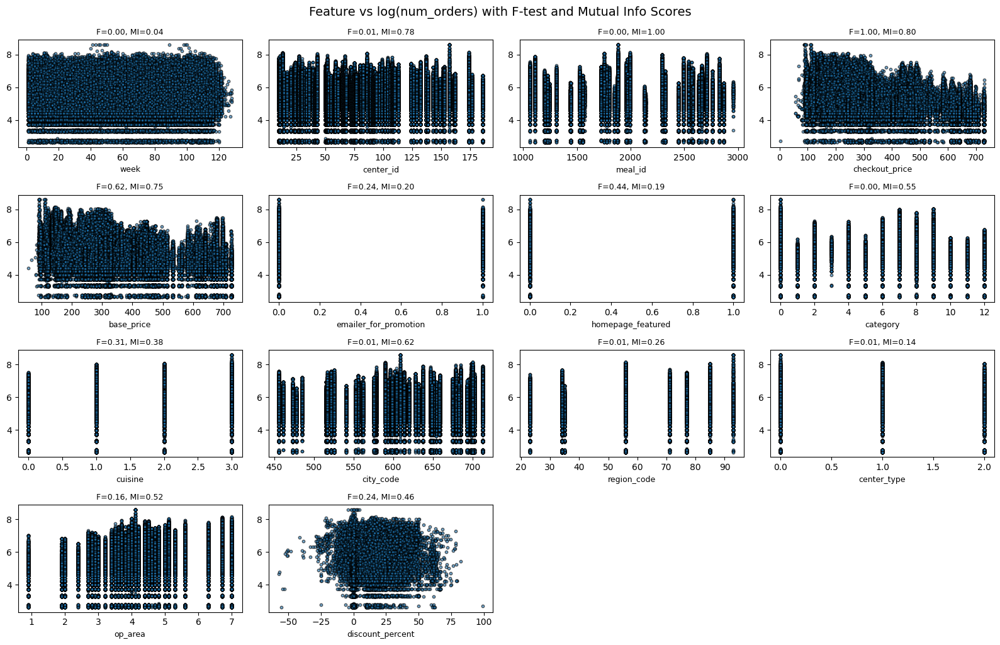

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from sklearn.feature_selection import f_regression, mutual_info_regression
from sklearn.preprocessing import LabelEncoder

# Step 1: Copy and preprocess
df = df_train_stratified_1.copy()

# Step 2: Label encode categorical features
categorical_cols = ['category', 'cuisine', 'center_type']
for col in categorical_cols:
    df[col] = LabelEncoder().fit_transform(df[col])

# Step 3: Prepare X and y
drop_cols = ['id', 'date', 'num_orders']  # 'week' can be dropped or kept
X = df.drop(columns=drop_cols)
y = df['num_orders']

# Step 4: F-test and Mutual Info
f_test, _ = f_regression(X, y)
f_test /= np.max(f_test)

mi = mutual_info_regression(X, y, random_state=0)
mi /= np.max(mi)

# Step 5: Visualization
plt.figure(figsize=(16, 10))
for i, col in enumerate(X.columns):
    plt.subplot(4, int(np.ceil(len(X.columns)/4)), i + 1)
    plt.scatter(X[col], y, edgecolor="black", s=10, alpha=0.6)
    plt.xlabel(col, fontsize=9)
    plt.title(f"F={f_test[i]:.2f}, MI={mi[i]:.2f}", fontsize=9)
    plt.tight_layout()

plt.suptitle("Feature vs log(num_orders) with F-test and Mutual Info Scores", fontsize=14, y=1.02)
plt.show()


In [ ]:
df_train_stratified_1, target_maps = target_encode_train(
    df_train_stratified_1,
    group_cols=['meal_id', 'center_id'],
    target_col='num_orders'
)

df_train_stratified_1['Featured_promotions'] = df_train_stratified_1['emailer_for_promotion'] | df_train_stratified_1['homepage_featured']

In [ ]:
df_train_stratified_1[['meal_id_encoded',	'center_id_encoded',	'Featured_promotions', 'op_area', 'checkout_price', 'date', 'num_orders']]

,meal_id_encoded,center_id_encoded,Featured_promotions,op_area,checkout_price,date,num_orders
0,5.908056,5.832741,0,6.3,181.39,2023-01-08,6.763885
1,5.908056,5.832741,0,6.3,183.36,2023-01-15,6.663133
2,5.908056,5.832741,0,6.3,184.36,2023-01-22,6.747587
3,5.908056,5.832741,0,6.3,182.36,2023-01-29,7.092574
4,5.908056,5.832741,0,6.3,183.39,2023-02-05,6.865891
...,...,...,...,...,...,...,...
225217,5.874599,5.109151,1,3.4,238.68,2025-02-23,6.249493
225218,5.874599,5.109151,0,3.4,311.43,2025-03-02,5.899897
225219,5.874599,5.109151,0,3.4,311.43,2025-03-09,5.247024
225220,5.874599,5.109151,0,3.4,310.43,2025-03-16,5.552960


In [ ]:
df_train_stratified_1 = df_train_stratified_1.rename(columns={
    'date': 'ds',
    'num_orders': 'y'
})

In [ ]:
df_test_stratified_1['num_orders'] = np.log1p(df_test_stratified_1['num_orders'])

In [ ]:
df_test_stratified_1 =  target_encode_test(df_test_stratified_1, target_maps, ['meal_id', 'center_id'])

df_test_stratified_1['Featured_promotions'] = df_test_stratified_1['emailer_for_promotion'] | df_test_stratified_1['homepage_featured']

df_test_stratified_1 = df_test_stratified_1.rename(columns={
    'date': 'ds',
    'num_orders': 'y'
})

In [ ]:
df_test_stratified_1.head()

,id,week,center_id,meal_id,checkout_price,base_price,emailer_for_promotion,homepage_featured,y,category,cuisine,city_code,region_code,center_type,op_area,discount_percent,ds,meal_id_encoded,center_id_encoded,Featured_promotions
0,1323770,117,10,1062,131.95,182.36,0,1,6.997596,Beverages,Italian,590,56,TYPE_B,6.3,27.643123,2025-03-30,5.908056,5.832741,1
1,1469984,118,10,1062,162.96,183.36,0,0,6.973543,Beverages,Italian,590,56,TYPE_B,6.3,11.125654,2025-04-06,5.908056,5.832741,0
2,1397783,119,10,1062,193.06,193.06,0,0,7.057037,Beverages,Italian,590,56,TYPE_B,6.3,0.000000,2025-04-13,5.908056,5.832741,0
3,1217347,120,10,1062,193.06,194.06,0,0,6.628041,Beverages,Italian,590,56,TYPE_B,6.3,0.515305,2025-04-20,5.908056,5.832741,0
4,1285623,121,10,1062,194.06,194.06,0,0,6.824374,Beverages,Italian,590,56,TYPE_B,6.3,0.000000,2025-04-27,5.908056,5.832741,0


In [ ]:
all_forecasts = []

regressors = ['meal_id_encoded',	'center_id_encoded',	'Featured_promotions', 'op_area', 'checkout_price']




def prophet_train(x, all_forecasts):
    center = x['center_id'].iloc[0]
    meal = x['meal_id'].iloc[0]

    df = x[['ds', 'y'] + regressors].sort_values(by='ds')



    m = Prophet(weekly_seasonality=True)

    for regressor in regressors:
      m.add_regressor(regressor)

    m.fit(df)

    # prediction

    test_subset = df_test_stratified_1.loc[(df_test_stratified_1['center_id'] == center) & (df_test_stratified_1['meal_id'] == meal), :]
    period = len(test_subset)
    future = m.make_future_dataframe(periods=len(test_subset), freq='W')
    print(future)
    print(test_subset['ds'])
    future = future.merge(test_subset[['ds'] + regressors], on='ds', how='right')

    forecast = m.predict(future)

    # Add identifiers
    forecast['center_id'] = center
    forecast['meal_id'] = meal

    # Select required columns
    forecast_needed = forecast[['ds', 'yhat', 'center_id', 'meal_id']]

    # Append to all forecasts
    all_forecasts.append(forecast_needed)


seasonal_series = df_train_stratified_1.groupby(['center_id', 'meal_id']).apply(lambda x: prophet_train(x, all_forecasts))

# Combine all forecasts
final_forecast_df = pd.concat(all_forecasts, ignore_index=True)


INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpv62m8e3r/ywf4odar.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpv62m8e3r/cp39didp.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=55670', 'data', 'file=/tmp/tmpv62m8e3r/ywf4odar.json', 'init=/tmp/tmpv62m8e3r/cp39didp.json', 'output', 'file=/tmp/tmpv62m8e3r/prophet_modelbhs3p7lq/prophet_model-20250501111628.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
11:16:28 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
11:16:28 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


            ds
0   2023-01-08
1   2023-01-15
2   2023-01-22
3   2023-01-29
4   2023-02-05
..         ...
140 2025-09-14
141 2025-09-21
142 2025-09-28
143 2025-10-05
144 2025-10-12

[145 rows x 1 columns]
0    2025-03-30
1    2025-04-06
2    2025-04-13
3    2025-04-20
4    2025-04-27
5    2025-05-04
6    2025-05-11
7    2025-05-18
8    2025-05-25
9    2025-06-01
10   2025-06-08
11   2025-06-15
12   2025-06-22
13   2025-06-29
14   2025-07-06
15   2025-07-13
16   2025-07-20
17   2025-07-27
18   2025-08-03
19   2025-08-10
20   2025-08-17
21   2025-08-24
22   2025-08-31
23   2025-09-07
24   2025-09-14
25   2025-09-21
26   2025-09-28
27   2025-10-05
28   2025-10-12
Name: ds, dtype: datetime64[ns]


ValueError: Found NaN in column 'meal_id_encoded'

In [ ]:
final_forecast_df

In [ ]:
df_test_stratified_1

In [ ]:
df_actual_vs_predicted = df_test_stratified_1.merge(final_forecast_df, on = ['ds', 'center_id', 'meal_id'], how = 'left')[['ds', 'y', 'yhat']]

In [ ]:
df_actual_vs_predicted

In [ ]:
df_actual_vs_predicted.isna().sum()

In [ ]:
count_zero_or_negative = (df_actual_vs_predicted['yhat'] <= 0).sum()
print(f"Count of zero or negative values in yhat: {count_zero_or_negative}")


In [ ]:
# Compute the mean of only the positive values
positive_mean = df_actual_vs_predicted.loc[df_actual_vs_predicted['yhat'] > 0, 'yhat'].mean()

# Replace 0 and negative values with that mean
df_actual_vs_predicted['yhat'] = df_actual_vs_predicted['yhat'].apply(lambda x: positive_mean if x <= 0 else x)


In [ ]:
rmsle = np.sqrt(np.mean(((df_actual_vs_predicted['y']) - (df_actual_vs_predicted['yhat'])) ** 2))
rmsle

In [ ]:
# Assuming df_actual_vs_predicted is your DataFrame containing 'y' and 'yhat'
# Calculate residuals

residuals =(df_actual_vs_predicted['y']) -(df_actual_vs_predicted['yhat'])

# Calculate the Durbin-Watson statistic
from statsmodels.stats.stattools import durbin_watson

dw_statistic = durbin_watson(residuals)

# Print the Durbin-Watson value
print(f"Durbin-Watson statistic: {dw_statistic}")


# Classification Trees [On Heart Dataset]

## Importing

In [ ]:
df = pd.read_csv('/content/processed.cleveland.data', header = None)
df.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13
0,63.0,1.0,1.0,145.0,233.0,1.0,2.0,150.0,0.0,2.3,3.0,0.0,6.0,0
1,67.0,1.0,4.0,160.0,286.0,0.0,2.0,108.0,1.0,1.5,2.0,3.0,3.0,2
2,67.0,1.0,4.0,120.0,229.0,0.0,2.0,129.0,1.0,2.6,2.0,2.0,7.0,1
3,37.0,1.0,3.0,130.0,250.0,0.0,0.0,187.0,0.0,3.5,3.0,0.0,3.0,0
4,41.0,0.0,2.0,130.0,204.0,0.0,2.0,172.0,0.0,1.4,1.0,0.0,3.0,0


## Data Cleaning

In [ ]:
df.columns = ['age', 'sex', 'cp', 'restbp', 'chol', 'fbs', 'restecg',
              'thalach', 'exang', 'oldpeak', 'slope', 'ca', 'thal', 'hd']
df.head()

,age,sex,cp,restbp,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,hd
0,63.0,1.0,1.0,145.0,233.0,1.0,2.0,150.0,0.0,2.3,3.0,0.0,6.0,0
1,67.0,1.0,4.0,160.0,286.0,0.0,2.0,108.0,1.0,1.5,2.0,3.0,3.0,2
2,67.0,1.0,4.0,120.0,229.0,0.0,2.0,129.0,1.0,2.6,2.0,2.0,7.0,1
3,37.0,1.0,3.0,130.0,250.0,0.0,0.0,187.0,0.0,3.5,3.0,0.0,3.0,0
4,41.0,0.0,2.0,130.0,204.0,0.0,2.0,172.0,0.0,1.4,1.0,0.0,3.0,0


In [ ]:
df.dtypes

,0
age,float64
sex,float64
cp,float64
restbp,float64
chol,float64
fbs,float64
restecg,float64
thalach,float64
exang,float64
oldpeak,float64


In [ ]:
print(df['ca'].unique())
print(df['thal'].unique())

['0.0' '3.0' '2.0' '1.0' '?']
['6.0' '3.0' '7.0' '?']


In [ ]:
m = len(df.loc[(df['ca'] == '?') | (df['thal'] == '?'), :])
t = len(df)

print(f'Percentage of rows with missing values {m*100/t}')

Percentage of rows with missing values 1.9801980198019802


In [ ]:
df_not_missing_data = df[(df['ca'] != '?') & (df['thal'] != '?')]

## Splitting the data into Target and Features

In [ ]:
X = df_not_missing_data.loc[:, df_not_missing_data.columns != 'hd'].copy()
X.head()

,age,sex,cp,restbp,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal
0,63.0,1.0,1.0,145.0,233.0,1.0,2.0,150.0,0.0,2.3,3.0,0.0,6.0
1,67.0,1.0,4.0,160.0,286.0,0.0,2.0,108.0,1.0,1.5,2.0,3.0,3.0
2,67.0,1.0,4.0,120.0,229.0,0.0,2.0,129.0,1.0,2.6,2.0,2.0,7.0
3,37.0,1.0,3.0,130.0,250.0,0.0,0.0,187.0,0.0,3.5,3.0,0.0,3.0
4,41.0,0.0,2.0,130.0,204.0,0.0,2.0,172.0,0.0,1.4,1.0,0.0,3.0


In [ ]:
y = df_not_missing_data['hd'].copy()
y.head()

,hd
0,0
1,2
2,1
3,0
4,0


## One Hot encoding

In [ ]:
X_encoded = pd.get_dummies(X, columns = ['cp', 'restecg', 'slope', 'thal'], dtype = int)

X_encoded.head()

,age,sex,restbp,chol,fbs,thalach,exang,oldpeak,ca,cp_1.0,...,cp_4.0,restecg_0.0,restecg_1.0,restecg_2.0,slope_1.0,slope_2.0,slope_3.0,thal_3.0,thal_6.0,thal_7.0
0,63.0,1.0,145.0,233.0,1.0,150.0,0.0,2.3,0.0,1,...,0,0,0,1,0,0,1,0,1,0
1,67.0,1.0,160.0,286.0,0.0,108.0,1.0,1.5,3.0,0,...,1,0,0,1,0,1,0,1,0,0
2,67.0,1.0,120.0,229.0,0.0,129.0,1.0,2.6,2.0,0,...,1,0,0,1,0,1,0,0,0,1
3,37.0,1.0,130.0,250.0,0.0,187.0,0.0,3.5,0.0,0,...,0,1,0,0,0,0,1,1,0,0
4,41.0,0.0,130.0,204.0,0.0,172.0,0.0,1.4,0.0,0,...,0,0,0,1,1,0,0,1,0,0


## Conforming the target to binary classification

In [ ]:
y.unique()

array([0, 2, 1, 3, 4])

In [ ]:
y_greater_than_0 = y>0
y[y_greater_than_0] = 1
y.unique()

array([0, 1])

## Test Train Split and Decision Tree

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X_encoded, y, random_state = 42)

In [ ]:
dt_clf = DecisionTreeClassifier(random_state = 42)
dt_clf = dt_clf.fit(X_train, y_train)

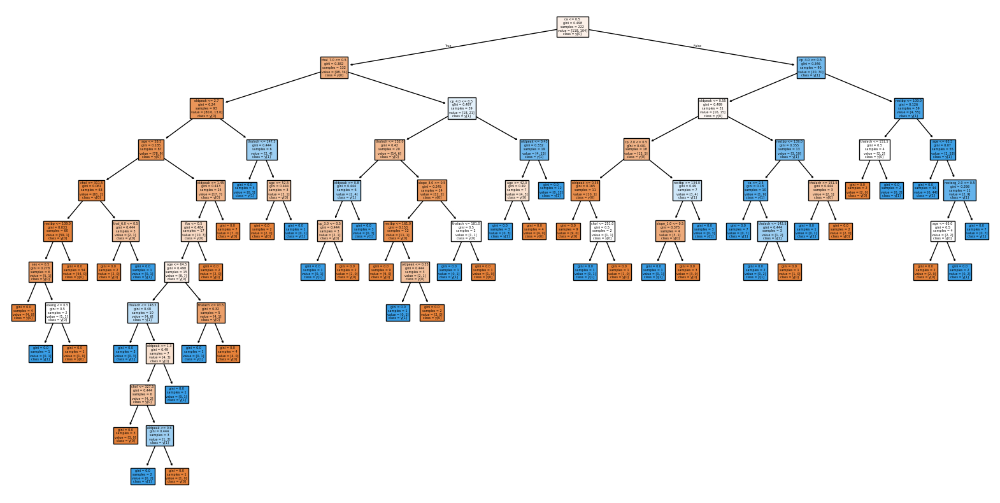

In [ ]:
plt.figure(figsize=(20, 10))
plot_tree(dt_clf, filled=True, feature_names=X_train.columns, class_names=True)
plt.show()

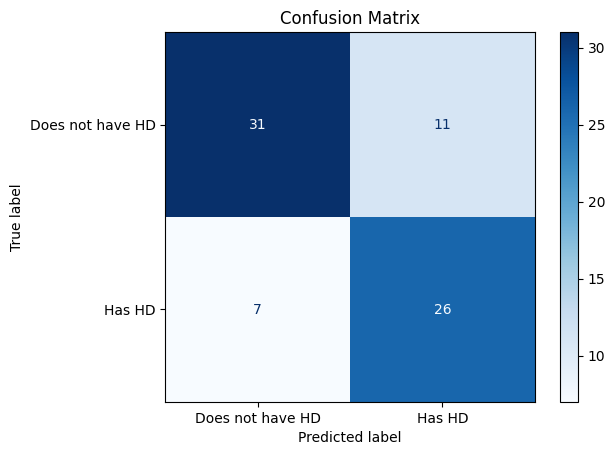

In [ ]:
ConfusionMatrixDisplay.from_estimator(
    dt_clf,             # your trained classifier
    X_test, y_test,     # test data
    display_labels=["Does not have HD", "Has HD"],
    cmap='Blues',
    normalize=None
)
plt.title("Confusion Matrix")
plt.show()

## Cost Complexity Pruning

### Finding all the pruning alphas

In [ ]:
path = dt_clf.cost_complexity_pruning_path(X_train, y_train)
ccp_alphas = path.ccp_alphas
ccp_alphas = ccp_alphas[:-1]
print(path)
dt_clf_many = []

for ccp_alpha in ccp_alphas:
  dt_clf = DecisionTreeClassifier(random_state=0 , ccp_alpha = ccp_alpha)
  dt_clf.fit(X_train, y_train)
  dt_clf_many.append(dt_clf)


{'ccp_alphas': array([0.        , 0.00295295, 0.003861  , 0.00405405, 0.004095  ,
       0.00429358, 0.00514801, 0.00541298, 0.00578761, 0.00600601,
       0.00600601, 0.00600601, 0.00667591, 0.00675676, 0.00757375,
       0.00811505, 0.00868726, 0.00889851, 0.01038181, 0.0105777 ,
       0.01422475, 0.01604051, 0.01642461, 0.02103075, 0.03680006,
       0.03934523, 0.13046216]), 'impurities': array([0.        , 0.00885886, 0.02430287, 0.03241098, 0.04060099,
       0.04918815, 0.06463216, 0.08628407, 0.10364689, 0.1156589 ,
       0.12767091, 0.13367692, 0.14035282, 0.14710958, 0.15468333,
       0.17091343, 0.17960069, 0.18849919, 0.19888101, 0.2094587 ,
       0.2379082 , 0.25394872, 0.27037333, 0.29140408, 0.32820413,
       0.36754937, 0.49801153])}


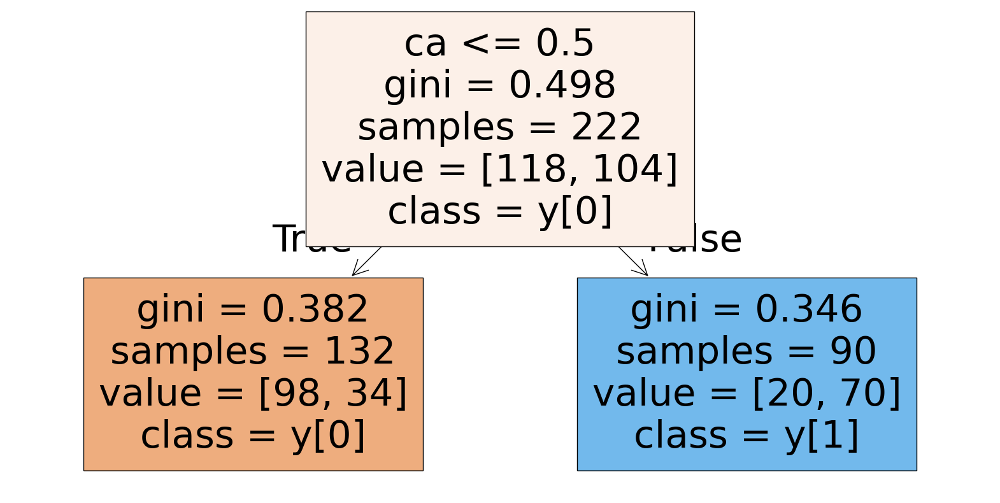

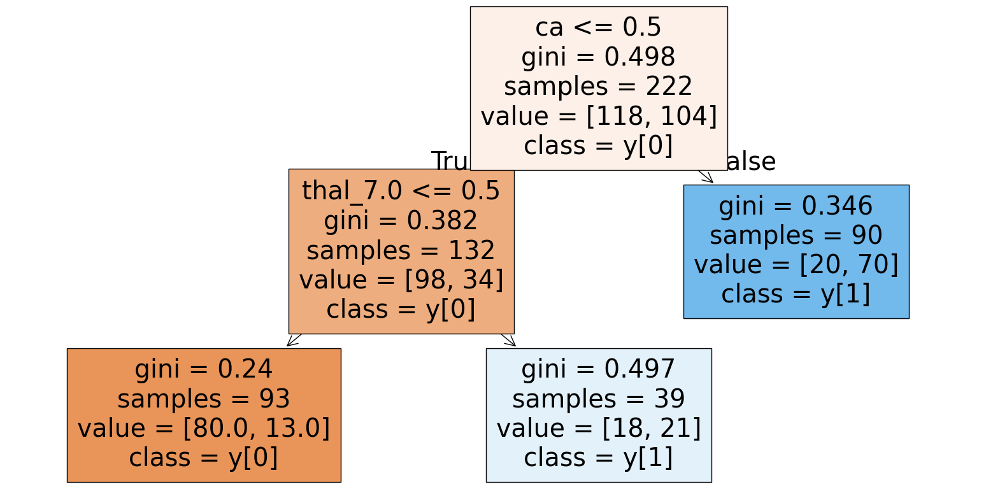

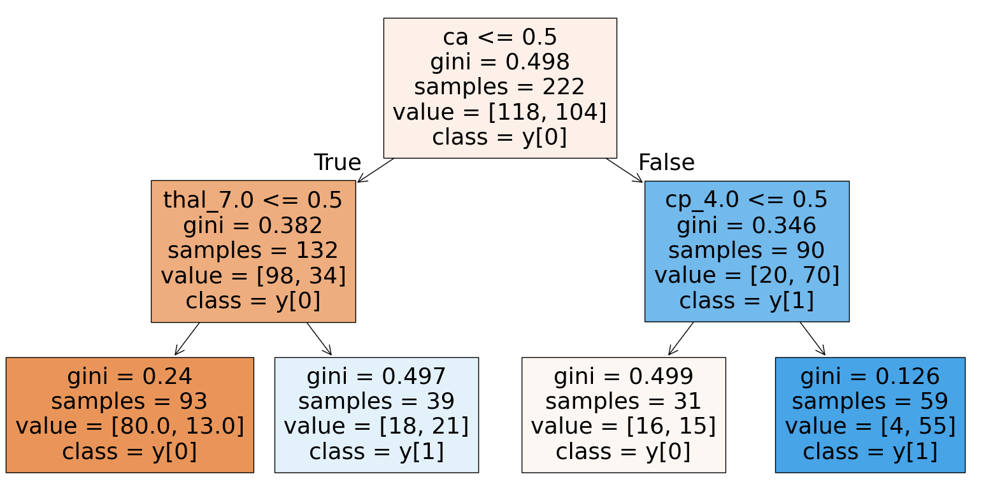

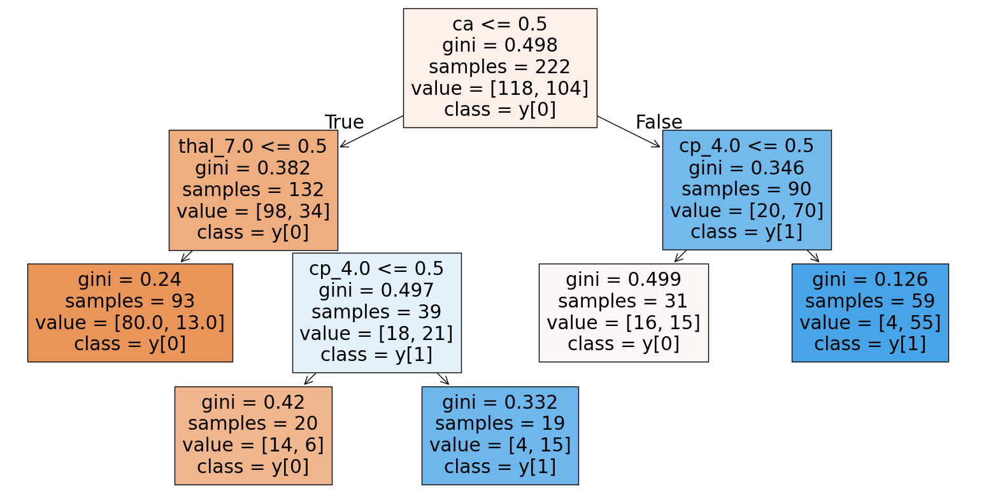

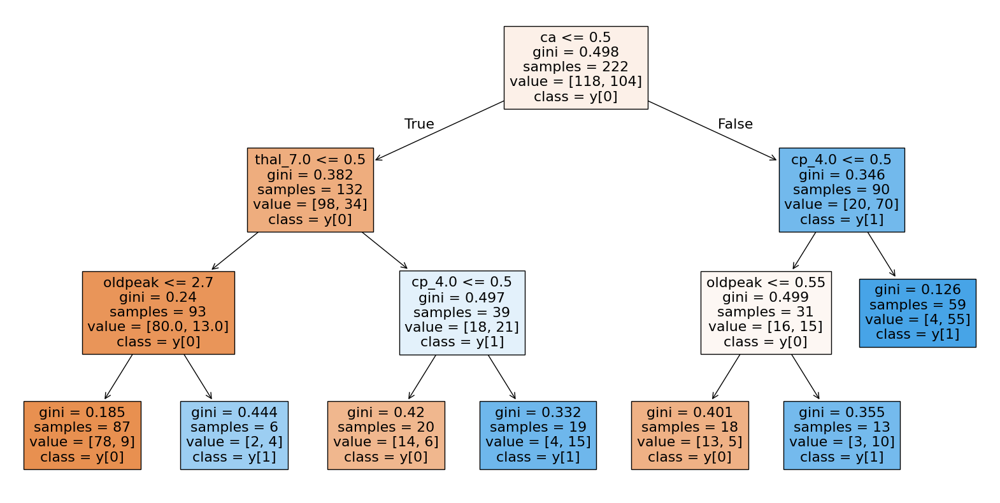

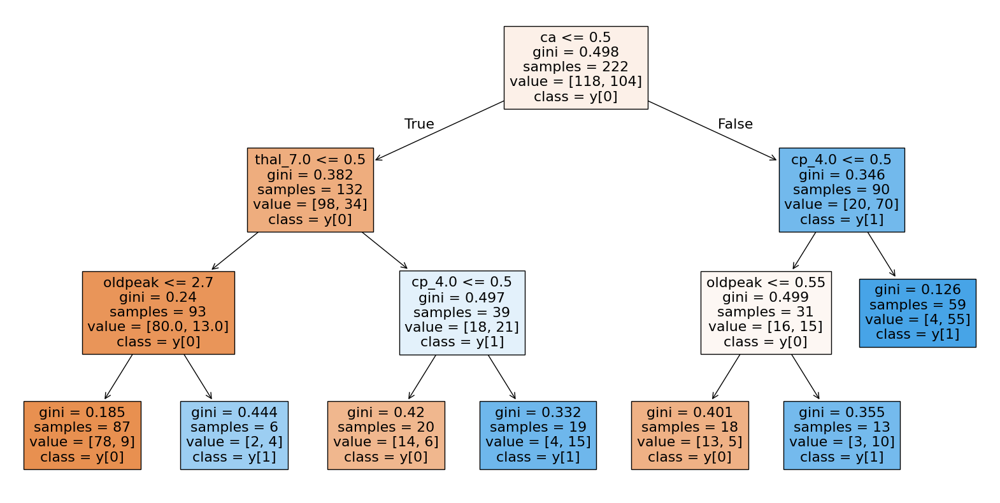

In [ ]:
count = 0

for dt_clf  in dt_clf_many[::-1]:
  if count <= 5:

    count += 1
    plt.figure(figsize=(20, 10))
    plot_tree(dt_clf, filled=True, feature_names=X_train.columns, class_names=True)
    plt.show()



### Checking the accuracy of each alpha

In [ ]:
train_scores = [dt_clf.score(X_train, y_train) for dt_clf in dt_clf_many]
test_scores = [dt_clf.score(X_test, y_test) for dt_clf in dt_clf_many]

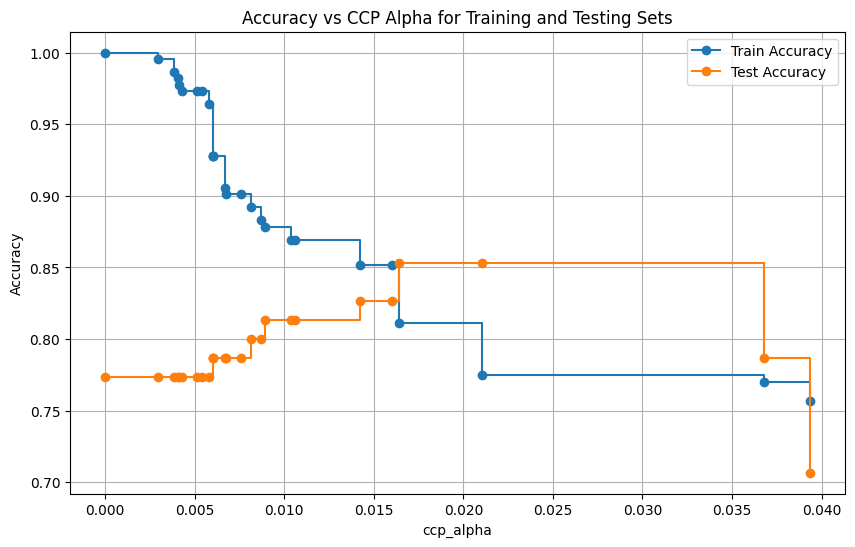

In [ ]:
plt.figure(figsize=(10, 6))
plt.plot(ccp_alphas, train_scores, marker='o', label='Train Accuracy', drawstyle="steps-post")
plt.plot(ccp_alphas, test_scores, marker='o', label='Test Accuracy', drawstyle="steps-post")
plt.xlabel("ccp_alpha")
plt.ylabel("Accuracy")
plt.title("Accuracy vs CCP Alpha for Training and Testing Sets")
plt.legend()
plt.grid(True)
plt.show()


# Note that when we apply ccp to ct, values from alpha go from 0 to 1, because GINI scores go from 0 to 1. In contrast, values for alpha for regression tree can be much larger since the ssr can in theory go from 0 to positive infiinity

In [ ]:

# Convert test_scores to numpy array for easier indexing
test_scores = np.array(test_scores)

# Get the index of the highest test score
best_index = np.argmax(test_scores)

# Extract the best alpha and its corresponding score
best_alpha = ccp_alphas[best_index]
best_test_score = test_scores[best_index]

print(f"Best ccp_alpha: {best_alpha}")
print(f"Best test accuracy: {best_test_score:.4f}")


Best ccp_alpha: 0.01642461319880674
Best test accuracy: 0.8533


### Wanted to plot the best alpha tree

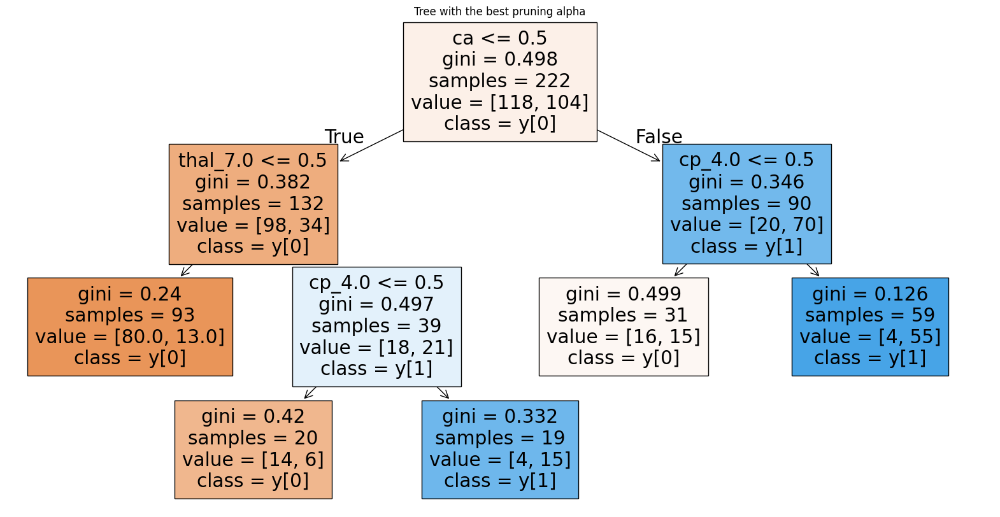

In [ ]:
dt_clf = DecisionTreeClassifier(random_state=0 , ccp_alpha = 0.01642461319880674)
dt_clf = dt_clf.fit(X_train, y_train)
plt.figure(figsize=(20, 10))
plot_tree(dt_clf, filled=True, feature_names=X_train.columns, class_names=True)
plt.title("Tree with the best pruning alpha")
plt.show()


### Cross validation to find the best alpha

In [ ]:
# A demonstration of how sensitive alpha is towards different training dataset

<Axes: xlabel='tree'>

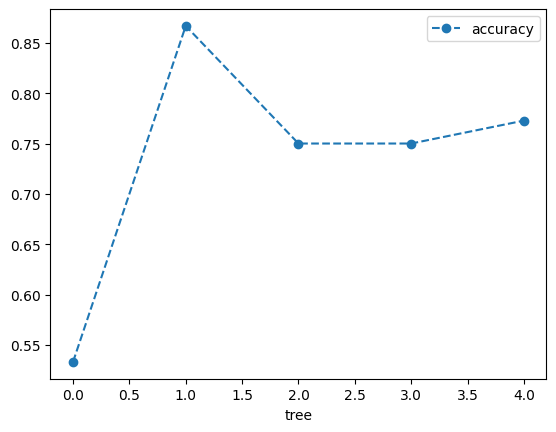

In [ ]:
dt_clf = DecisionTreeClassifier(random_state = 42, ccp_alpha = 0.016)

scores = cross_val_score(dt_clf, X_train, y_train, cv = 5)
df = pd.DataFrame(data= {'tree' : range(5), 'accuracy' : scores})

df.plot(x = 'tree', y = 'accuracy', marker = 'o', linestyle = '--')

The graph above shows that using different training and testing data with same alpha results in different accuracies, therefore we will use cross validation to find optimal value for ccp_alpha

In [ ]:
alpha_loop_values = []

for ccp_alpha in ccp_alphas:
  dt_clf = DecisionTreeClassifier(random_state = 0, ccp_alpha = ccp_alpha)
  scores = cross_val_score(dt_clf, X_train, y_train, cv = 5)
  alpha_loop_values.append([ccp_alpha, np.mean(scores), np.std(scores)])


alpha_results = pd.DataFrame(alpha_loop_values, columns = ['alpha', 'mean', 'std'])



<Axes: xlabel='alpha'>

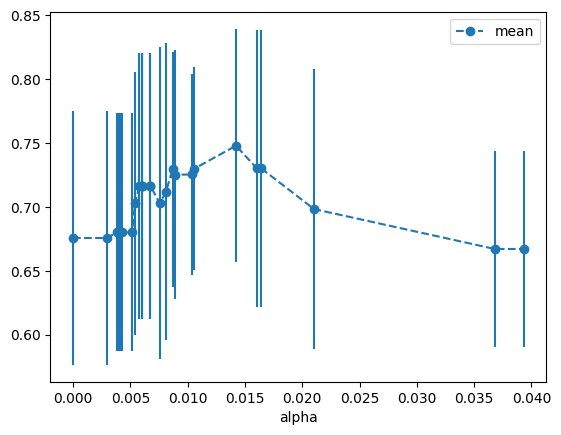

In [ ]:
alpha_results.plot(x = 'alpha', y = 'mean', yerr = 'std', marker = 'o', linestyle = '--')

In [ ]:
ideal_ccp_alpha = float(alpha_results.sort_values(by = 'mean', ascending = False).head(1)['alpha'])

ideal_ccp_alpha

<ipython-input-102-e5f54d664b98>:1: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  ideal_ccp_alpha = float(alpha_results.sort_values(by = 'mean', ascending = False).head(1)['alpha'])


0.014224751066856332

### Using the final alpha

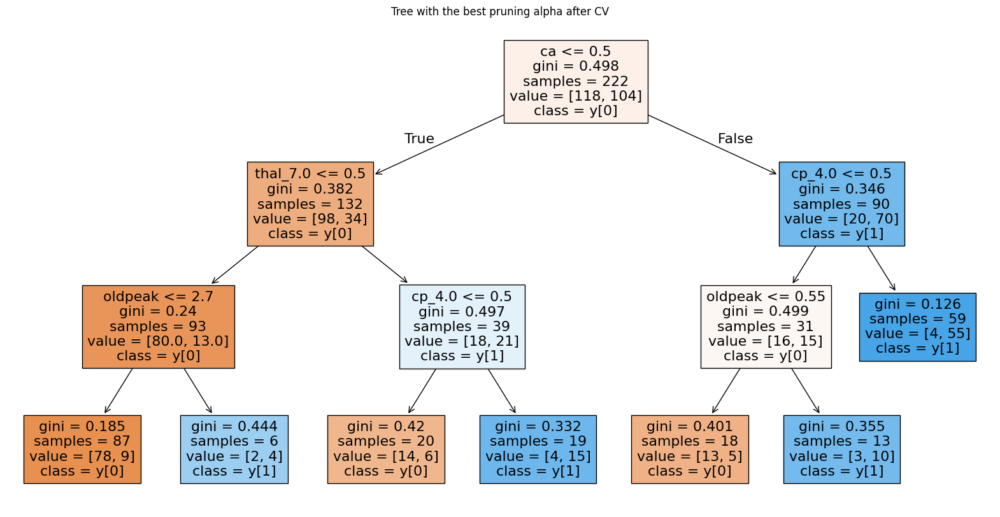

In [ ]:
dt_clf_pruned_cv = DecisionTreeClassifier(random_state=0 , ccp_alpha = ideal_ccp_alpha)
dt_clf_pruned_cv = dt_clf_pruned_cv.fit(X_train, y_train)
plt.figure(figsize=(20, 10))
plot_tree(dt_clf_pruned_cv, filled=True, feature_names=X_train.columns, class_names=True)
plt.title("Tree with the best pruning alpha after CV")
plt.show()



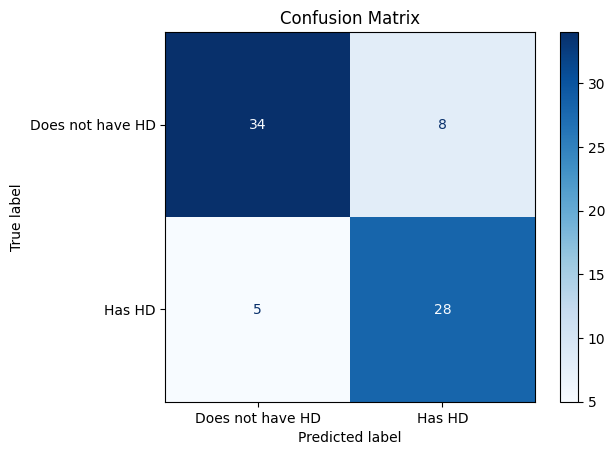

In [ ]:
ConfusionMatrixDisplay.from_estimator(
    dt_clf_pruned_cv,
    X_test, y_test,
    display_labels=["Does not have HD", "Has HD"],
    cmap='Blues',
    normalize=None
)
plt.title("Confusion Matrix")
plt.show()

# Regression Trees [On Food Demand Forecasting Data]

## Training set split in subtrain and subtest to get alpha

In [ ]:
df_train_stratified['num_orders'] = np.log1p(df_train_stratified['num_orders'])
df_test_stratified['num_orders'] = np.log1p(df_test_stratified['num_orders'])

In [ ]:
# Initialize empty dataframes for stratified training and testing data
df_sub_train_stratified = pd.DataFrame()
df_sub_test_stratified = pd.DataFrame()

# Loop over each group (center_id, meal_id)
for (center, meal), df in df_train_stratified.groupby(['center_id', 'meal_id']):
    # Sort by 'week' to ensure chronological order
    df_sorted = df.sort_values(by='week')

    if len(df_sorted) == 1:
      train_df = df_sorted.iloc[:,:]  # Top 80% for training

    else:

      # Split 80% for training and 20% for testing based on sorted week
      train_size = int(len(df_sorted) * 0.7)

      train_df = df_sorted.iloc[:train_size]  # Top 80% for training
      test_df = df_sorted.iloc[train_size:]   # Bottom 20% for testing

      # Concatenate the data for training and testing
      df_sub_train_stratified = pd.concat([df_sub_train_stratified, train_df], axis=0)
      df_sub_test_stratified = pd.concat([df_sub_test_stratified, test_df], axis=0)

  # After this, df_train_stratified will contain 80% of the data for training (chronologically ordered),
  # and df_test_stratified will contain 20% for testing (more recent data).


## Feature selection and encoding for subtest and subtrain

In [ ]:
X = df_sub_train_stratified.drop(columns= ['id', 'week', 'base_price',  'date'])
X.head()

,center_id,meal_id,checkout_price,emailer_for_promotion,homepage_featured,num_orders,category,cuisine,city_code,region_code,center_type,op_area,discount_percent
2370,10,1062,181.39,0,0,6.763885,Beverages,Italian,590,56,TYPE_B,6.3,0.000000
5273,10,1062,183.36,0,0,6.663133,Beverages,Italian,590,56,TYPE_B,6.3,-0.548366
8175,10,1062,184.36,0,0,6.747587,Beverages,Italian,590,56,TYPE_B,6.3,-1.096732
11064,10,1062,182.36,0,0,7.092574,Beverages,Italian,590,56,TYPE_B,6.3,0.545375
13918,10,1062,183.39,0,0,6.865891,Beverages,Italian,590,56,TYPE_B,6.3,-1.102597


In [ ]:
X, target_maps = target_encode_train(
    X,
    group_cols=['meal_id', 'center_id', 'city_code', 'cuisine'],
    target_col='num_orders'
)




columns_to_encode = ['category',  'center_type', 'region_code']

# Create dummy variables but keep the original columns as well
X_train = pd.get_dummies(X, columns=columns_to_encode, dtype=int, drop_first=False)

# The original categorical columns are retained along with the new dummy variables

X_train.head()

,center_id,meal_id,checkout_price,emailer_for_promotion,homepage_featured,num_orders,cuisine,city_code,op_area,discount_percent,...,center_type_TYPE_B,center_type_TYPE_C,region_code_23,region_code_34,region_code_35,region_code_56,region_code_71,region_code_77,region_code_85,region_code_93
2370,10,1062,181.39,0,0,6.763885,Italian,590,6.3,0.000000,...,1,0,0,0,0,1,0,0,0,0
5273,10,1062,183.36,0,0,6.663133,Italian,590,6.3,-0.548366,...,1,0,0,0,0,1,0,0,0,0
8175,10,1062,184.36,0,0,6.747587,Italian,590,6.3,-1.096732,...,1,0,0,0,0,1,0,0,0,0
11064,10,1062,182.36,0,0,7.092574,Italian,590,6.3,0.545375,...,1,0,0,0,0,1,0,0,0,0
13918,10,1062,183.39,0,0,6.865891,Italian,590,6.3,-1.102597,...,1,0,0,0,0,1,0,0,0,0


In [ ]:
X1 = df_sub_test_stratified.drop(columns= ['id', 'week',  'base_price',  'date'])
X1.head()

,center_id,meal_id,checkout_price,emailer_for_promotion,homepage_featured,num_orders,category,cuisine,city_code,region_code,center_type,op_area,discount_percent
214578,10,1062,181.42,0,0,6.410175,Beverages,Italian,590,56,TYPE_B,6.3,0.000000
217806,10,1062,182.42,0,0,6.810142,Beverages,Italian,590,56,TYPE_B,6.3,-1.108525
221012,10,1062,182.42,0,0,6.698268,Beverages,Italian,590,56,TYPE_B,6.3,-0.551207
224233,10,1062,179.45,0,0,6.960348,Beverages,Italian,590,56,TYPE_B,6.3,0.554170
227487,10,1062,182.42,0,0,6.824374,Beverages,Italian,590,56,TYPE_B,6.3,-0.551207


In [ ]:
X1 =  target_encode_test(X1, target_maps, ['meal_id', 'center_id', 'city_code', 'cuisine'])


columns_to_encode = ['category',  'center_type', 'region_code']

# Create dummy variables but keep the original columns as well
X_test = pd.get_dummies(X1, columns=columns_to_encode, dtype=int, drop_first=False)

# The original categorical columns are retained along with the new dummy variables

X_test.head()

,center_id,meal_id,checkout_price,emailer_for_promotion,homepage_featured,num_orders,cuisine,city_code,op_area,discount_percent,...,center_type_TYPE_B,center_type_TYPE_C,region_code_23,region_code_34,region_code_35,region_code_56,region_code_71,region_code_77,region_code_85,region_code_93
214578,10,1062,181.42,0,0,6.410175,Italian,590,6.3,0.000000,...,1,0,0,0,0,1,0,0,0,0
217806,10,1062,182.42,0,0,6.810142,Italian,590,6.3,-1.108525,...,1,0,0,0,0,1,0,0,0,0
221012,10,1062,182.42,0,0,6.698268,Italian,590,6.3,-0.551207,...,1,0,0,0,0,1,0,0,0,0
224233,10,1062,179.45,0,0,6.960348,Italian,590,6.3,0.554170,...,1,0,0,0,0,1,0,0,0,0
227487,10,1062,182.42,0,0,6.824374,Italian,590,6.3,-0.551207,...,1,0,0,0,0,1,0,0,0,0


In [ ]:
X_train.columns

Index(['center_id', 'meal_id', 'checkout_price', 'emailer_for_promotion',
       'homepage_featured', 'num_orders', 'cuisine', 'city_code', 'op_area',
       'discount_percent', 'meal_id_encoded', 'center_id_encoded',
       'city_code_encoded', 'cuisine_encoded', 'category_Beverages',
       'category_Biryani', 'category_Desert', 'category_Extras',
       'category_Fish', 'category_Other Snacks', 'category_Pasta',
       'category_Pizza', 'category_Rice Bowl', 'category_Salad',
       'category_Sandwich', 'category_Seafood', 'category_Soup',
       'category_Starters', 'center_type_TYPE_A', 'center_type_TYPE_B',
       'center_type_TYPE_C', 'region_code_23', 'region_code_34',
       'region_code_35', 'region_code_56', 'region_code_71', 'region_code_77',
       'region_code_85', 'region_code_93'],
      dtype='object')

In [ ]:
X_train = X_train.drop(columns=['num_orders', 'meal_id', 'center_id', 'city_code', 'cuisine'])

X_test = X_test.drop(columns=['num_orders', 'meal_id', 'center_id', 'city_code', 'cuisine'])

y_test = df_sub_test_stratified['num_orders']

In [ ]:
y_train = df_sub_train_stratified['num_orders']

## Getting Pruning Alphas

In [ ]:

dt_reg = DecisionTreeRegressor(random_state = 42)


In [ ]:
path = dt_reg.cost_complexity_pruning_path(X_train, y_train)
ccp_alphas = path.ccp_alphas
ccp_alphas = ccp_alphas[:-1]
ccp_alphas

array([ 0.00000000e+00, -2.57498016e-19, -1.28749008e-19, ...,
        3.14831433e-02,  4.70594485e-02,  9.64224379e-02])

In [ ]:
ccp_alphas = ccp_alphas[ccp_alphas >= 0]   # Negative alphas make no sense, removing duplicates
ccp_alphas.shape
ccp_alphas = np.unique(ccp_alphas)

## Choosing the best alpha using subtrain and subtest

In [ ]:
N = 5  # Limited by the computational power
sampled_ccp_alphas = np.quantile(ccp_alphas, np.linspace(0.9, 0.99, N))

In [ ]:
# N = 25  # Adjust as needed
# sampled_ccp_alphas = np.quantile(ccp_alphas, np.linspace(0, 1, N))
# sampled_ccp_alphas[::-1][:10]


# # The value of is taken from the graph that came from the code above, need to try this on test strat after conforming it appropriately if not work then just keep doing the different alpha graphs

In [ ]:
sampled_ccp_alphas

array([3.16774245e-06, 3.99967604e-06, 5.46482440e-06, 8.96498622e-06,
       3.25333583e-05])

In [ ]:

np.quantile(ccp_alphas, 0.9)

np.float64(3.1677424512661485e-06)

In [ ]:
from tqdm import tqdm

dt_reg_many = []

for ccp_alpha in tqdm(sampled_ccp_alphas, desc="Training models"):
    dt_clf = DecisionTreeRegressor(random_state=42, ccp_alpha=ccp_alpha)
    dt_clf.fit(X_train, y_train)
    dt_reg_many.append(dt_clf)


Training models: 100%|██████████| 5/5 [12:15<00:00, 147.02s/it]


In [ ]:
train_scores = [dt_reg.score(X_train, y_train) for dt_reg in dt_reg_many]
test_scores = [dt_reg.score(X_test, y_test) for dt_reg in dt_reg_many]

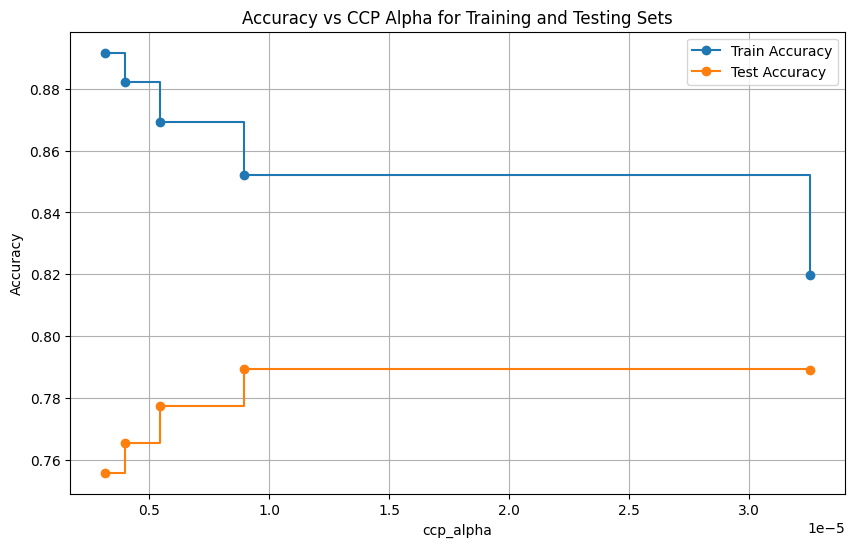

In [ ]:
plt.figure(figsize=(10, 6))
plt.plot(sampled_ccp_alphas, train_scores, marker='o', label='Train Accuracy', drawstyle="steps-post")
plt.plot(sampled_ccp_alphas, test_scores, marker='o', label='Test Accuracy', drawstyle="steps-post")
plt.xlabel("ccp_alpha")
plt.ylabel("Accuracy")
plt.title("Accuracy vs CCP Alpha for Training and Testing Sets")
plt.legend()
plt.grid(True)
plt.show()


# Note that when we apply ccp to ct, values from alpha go from 0 to 1, because GINI scores go from 0 to 1. In contrast, values for alpha for regression tree can be much larger since the ssr can in theory go from 0 to positive infiinity

In [ ]:
sampled_ccp_alphas[3]

np.float64(8.964986224288171e-06)

In [ ]:

ideal_ccp_alpha = float(sampled_ccp_alphas[3])

## Training the pruned tree

In [ ]:
# from sklearn.tree import DecisionTreeRegressor
# from sklearn.metrics import mean_squared_error

# # Define the ideal ccp_alpha
# dt_reg_pruned_cv = DecisionTreeRegressor(random_state=0, ccp_alpha=ideal_ccp_alpha)

# # List of max_depth values you want to test
# max_depth_values = [3, 5, 7, 10, 15, 20, None]

# # Initialize variables to keep track of the best model and performance
# best_max_depth = None
# best_score = float('inf')  # Start with a very high score for MSE
# best_model = None

# # Loop through max_depth values
# for max_depth in max_depth_values:
#     # Set the max_depth for the model
#     dt_reg_pruned_cv.set_params(max_depth=max_depth)

#     # Fit the model on the training data
#     dt_reg_pruned_cv.fit(X_train, y_train)

#     # Make predictions on the test set
#     y_pred = dt_reg_pruned_cv.predict(X_test)

#     # Calculate the MSE for the current model
#     mse = mean_squared_error(y_test, y_pred)

#     # Check if this model is better than the previous ones
#     if mse < best_score:
#         best_score = mse
#         best_max_depth = max_depth
#         best_model = dt_reg_pruned_cv

# # Output the best parameters and score
# print(f"Best max_depth: {best_max_depth}")
# print(f"Best MSE: {best_score}")

# # Optionally, evaluate the best model's performance on the test set
# test_score = best_model.score(X_test, y_test)
# print(f"Test R^2 Score: {test_score}")


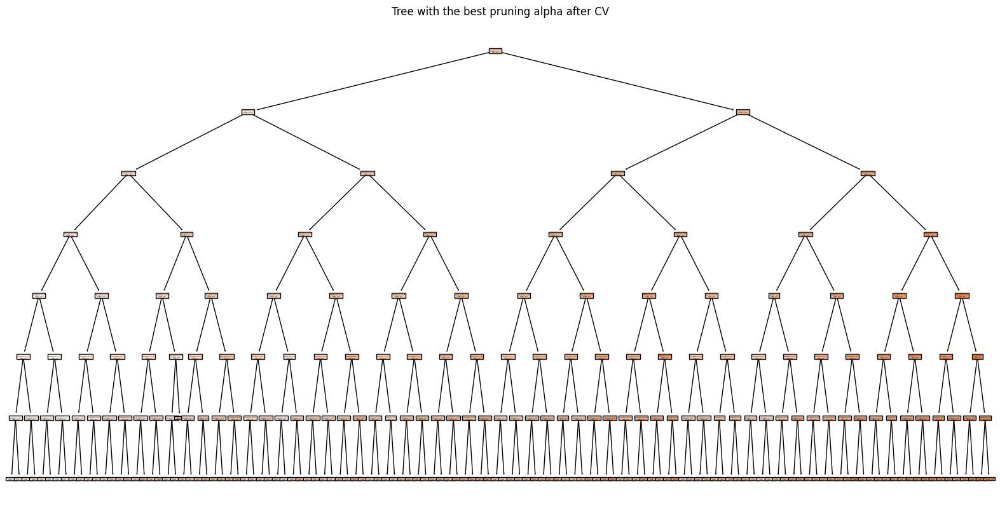

In [ ]:
dt_reg_pruned_cv = DecisionTreeRegressor(random_state=0 , ccp_alpha = ideal_ccp_alpha, max_depth = 7)
dt_reg_pruned_cv = dt_reg_pruned_cv.fit(X_train, y_train)
plt.figure(figsize=(20, 10))
plot_tree(dt_reg_pruned_cv, filled=True, feature_names=X_train.columns, class_names=True)
plt.title("Tree with the best pruning alpha after CV")
plt.show()



In [ ]:
dt_reg_pruned_cv.get_depth()

7

## Testing the Pruned Tree on predictions

In [ ]:
df_test_stratified.head()

,id,week,center_id,meal_id,checkout_price,base_price,emailer_for_promotion,homepage_featured,num_orders,category,cuisine,city_code,region_code,center_type,op_area,discount_percent,date
315184,1488094,102,10,1062,157.14,157.14,0,0,6.699500,Beverages,Italian,590,56,TYPE_B,6.3,0.000000,2024-12-15
318220,1375444,103,10,1062,162.02,161.02,0,0,6.216606,Beverages,Italian,590,56,TYPE_B,6.3,-0.621041,2024-12-22
321424,1057121,104,10,1062,158.17,156.17,0,0,6.960348,Beverages,Italian,590,56,TYPE_B,6.3,-1.280656,2024-12-29
324748,1460785,105,10,1062,162.02,163.02,0,0,7.136483,Beverages,Italian,590,56,TYPE_B,6.3,0.613422,2025-01-05
328092,1178121,106,10,1062,161.05,160.05,0,0,6.810142,Beverages,Italian,590,56,TYPE_B,6.3,-0.624805,2025-01-12


In [ ]:
X_t = df_test_stratified.drop(columns= ['id', 'week',  'base_price', 'date'])
X_t.head()

,center_id,meal_id,checkout_price,emailer_for_promotion,homepage_featured,num_orders,category,cuisine,city_code,region_code,center_type,op_area,discount_percent
315184,10,1062,157.14,0,0,6.699500,Beverages,Italian,590,56,TYPE_B,6.3,0.000000
318220,10,1062,162.02,0,0,6.216606,Beverages,Italian,590,56,TYPE_B,6.3,-0.621041
321424,10,1062,158.17,0,0,6.960348,Beverages,Italian,590,56,TYPE_B,6.3,-1.280656
324748,10,1062,162.02,0,0,7.136483,Beverages,Italian,590,56,TYPE_B,6.3,0.613422
328092,10,1062,161.05,0,0,6.810142,Beverages,Italian,590,56,TYPE_B,6.3,-0.624805


In [ ]:
X_t =  target_encode_test(X_t, target_maps, ['meal_id', 'center_id',  'city_code', 'cuisine' ])

columns_to_encode = [ 'category',  'center_type', 'region_code']

# Create dummy variables but keep the original columns as well
X_test_strat = pd.get_dummies(X_t, columns=columns_to_encode, dtype=int, drop_first=False)

# The original categorical columns are retained along with the new dummy variables

X_test_strat.head()

,center_id,meal_id,checkout_price,emailer_for_promotion,homepage_featured,num_orders,cuisine,city_code,op_area,discount_percent,...,center_type_TYPE_B,center_type_TYPE_C,region_code_23,region_code_34,region_code_35,region_code_56,region_code_71,region_code_77,region_code_85,region_code_93
315184,10,1062,157.14,0,0,6.699500,Italian,590,6.3,0.000000,...,1,0,0,0,0,1,0,0,0,0
318220,10,1062,162.02,0,0,6.216606,Italian,590,6.3,-0.621041,...,1,0,0,0,0,1,0,0,0,0
321424,10,1062,158.17,0,0,6.960348,Italian,590,6.3,-1.280656,...,1,0,0,0,0,1,0,0,0,0
324748,10,1062,162.02,0,0,7.136483,Italian,590,6.3,0.613422,...,1,0,0,0,0,1,0,0,0,0
328092,10,1062,161.05,0,0,6.810142,Italian,590,6.3,-0.624805,...,1,0,0,0,0,1,0,0,0,0


In [ ]:
X_test_strat = X_test_strat.drop(columns=['num_orders', 'meal_id', 'center_id',  'city_code', 'cuisine'])


In [ ]:
y_test_pred = dt_reg_pruned_cv.predict(X_test_strat)

In [ ]:
y_test_pred = pd.Series(y_test_pred)

y_test_pred

,0
0,6.781917
1,6.781917
2,6.781917
3,6.781917
4,6.781917
...,...
138660,3.373627
138661,3.373627
138662,3.373627
138663,3.373627


In [ ]:
y_test_actual = df_test_stratified['num_orders']

In [ ]:

y_test_actual = y_test_actual.reset_index(drop=True)

In [ ]:
yhat = y_test_pred
y = y_test_actual


In [ ]:
rmsle = np.sqrt(np.mean(((y) - (yhat)) ** 2))

In [ ]:
rmsle

np.float64(0.66930127511746)

# Random Forest [Bharat]

## Training

### Feature encoding and engineering

In [ ]:
X = df_train_stratified.drop(columns= ['id',  'base_price',  'date'])
X.head()

,week,center_id,meal_id,checkout_price,emailer_for_promotion,homepage_featured,num_orders,category,cuisine,city_code,region_code,center_type,op_area,discount_percent
2370,1,10,1062,181.39,0,0,865.0,Beverages,Italian,590,56,TYPE_B,6.3,0.000000
5273,2,10,1062,183.36,0,0,782.0,Beverages,Italian,590,56,TYPE_B,6.3,-0.548366
8175,3,10,1062,184.36,0,0,851.0,Beverages,Italian,590,56,TYPE_B,6.3,-1.096732
11064,4,10,1062,182.36,0,0,1202.0,Beverages,Italian,590,56,TYPE_B,6.3,0.545375
13918,5,10,1062,183.39,0,0,958.0,Beverages,Italian,590,56,TYPE_B,6.3,-1.102597


In [ ]:
X, target_maps = target_encode_train(
    X,
    group_cols=['meal_id', 'center_id', 'city_code', 'cuisine'],
    target_col='num_orders'
)




columns_to_encode = ['category',  'center_type', 'region_code']

# Create dummy variables but keep the original columns as well
X_train = pd.get_dummies(X, columns=columns_to_encode, dtype=int, drop_first=False)

# The original categorical columns are retained along with the new dummy variables

X_train.head()

,week,center_id,meal_id,checkout_price,emailer_for_promotion,homepage_featured,num_orders,cuisine,city_code,op_area,...,center_type_TYPE_B,center_type_TYPE_C,region_code_23,region_code_34,region_code_35,region_code_56,region_code_71,region_code_77,region_code_85,region_code_93
2370,1,10,1062,181.39,0,0,865.0,Italian,590,6.3,...,1,0,0,0,0,1,0,0,0,0
5273,2,10,1062,183.36,0,0,782.0,Italian,590,6.3,...,1,0,0,0,0,1,0,0,0,0
8175,3,10,1062,184.36,0,0,851.0,Italian,590,6.3,...,1,0,0,0,0,1,0,0,0,0
11064,4,10,1062,182.36,0,0,1202.0,Italian,590,6.3,...,1,0,0,0,0,1,0,0,0,0
13918,5,10,1062,183.39,0,0,958.0,Italian,590,6.3,...,1,0,0,0,0,1,0,0,0,0


In [ ]:
X_train = X_train.drop(columns=['num_orders', 'meal_id', 'center_id', 'city_code', 'cuisine'])

In [ ]:
y_train = np.log1p(df_train_stratified['num_orders'])

### Model Fitting

In [ ]:
from sklearn.ensemble import RandomForestRegressor

In [ ]:
rf_reg = RandomForestRegressor(
    n_estimators=150,       # Number of trees in the forest
    max_depth= 20,         # No depth limit; trees grow until pure or other stopping criteria
    random_state=42,        # Ensures reproducible results
    n_jobs=-1               # Uses all CPU cores for faster training
)
rf_reg.fit(X_train, y_train)


RandomForestRegressor(max_depth=20, n_estimators=150, n_jobs=-1,
                      random_state=42)

## Testing

### Feature encoding and engineering

In [ ]:
X.shape

(138665, 18)

In [ ]:
X = df_test_stratified.drop(columns= ['id',  'base_price',  'date'])
X.head()

,week,center_id,meal_id,checkout_price,emailer_for_promotion,homepage_featured,num_orders,category,cuisine,city_code,region_code,center_type,op_area,discount_percent
315184,102,10,1062,157.14,0,0,811,Beverages,Italian,590,56,TYPE_B,6.3,0.000000
318220,103,10,1062,162.02,0,0,500,Beverages,Italian,590,56,TYPE_B,6.3,-0.621041
321424,104,10,1062,158.17,0,0,1053,Beverages,Italian,590,56,TYPE_B,6.3,-1.280656
324748,105,10,1062,162.02,0,0,1256,Beverages,Italian,590,56,TYPE_B,6.3,0.613422
328092,106,10,1062,161.05,0,0,906,Beverages,Italian,590,56,TYPE_B,6.3,-0.624805


In [ ]:
X[X.center_id == 10]

,week,center_id,meal_id,checkout_price,emailer_for_promotion,homepage_featured,num_orders,category,cuisine,city_code,region_code,center_type,op_area,discount_percent
315184,102,10,1062,157.14,0,0,811,Beverages,Italian,590,56,TYPE_B,6.3,0.000000
318220,103,10,1062,162.02,0,0,500,Beverages,Italian,590,56,TYPE_B,6.3,-0.621041
321424,104,10,1062,158.17,0,0,1053,Beverages,Italian,590,56,TYPE_B,6.3,-1.280656
324748,105,10,1062,162.02,0,0,1256,Beverages,Italian,590,56,TYPE_B,6.3,0.613422
328092,106,10,1062,161.05,0,0,906,Beverages,Italian,590,56,TYPE_B,6.3,-0.624805
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
442832,141,10,2956,591.73,0,0,379,Fish,Continental,590,56,TYPE_B,6.3,-0.169282
446077,142,10,2956,592.73,0,0,215,Fish,Continental,590,56,TYPE_B,6.3,-0.168996
449369,143,10,2956,592.73,0,0,149,Fish,Continental,590,56,TYPE_B,6.3,-0.168996
452670,144,10,2956,592.73,0,0,243,Fish,Continental,590,56,TYPE_B,6.3,0.000000


In [ ]:
X, target_maps = target_encode_train(
    X,
    group_cols=['meal_id', 'center_id', 'city_code', 'cuisine'],
    target_col='num_orders'
)

X = X[(X.center_id == 10) & (X.meal_id == 2956)]


columns_to_encode = ['category',  'center_type', 'region_code']

# Create dummy variables but keep the original columns as well
X_test = pd.get_dummies(X, columns=columns_to_encode, dtype=int, drop_first=False)

# The original categorical columns are retained along with the new dummy variables

X_test.head()

,week,center_id,meal_id,checkout_price,emailer_for_promotion,homepage_featured,num_orders,cuisine,city_code,op_area,discount_percent,meal_id_encoded,center_id_encoded,city_code_encoded,cuisine_encoded,category_Fish,center_type_TYPE_B,region_code_56
377089,121,10,2956,581.03,0,0,270,Continental,590,6.3,0.000000,108.260314,490.725223,363.545471,167.634388,1,1,1
380435,122,10,2956,586.91,0,0,189,Continental,590,6.3,0.000000,108.260314,490.725223,363.545471,167.634388,1,1,1
383770,123,10,2956,582.03,0,0,298,Continental,590,6.3,0.000000,108.260314,490.725223,363.545471,167.634388,1,1,1
387061,124,10,2956,585.91,0,0,190,Continental,590,6.3,0.170384,108.260314,490.725223,363.545471,167.634388,1,1,1
390312,125,10,2956,582.03,0,0,134,Continental,590,6.3,0.171518,108.260314,490.725223,363.545471,167.634388,1,1,1


In [ ]:
X_test = X_test.drop(columns=['num_orders', 'meal_id', 'center_id', 'city_code', 'cuisine'])
y = X['num_orders']

In [ ]:
y_test = np.log1p(df_test_stratified['num_orders'])

### Model Prediction

In [ ]:
rf_reg.fit(X_test, y)
y_rf_pred = rf_reg.predict(X_test)
y_rf_pred

array([260.10666667, 222.39333333, 270.58      , 190.27333333,
       179.23333333, 175.9       , 234.85333333, 266.99333333,
       398.37333333, 402.95333333, 321.2       , 434.56666667,
       267.27333333, 229.7       , 270.1       , 302.4       ,
       247.43333333, 305.01333333, 481.42      , 549.93333333,
       313.98666667, 234.64      , 184.18666667, 226.94666667,
       182.16      ])

In [ ]:
y_rf_pred.shape, y.shape

((25,), (25,))

<Axes: >

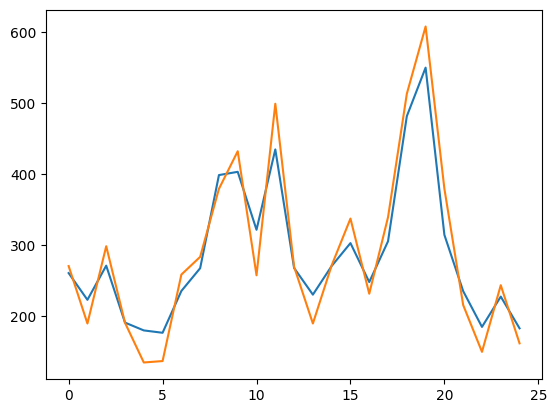

In [ ]:
# yhat = pd.Series(y_rf_pred)
sns.lineplot(y_rf_pred)
sns.lineplot(y.values)

In [ ]:
y = y_test.reset_index(drop = True)

In [ ]:
rmsle = np.sqrt(np.mean(((y) - (yhat)) ** 2))

In [ ]:
rmsle

np.float64(0.647416687635157)

# Random Forests

## Training

### Feature encoding and engineering

In [ ]:
X = df_train_stratified.drop(columns= ['id',  'base_price',  'date'])
X.head()

,week,center_id,meal_id,checkout_price,emailer_for_promotion,homepage_featured,num_orders,category,cuisine,city_code,region_code,center_type,op_area,discount_percent
2370,1,10,1062,181.39,0,0,865.0,Beverages,Italian,590,56,TYPE_B,6.3,0.000000
5273,2,10,1062,183.36,0,0,782.0,Beverages,Italian,590,56,TYPE_B,6.3,-0.548366
8175,3,10,1062,184.36,0,0,851.0,Beverages,Italian,590,56,TYPE_B,6.3,-1.096732
11064,4,10,1062,182.36,0,0,1202.0,Beverages,Italian,590,56,TYPE_B,6.3,0.545375
13918,5,10,1062,183.39,0,0,958.0,Beverages,Italian,590,56,TYPE_B,6.3,-1.102597


In [ ]:
X, target_maps = target_encode_train(
    X,
    group_cols=['meal_id', 'center_id', 'city_code', 'cuisine'],
    target_col='num_orders'
)




columns_to_encode = ['category',  'center_type', 'region_code']

# Create dummy variables but keep the original columns as well
X_train = pd.get_dummies(X, columns=columns_to_encode, dtype=int, drop_first=False)

# The original categorical columns are retained along with the new dummy variables

X_train.head()

,week,center_id,meal_id,checkout_price,emailer_for_promotion,homepage_featured,num_orders,cuisine,city_code,op_area,...,center_type_TYPE_B,center_type_TYPE_C,region_code_23,region_code_34,region_code_35,region_code_56,region_code_71,region_code_77,region_code_85,region_code_93
2370,1,10,1062,181.39,0,0,865.0,Italian,590,6.3,...,1,0,0,0,0,1,0,0,0,0
5273,2,10,1062,183.36,0,0,782.0,Italian,590,6.3,...,1,0,0,0,0,1,0,0,0,0
8175,3,10,1062,184.36,0,0,851.0,Italian,590,6.3,...,1,0,0,0,0,1,0,0,0,0
11064,4,10,1062,182.36,0,0,1202.0,Italian,590,6.3,...,1,0,0,0,0,1,0,0,0,0
13918,5,10,1062,183.39,0,0,958.0,Italian,590,6.3,...,1,0,0,0,0,1,0,0,0,0


In [ ]:
X_train = X_train.drop(columns=['num_orders', 'meal_id', 'center_id', 'city_code', 'cuisine'])

In [ ]:
y_train = np.log1p(df_train_stratified['num_orders'])

### Model Fitting

In [ ]:
from sklearn.ensemble import RandomForestRegressor

In [ ]:
rf_reg = RandomForestRegressor(
    n_estimators=150,       # Number of trees in the forest
    max_depth= 20,         # No depth limit; trees grow until pure or other stopping criteria
    random_state=42,        # Ensures reproducible results
    n_jobs=-1               # Uses all CPU cores for faster training
)
rf_reg.fit(X_train, y_train)


RandomForestRegressor(max_depth=20, n_estimators=150, n_jobs=-1,
                      random_state=42)

## Testing

### Feature encoding and engineering

In [ ]:
X.shape

(317880, 18)

In [ ]:
X = df_test_stratified.drop(columns= ['id',  'base_price',  'date'])
X.head()

,week,center_id,meal_id,checkout_price,emailer_for_promotion,homepage_featured,num_orders,category,cuisine,city_code,region_code,center_type,op_area,discount_percent
315184,102,10,1062,157.14,0,0,811,Beverages,Italian,590,56,TYPE_B,6.3,0.000000
318220,103,10,1062,162.02,0,0,500,Beverages,Italian,590,56,TYPE_B,6.3,-0.621041
321424,104,10,1062,158.17,0,0,1053,Beverages,Italian,590,56,TYPE_B,6.3,-1.280656
324748,105,10,1062,162.02,0,0,1256,Beverages,Italian,590,56,TYPE_B,6.3,0.613422
328092,106,10,1062,161.05,0,0,906,Beverages,Italian,590,56,TYPE_B,6.3,-0.624805


In [ ]:

X = target_encode_test(
    X,
    target_maps,
    ['meal_id', 'center_id', 'city_code', 'cuisine']

)



columns_to_encode = ['category',  'center_type', 'region_code']

# Create dummy variables but keep the original columns as well
X_test = pd.get_dummies(X, columns=columns_to_encode, dtype=int, drop_first=False)

# The original categorical columns are retained along with the new dummy variables

X_test.head()

,week,center_id,meal_id,checkout_price,emailer_for_promotion,homepage_featured,num_orders,cuisine,city_code,op_area,...,center_type_TYPE_B,center_type_TYPE_C,region_code_23,region_code_34,region_code_35,region_code_56,region_code_71,region_code_77,region_code_85,region_code_93
315184,102,10,1062,157.14,0,0,811,Italian,590,6.3,...,1,0,0,0,0,1,0,0,0,0
318220,103,10,1062,162.02,0,0,500,Italian,590,6.3,...,1,0,0,0,0,1,0,0,0,0
321424,104,10,1062,158.17,0,0,1053,Italian,590,6.3,...,1,0,0,0,0,1,0,0,0,0
324748,105,10,1062,162.02,0,0,1256,Italian,590,6.3,...,1,0,0,0,0,1,0,0,0,0
328092,106,10,1062,161.05,0,0,906,Italian,590,6.3,...,1,0,0,0,0,1,0,0,0,0


In [ ]:
X_test = X_test.drop(columns=['num_orders', 'meal_id', 'center_id', 'city_code', 'cuisine'])
y = X['num_orders']

In [ ]:
y_test = np.log1p(df_test_stratified['num_orders'])

### Model Prediction

In [ ]:
y_rf_pred = rf_reg.predict(X_test)

In [ ]:
y = y_test.reset_index(drop = True)

In [ ]:
yhat = pd.Series(y_rf_pred)

In [ ]:
rmsle = np.sqrt(np.mean(((y) - (yhat)) ** 2))

In [ ]:
rmsle

np.float64(0.599512492995819)

# Random Forests [Aggregate Week Analysis]

## Training

### Feature encoding and engineering

In [ ]:
X = df_train_stratified.drop(columns= ['id',  'base_price',  'date'])
X.head()

,week,center_id,meal_id,checkout_price,emailer_for_promotion,homepage_featured,num_orders,category,cuisine,city_code,region_code,center_type,op_area,discount_percent
2370,1,10,1062,181.39,0,0,865.0,Beverages,Italian,590,56,TYPE_B,6.3,0.000000
5273,2,10,1062,183.36,0,0,782.0,Beverages,Italian,590,56,TYPE_B,6.3,-0.548366
8175,3,10,1062,184.36,0,0,851.0,Beverages,Italian,590,56,TYPE_B,6.3,-1.096732
11064,4,10,1062,182.36,0,0,1202.0,Beverages,Italian,590,56,TYPE_B,6.3,0.545375
13918,5,10,1062,183.39,0,0,958.0,Beverages,Italian,590,56,TYPE_B,6.3,-1.102597


In [ ]:
X, target_maps = target_encode_train(
    X,
    group_cols=['meal_id', 'center_id', 'city_code', 'cuisine'],
    target_col='num_orders'
)




columns_to_encode = ['category',  'center_type', 'region_code']

# Create dummy variables but keep the original columns as well
X_train = pd.get_dummies(X, columns=columns_to_encode, dtype=int, drop_first=False)

# The original categorical columns are retained along with the new dummy variables

X_train.head()

,week,center_id,meal_id,checkout_price,emailer_for_promotion,homepage_featured,num_orders,cuisine,city_code,op_area,...,center_type_TYPE_B,center_type_TYPE_C,region_code_23,region_code_34,region_code_35,region_code_56,region_code_71,region_code_77,region_code_85,region_code_93
2370,1,10,1062,181.39,0,0,865.0,Italian,590,6.3,...,1,0,0,0,0,1,0,0,0,0
5273,2,10,1062,183.36,0,0,782.0,Italian,590,6.3,...,1,0,0,0,0,1,0,0,0,0
8175,3,10,1062,184.36,0,0,851.0,Italian,590,6.3,...,1,0,0,0,0,1,0,0,0,0
11064,4,10,1062,182.36,0,0,1202.0,Italian,590,6.3,...,1,0,0,0,0,1,0,0,0,0
13918,5,10,1062,183.39,0,0,958.0,Italian,590,6.3,...,1,0,0,0,0,1,0,0,0,0


In [ ]:
add_seasonality_feature(X_train).sort_values(by = 'seasonality', ascending = False)

<ipython-input-35-bd44f4a44d6f>:27: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  seasonal_series = df.groupby(group_cols).apply(lambda x: seasonality_func(x))


,week,center_id,meal_id,checkout_price,emailer_for_promotion,homepage_featured,num_orders,cuisine,city_code,op_area,...,center_type_TYPE_C,region_code_23,region_code_34,region_code_35,region_code_56,region_code_71,region_code_77,region_code_85,region_code_93,seasonality
317879,98,186,2956,583.03,0,0,26.0,Continental,649,3.4,...,0,0,1,0,0,0,0,0,0,0
0,1,10,1062,181.39,0,0,865.0,Italian,590,6.3,...,0,0,0,0,1,0,0,0,0,0
1,2,10,1062,183.36,0,0,782.0,Italian,590,6.3,...,0,0,0,0,1,0,0,0,0,0
2,3,10,1062,184.36,0,0,851.0,Italian,590,6.3,...,0,0,0,0,1,0,0,0,0,0
3,4,10,1062,182.36,0,0,1202.0,Italian,590,6.3,...,0,0,0,0,1,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12,13,10,1062,181.39,0,0,1054.0,Italian,590,6.3,...,0,0,0,0,1,0,0,0,0,0
11,12,10,1062,184.36,0,0,1295.0,Italian,590,6.3,...,0,0,0,0,1,0,0,0,0,0
10,11,10,1062,163.02,0,0,1363.0,Italian,590,6.3,...,0,0,0,0,1,0,0,0,0,0
9,10,10,1062,161.05,0,0,1473.0,Italian,590,6.3,...,0,0,0,0,1,0,0,0,0,0


In [ ]:
X_train = X_train.drop(columns=['num_orders', 'meal_id', 'center_id', 'city_code', 'cuisine'])

In [ ]:
y_train = np.log1p(df_train_stratified['num_orders'])

### Model Fitting

In [ ]:
from sklearn.ensemble import RandomForestRegressor

In [ ]:
rf_reg = RandomForestRegressor(
    n_estimators=150,       # Number of trees in the forest
    max_depth= 20,         # No depth limit; trees grow until pure or other stopping criteria
    random_state=42,        # Ensures reproducible results
    n_jobs=-1               # Uses all CPU cores for faster training
)
rf_reg.fit(X_train, y_train)


RandomForestRegressor(max_depth=20, n_estimators=150, n_jobs=-1,
                      random_state=42)

## Testing and aggregating

### Feature encoding and engineering

In [ ]:
X.shape

(317880, 18)

In [ ]:
X = df_test_stratified.drop(columns= ['id',  'base_price',  'date'])
X.head()

,week,center_id,meal_id,checkout_price,emailer_for_promotion,homepage_featured,num_orders,category,cuisine,city_code,region_code,center_type,op_area,discount_percent
315184,102,10,1062,157.14,0,0,811,Beverages,Italian,590,56,TYPE_B,6.3,0.000000
318220,103,10,1062,162.02,0,0,500,Beverages,Italian,590,56,TYPE_B,6.3,-0.621041
321424,104,10,1062,158.17,0,0,1053,Beverages,Italian,590,56,TYPE_B,6.3,-1.280656
324748,105,10,1062,162.02,0,0,1256,Beverages,Italian,590,56,TYPE_B,6.3,0.613422
328092,106,10,1062,161.05,0,0,906,Beverages,Italian,590,56,TYPE_B,6.3,-0.624805


In [ ]:

X = target_encode_test(
    X,
    target_maps,
    ['meal_id', 'center_id', 'city_code', 'cuisine']

)



columns_to_encode = ['category',  'center_type', 'region_code']

# Create dummy variables but keep the original columns as well
X_test = pd.get_dummies(X, columns=columns_to_encode, dtype=int, drop_first=False)

# The original categorical columns are retained along with the new dummy variables

X_test.head()

,week,center_id,meal_id,checkout_price,emailer_for_promotion,homepage_featured,num_orders,cuisine,city_code,op_area,...,center_type_TYPE_B,center_type_TYPE_C,region_code_23,region_code_34,region_code_35,region_code_56,region_code_71,region_code_77,region_code_85,region_code_93
315184,102,10,1062,157.14,0,0,811,Italian,590,6.3,...,1,0,0,0,0,1,0,0,0,0
318220,103,10,1062,162.02,0,0,500,Italian,590,6.3,...,1,0,0,0,0,1,0,0,0,0
321424,104,10,1062,158.17,0,0,1053,Italian,590,6.3,...,1,0,0,0,0,1,0,0,0,0
324748,105,10,1062,162.02,0,0,1256,Italian,590,6.3,...,1,0,0,0,0,1,0,0,0,0
328092,106,10,1062,161.05,0,0,906,Italian,590,6.3,...,1,0,0,0,0,1,0,0,0,0


In [ ]:
X_test = X_test.drop(columns=['num_orders', 'meal_id', 'center_id', 'city_code', 'cuisine'])
y = X['num_orders']

In [ ]:
y_test = np.log1p(df_test_stratified['num_orders'])

### Model Prediction

In [ ]:
y_rf_pred = pd.DataFrame(rf_reg.predict(X_test))

In [ ]:
y_rf_pred = np.expm1(y_rf_pred)
y_rf_pred = np.ceil(y_rf_pred)

In [ ]:
y_rf_pred.columns = ['yhat']

In [ ]:
df_agg_actual_vs_predicted = X.reset_index(drop = True).join(y_rf_pred).groupby('week')[['num_orders', 'yhat']].sum()

In [ ]:
df_agg_actual_vs_predicted.loc[:,:]

,num_orders,yhat
week,,
3,488,296.0
4,163,89.0
10,122,61.0
11,95,49.0
12,108,89.0
...,...,...
141,776159,656195.0
142,739592,647509.0
143,759926,627424.0


In [ ]:
df_agg_actual_vs_predicted['mape'] = ((df_agg_actual_vs_predicted['num_orders'] - df_agg_actual_vs_predicted['yhat']).abs() / df_agg_actual_vs_predicted['num_orders']) * 100

In [ ]:
df_agg_actual_vs_predicted['rmsle'] = 100 * (np.log1p(df_agg_actual_vs_predicted['num_orders']) -
                                       np.log1p(df_agg_actual_vs_predicted['yhat'])) ** 2

In [ ]:
df_agg_actual_vs_predicted

,num_orders,yhat,mape,rmsle
week,,,,
3,488,296.0,39.344262,24.863223
4,163,89.0,45.398773,36.006811
10,122,61.0,50.000000,46.929346
11,95,49.0,48.421053,42.552815
12,108,89.0,17.592593,3.668689
...,...,...,...,...
141,776159,656195.0,15.456111,2.819013
142,739592,647509.0,12.450513,1.767990
143,759926,627424.0,17.436171,3.670988


In [ ]:
df_agg_actual_vs_predicted.sort_values(by = 'rmsle', ascending = False).loc[df_agg_actual_vs_predicted['rmsle'] > 60 , :]

,num_orders,yhat,mape,rmsle
week,,,,
16,286,70.0,75.524476,195.105677
32,234,69.0,70.512821,146.673965
28,284,87.0,69.366197,138.098308
42,579,200.0,65.457686,112.301325
19,54,21.0,61.111111,83.958871
54,109,245.0,124.770642,64.778541


Week 16, 32, 28, 42, 19, 54 have rmsle more than 60

<Axes: xlabel='week', ylabel='mape'>

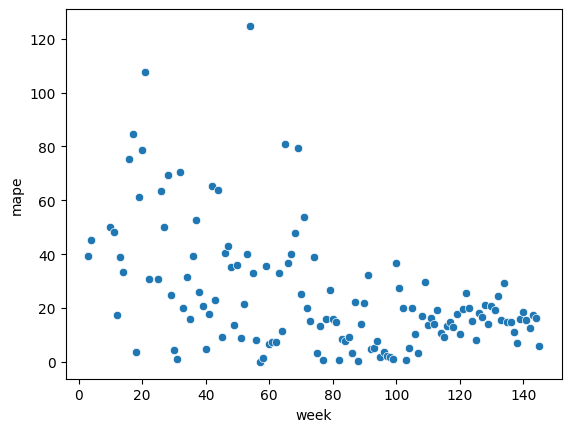

In [ ]:
sns.scatterplot(x = df_agg_actual_vs_predicted.index, y =df_agg_actual_vs_predicted['mape'])

<Axes: xlabel='week', ylabel='rmsle'>

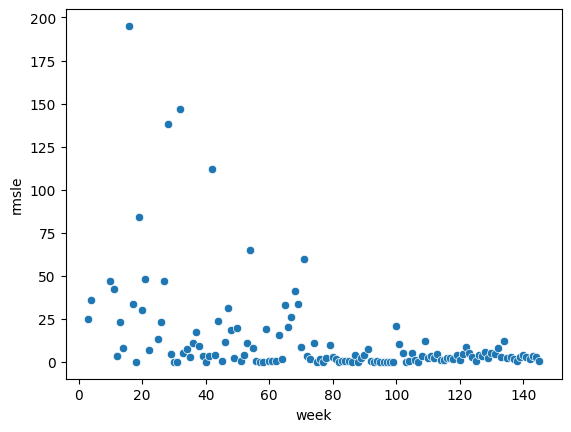

In [ ]:
sns.scatterplot(x = df_agg_actual_vs_predicted.index, y =df_agg_actual_vs_predicted['rmsle'])

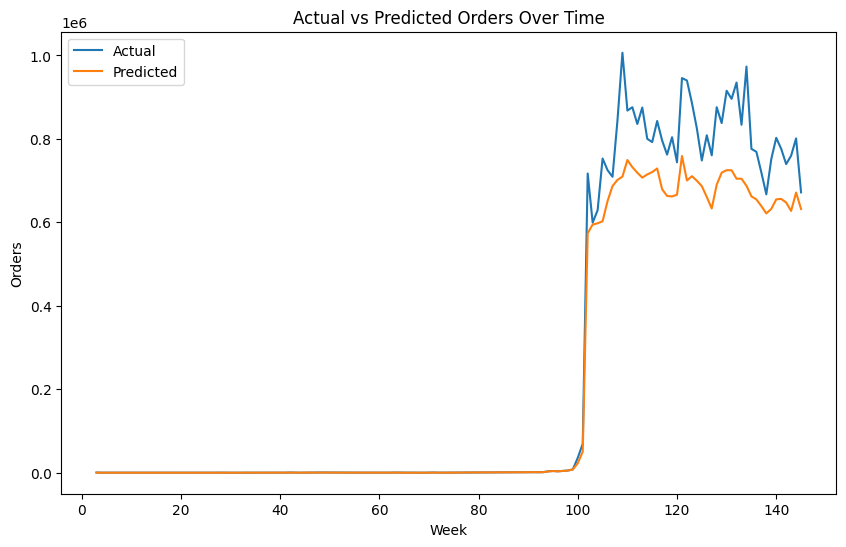

In [ ]:
plt.figure(figsize=(10,6))
sns.lineplot(x=df_agg_actual_vs_predicted.index, y=df_agg_actual_vs_predicted['num_orders'], label='Actual')
sns.lineplot(x=df_agg_actual_vs_predicted.index, y=df_agg_actual_vs_predicted['yhat'], label='Predicted')
plt.xlabel('Week')
plt.ylabel('Orders')
plt.title('Actual vs Predicted Orders Over Time')
plt.legend()
plt.show()


In [ ]:
y = np.log1p(df_agg_actual_vs_predicted['num_orders'])
yhat = np.log1p(df_agg_actual_vs_predicted['yhat'])
rmsle = np.sqrt(np.mean(((y) - (yhat)) ** 2))

In [ ]:
rmsle

np.float64(0.36789190778815983)

## Diving into why weeks Week 16, 32, 28, 42, 19, 54 have rmsle more than 60

In [ ]:
df_train_stratified.loc[df_train_stratified['week'] == 16, :]

,id,week,center_id,meal_id,checkout_price,base_price,emailer_for_promotion,homepage_featured,num_orders,category,cuisine,city_code,region_code,center_type,op_area,discount_percent,date
45137,1276418,16,10,1062,185.33,183.33,0,0,663.0,Beverages,Italian,590,56,TYPE_B,6.3,-1.090929,2023-04-23
45144,1304266,16,10,1109,309.46,310.46,0,0,1458.0,Rice Bowl,Indian,590,56,TYPE_B,6.3,0.322103,2023-04-23
45157,1401728,16,10,1198,173.63,175.63,0,0,297.0,Extras,Thai,590,56,TYPE_B,6.3,1.138758,2023-04-23
45139,1116138,16,10,1207,322.04,385.12,0,1,256.0,Beverages,Continental,590,56,TYPE_B,6.3,16.379310,2023-04-23
45149,1047186,16,10,1216,406.43,455.93,0,0,13.0,Pasta,Italian,590,56,TYPE_B,6.3,10.856930,2023-04-23
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
43158,1398497,16,186,2640,243.53,243.53,0,0,135.0,Starters,Thai,649,34,TYPE_A,3.4,0.000000,2023-04-23
43173,1474079,16,186,2704,282.33,282.33,0,0,82.0,Other Snacks,Thai,649,34,TYPE_A,3.4,0.000000,2023-04-23
43150,1179110,16,186,2707,187.24,186.24,0,0,135.0,Beverages,Italian,649,34,TYPE_A,3.4,-0.536942,2023-04-23
43171,1163813,16,186,2760,196.00,233.83,0,0,107.0,Other Snacks,Thai,649,34,TYPE_A,3.4,16.178420,2023-04-23


# XG Boost

In [ ]:
# Training

## Feature encoding and engineering

X = df_train_stratified.drop(columns=['id', 'base_price', 'date'])
X.head()

X, target_maps = target_encode_train(
    X,
    group_cols=['meal_id', 'center_id', 'city_code', 'cuisine'],
    target_col='num_orders'
)

columns_to_encode = ['category', 'center_type', 'region_code']

# Create dummy variables but keep the original columns as well
X_train = pd.get_dummies(X, columns=columns_to_encode, dtype=int, drop_first=False)

# The original categorical columns are retained along with the new dummy variables
X_train.head()

X_train = X_train.drop(columns=['num_orders', 'meal_id', 'center_id', 'city_code', 'cuisine'])

y_train = np.log1p(df_train_stratified['num_orders'])

## Model Fitting using XGBoost

from xgboost import XGBRegressor

xgb_reg = XGBRegressor(
    n_estimators=150,      # Number of trees
    max_depth=6,           # Max depth of trees
    learning_rate=0.1,     # Learning rate (shrinkage)
    subsample=0.8,         # Bagging fraction
    colsample_bytree=0.8,  # Feature sampling
    random_state=42,
    n_jobs=-1
)

xgb_reg.fit(X_train, y_train)

# Testing

## Feature encoding and engineering

X = df_test_stratified.drop(columns=['id', 'base_price', 'date'])
X.head()

X = target_encode_test(
    X,
    target_maps,
    ['meal_id', 'center_id', 'city_code', 'cuisine']
)

columns_to_encode = ['category', 'center_type', 'region_code']

# Create dummy variables but keep the original columns as well
X_test = pd.get_dummies(X, columns=columns_to_encode, dtype=int, drop_first=False)

X_test.head()

X_test = X_test.drop(columns=['num_orders', 'meal_id', 'center_id', 'city_code', 'cuisine'])
y = X['num_orders']

y_test = np.log1p(df_test_stratified['num_orders'])

## Model Prediction

y_xgb_pred = xgb_reg.predict(X_test)

y = y_test.reset_index(drop=True)
yhat = pd.Series(y_xgb_pred)

rmsle = np.sqrt(np.mean(((y) - (yhat)) ** 2))

print("RMSLE (XGBoost):", rmsle)


# Light GBM

In [ ]:
# LGBM

# Training

## Feature encoding and engineering

X = df_train_stratified.drop(columns=['id', 'base_price', 'date'])
X.head()

X, target_maps = target_encode_train(
    X,
    group_cols=['meal_id', 'center_id', 'city_code', 'cuisine'],
    target_col='num_orders'
)

columns_to_encode = ['category', 'center_type', 'region_code']

# Create dummy variables but keep the original columns as well
X_train = pd.get_dummies(X, columns=columns_to_encode, dtype=int, drop_first=False)

# Drop unnecessary columns
X_train = X_train.drop(columns=['num_orders', 'meal_id', 'center_id', 'city_code', 'cuisine'])

y_train = np.log1p(df_train_stratified['num_orders'])

## Model Fitting using LightGBM

from lightgbm import LGBMRegressor

lgbm_reg = LGBMRegressor(
    n_estimators=150,
    max_depth=6,
    learning_rate=0.1,
    subsample=0.8,
    colsample_bytree=0.8,
    random_state=42,
    n_jobs=-1
)

lgbm_reg.fit(X_train, y_train)

# Testing

## Feature encoding and engineering

X = df_test_stratified.drop(columns=['id', 'base_price', 'date'])
X.head()

X = target_encode_test(
    X,
    target_maps,
    ['meal_id', 'center_id', 'city_code', 'cuisine']
)

columns_to_encode = ['category', 'center_type', 'region_code']

X_test = pd.get_dummies(X, columns=columns_to_encode, dtype=int, drop_first=False)

X_test = X_test.drop(columns=['num_orders', 'meal_id', 'center_id', 'city_code', 'cuisine'])

y = X['num_orders']
y_test = np.log1p(df_test_stratified['num_orders'])

# Model Prediction

y_lgbm_pred = lgbm_reg.predict(X_test)

y = y_test.reset_index(drop=True)
yhat = pd.Series(y_lgbm_pred)

rmsle = np.sqrt(np.mean(((y) - (yhat)) ** 2))

print("RMSLE (LGBM):", rmsle)


# CatGBM

In [ ]:
# CatBoost
!pip install catboost

# Training

## Feature encoding and engineering

X = df_train_stratified.drop(columns=['id', 'base_price', 'date'])
X.head()

X, target_maps = target_encode_train(
    X,
    group_cols=['meal_id', 'center_id', 'city_code', 'cuisine'],
    target_col='num_orders'
)

columns_to_encode = ['category', 'center_type', 'region_code']

# Create dummy variables but keep the original columns as well
X_train = pd.get_dummies(X, columns=columns_to_encode, dtype=int, drop_first=False)

X_train = X_train.drop(columns=['num_orders', 'meal_id', 'center_id', 'city_code', 'cuisine'])

y_train = np.log1p(df_train_stratified['num_orders'])

## Model Fitting using CatBoost

from catboost import CatBoostRegressor

cat_reg = CatBoostRegressor(
    iterations=150,
    depth=6,
    learning_rate=0.1,
    subsample=0.8,
    colsample_bylevel=0.8,
    random_state=42,
    task_type="CPU",
    verbose=0
)

cat_reg.fit(X_train, y_train)

# Testing

## Feature encoding and engineering

X = df_test_stratified.drop(columns=['id', 'base_price', 'date'])
X.head()

X = target_encode_test(
    X,
    target_maps,
    ['meal_id', 'center_id', 'city_code', 'cuisine']
)

X_test = pd.get_dummies(X, columns=columns_to_encode, dtype=int, drop_first=False)

X_test = X_test.drop(columns=['num_orders', 'meal_id', 'center_id', 'city_code', 'cuisine'])
y = X['num_orders']

y_test = np.log1p(df_test_stratified['num_orders'])

## Model Prediction

y_cat_pred = cat_reg.predict(X_test)

y = y_test.reset_index(drop=True)
yhat = pd.Series(y_cat_pred)

rmsle = np.sqrt(np.mean((y - yhat) ** 2))
print("RMSLE (CatBoost):", rmsle)


#Random Forest [Final Submission]

## Training

### Feature encoding and engineering

In [ ]:
X = df_super.drop(columns= ['id',  'base_price',  'date'])
X.head()

In [ ]:
X, target_maps = target_encode_train(
    X,
    group_cols=['meal_id', 'center_id', 'city_code', 'cuisine'],
    target_col='num_orders'
)




columns_to_encode = ['category',  'center_type', 'region_code']

# Create dummy variables but keep the original columns as well
X_train = pd.get_dummies(X, columns=columns_to_encode, dtype=int, drop_first=False)

# The original categorical columns are retained along with the new dummy variables

X_train.head()

In [ ]:
X_train = X_train.drop(columns=['num_orders', 'meal_id', 'center_id', 'city_code', 'cuisine'])

In [ ]:
y_train = np.log1p(df_super['num_orders'])

### Model Fitting

In [ ]:
from sklearn.ensemble import RandomForestRegressor

In [ ]:
rf_reg = RandomForestRegressor(
    n_estimators=150,       # Number of trees in the forest
    max_depth= 20,         # No depth limit; trees grow until pure or other stopping criteria
    random_state=42,        # Ensures reproducible results
    n_jobs=-1               # Uses all CPU cores for faster training
)
rf_reg.fit(X_train, y_train)


## Testing

### Feature encoding and engineering

In [ ]:
df_fulfillment_center.head()
df_meal_info.head()

In [ ]:
df_test = pd.read_csv('/content/test_QoiMO9B.csv')
df_sample_submission = pd.read_csv('/content/sample_submission_hSlSoT6.csv')

In [ ]:
df_super_test = pd.merge(pd.merge(df_test, df_meal_info, on = 'meal_id', how = 'left'), df_fulfillment_center, on = 'center_id', how = 'left')


In [ ]:
df_super_test['discount_percent'] = (df_super_test['base_price'] - df_super_test['checkout_price']) * 100 / df_super_test['base_price']
df_super_test

In [ ]:
X = df_super_test.drop(columns= ['id',  'base_price'])
X.head()

In [ ]:

X = target_encode_test(
    X,
    target_maps,
    ['meal_id', 'center_id', 'city_code', 'cuisine']

)



columns_to_encode = ['category',  'center_type', 'region_code']

# Create dummy variables but keep the original columns as well
X_test = pd.get_dummies(X, columns=columns_to_encode, dtype=int, drop_first=False)

# The original categorical columns are retained along with the new dummy variables

X_test.head()

In [ ]:
X_test = X_test.drop(columns=[ 'meal_id', 'center_id', 'city_code', 'cuisine'])


### Model Prediction

In [ ]:
y_rf_pred = rf_reg.predict(X_test)

In [ ]:
yhat = pd.Series(y_rf_pred)

In [ ]:
yhat = np.expm1(yhat)
yhat

In [ ]:
yhat = pd.DataFrame(yhat, columns=['num_orders'])
yhat

In [ ]:
df_mohit_submission = df_super_test.join(yhat)[['id', 'num_orders']]
df_mohit_submission

In [ ]:
df_sample_submission

In [ ]:
df_mohit_submission.to_csv("df_mohit_submission.csv", index=False)

# Random Forest with OOB [Final Submission]

## Training

### Feature encoding and engineering

In [ ]:
X = df_super.drop(columns= ['id',  'base_price',  'date'])
X.head()

,week,center_id,meal_id,checkout_price,emailer_for_promotion,homepage_featured,num_orders,category,cuisine,city_code,region_code,center_type,op_area,discount_percent
0,1,55,1885,136.83,0,0,177,Beverages,Thai,647,56,TYPE_C,2.0,10.151684
1,1,55,1993,136.83,0,0,270,Beverages,Thai,647,56,TYPE_C,2.0,-0.736214
2,1,55,2539,134.86,0,0,189,Beverages,Thai,647,56,TYPE_C,2.0,0.736052
3,1,55,2139,339.50,0,0,54,Beverages,Indian,647,56,TYPE_C,2.0,22.405321
4,1,55,2631,243.50,0,0,40,Beverages,Indian,647,56,TYPE_C,2.0,-0.412371


In [ ]:
mask = add_seasonality_feature(X)
X = add_seasonality_feature(X)

<ipython-input-14-bd44f4a44d6f>:27: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  seasonal_series = df.groupby(group_cols).apply(lambda x: seasonality_func(x))
<ipython-input-14-bd44f4a44d6f>:27: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  seasonal_series = df.groupby(group_cols).apply(lambda x: seasonality_func(x))


In [ ]:
X, target_maps = target_encode_train(
    X,
    group_cols=['meal_id', 'center_id', 'city_code', 'cuisine'],
    target_col='num_orders'
)




columns_to_encode = ['category',  'center_type', 'region_code']

# Create dummy variables but keep the original columns as well
X_train = pd.get_dummies(X, columns=columns_to_encode, dtype=int, drop_first=False)

# The original categorical columns are retained along with the new dummy variables

X_train.head()

,week,center_id,meal_id,checkout_price,emailer_for_promotion,homepage_featured,num_orders,cuisine,city_code,op_area,...,center_type_TYPE_B,center_type_TYPE_C,region_code_23,region_code_34,region_code_35,region_code_56,region_code_71,region_code_77,region_code_85,region_code_93
0,1,55,1885,136.83,0,0,177,Thai,647,2.0,...,0,1,0,0,0,1,0,0,0,0
1,1,55,1993,136.83,0,0,270,Thai,647,2.0,...,0,1,0,0,0,1,0,0,0,0
2,1,55,2539,134.86,0,0,189,Thai,647,2.0,...,0,1,0,0,0,1,0,0,0,0
3,1,55,2139,339.50,0,0,54,Indian,647,2.0,...,0,1,0,0,0,1,0,0,0,0
4,1,55,2631,243.50,0,0,40,Indian,647,2.0,...,0,1,0,0,0,1,0,0,0,0


In [ ]:
X_train.columns

Index(['week', 'center_id', 'meal_id', 'checkout_price',
       'emailer_for_promotion', 'homepage_featured', 'num_orders', 'cuisine',
       'city_code', 'op_area', 'discount_percent', 'seasonality',
       'meal_id_encoded', 'center_id_encoded', 'city_code_encoded',
       'cuisine_encoded', 'category_Beverages', 'category_Biryani',
       'category_Desert', 'category_Extras', 'category_Fish',
       'category_Other Snacks', 'category_Pasta', 'category_Pizza',
       'category_Rice Bowl', 'category_Salad', 'category_Sandwich',
       'category_Seafood', 'category_Soup', 'category_Starters',
       'center_type_TYPE_A', 'center_type_TYPE_B', 'center_type_TYPE_C',
       'region_code_23', 'region_code_34', 'region_code_35', 'region_code_56',
       'region_code_71', 'region_code_77', 'region_code_85', 'region_code_93'],
      dtype='object')

In [ ]:
X_train = X_train.drop(columns=['num_orders', 'meal_id', 'center_id', 'city_code', 'cuisine'])

In [ ]:
extreme_weeks = [16, 19, 28, 32, 42, 54]

X_train['is_extreme_week'] = X_train['week'].isin(extreme_weeks).astype(int)


In [ ]:
y_train = np.log1p(df_super['num_orders'])

### Model Fitting

In [ ]:
from sklearn.ensemble import RandomForestRegressor

In [ ]:

# from sklearn.metrics import mean_squared_error
# import numpy as np
# #None, 'sqrt', 'log2', 0.3, 0.5,

# max_features_options = [ 'sqrt', 'log2', 0.3, 0.5, 0.7, 0.6]  # You can also try integers or float fractions
# results = []

# for mf in max_features_options:
#     rf = RandomForestRegressor(
#         n_estimators=150,
#         max_depth=20,
#         max_features=mf,
#         oob_score=True,
#         random_state=42,
#         n_jobs=-1
#     )
#     rf.fit(X_train, y_train)

#     oob_rmsle = np.sqrt(np.mean((rf.oob_prediction_ - y_train) ** 2))
#     results.append((mf, oob_rmsle))
#     print(sum(np.isnan(rf.oob_prediction_)))
#     print(f"max_features: {mf}, OOB RMSLE: {oob_rmsle:.5f}")


In [ ]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error
import numpy as np

best_model = None
best_score = float('inf')
results = []

max_features_options = ['sqrt', 'log2', 0.3, 0.5, 0.6, 0.7]
max_depth_options = [10, 15, 20]

for max_depth in max_depth_options:
    for mf in max_features_options:
        rf = RandomForestRegressor(
            n_estimators=150,
            max_depth=max_depth,
            max_features=mf,
            oob_score=True,
            random_state=42,
            n_jobs=-1
        )
        rf.fit(X_train, y_train)

        if np.any(np.isnan(rf.oob_prediction_)):
            print(f"NaNs detected for max_depth={max_depth}, max_features={mf}")
            continue

        oob_rmsle = np.sqrt(np.mean((rf.oob_prediction_ - y_train) ** 2))
        results.append((max_depth, mf, oob_rmsle))

        print(f"max_depth: {max_depth}, max_features: {mf}, OOB RMSLE: {oob_rmsle:.5f}")

        # Save best model
        if oob_rmsle < best_score:
            best_score = oob_rmsle
            best_model = rf


max_depth: 10, max_features: sqrt, OOB RMSLE: 0.57300
max_depth: 10, max_features: log2, OOB RMSLE: 0.58500
max_depth: 10, max_features: 0.3, OOB RMSLE: 0.54766
max_depth: 10, max_features: 0.5, OOB RMSLE: 0.53487
max_depth: 10, max_features: 0.6, OOB RMSLE: 0.53185
max_depth: 10, max_features: 0.7, OOB RMSLE: 0.53110
max_depth: 15, max_features: sqrt, OOB RMSLE: 0.48477
max_depth: 15, max_features: log2, OOB RMSLE: 0.49358
max_depth: 15, max_features: 0.3, OOB RMSLE: 0.46358
max_depth: 15, max_features: 0.5, OOB RMSLE: 0.45189
max_depth: 15, max_features: 0.6, OOB RMSLE: 0.44928
max_depth: 15, max_features: 0.7, OOB RMSLE: 0.44884
max_depth: 20, max_features: sqrt, OOB RMSLE: 0.43536
max_depth: 20, max_features: log2, OOB RMSLE: 0.44143
max_depth: 20, max_features: 0.3, OOB RMSLE: 0.42183
max_depth: 20, max_features: 0.5, OOB RMSLE: 0.41646
max_depth: 20, max_features: 0.6, OOB RMSLE: 0.41584
max_depth: 20, max_features: 0.7, OOB RMSLE: 0.41606


In [ ]:
rf_reg = best_model

In [ ]:
# from sklearn.ensemble import RandomForestRegressor

# rf_reg = RandomForestRegressor(
#     n_estimators=150,
#     max_depth=20,
#     max_features=0.6,    # Best value from your tuning
#     oob_score=True,      # Optional, still useful for diagnostics
#     random_state=42,
#     n_jobs=-1
# )

# rf_reg.fit(X_train, y_train)


## Testing

### Feature encoding and engineering

In [ ]:
df_fulfillment_center.head()
df_meal_info.head()

,meal_id,category,cuisine
0,1885,Beverages,Thai
1,1993,Beverages,Thai
2,2539,Beverages,Thai
3,1248,Beverages,Indian
4,2631,Beverages,Indian


In [ ]:
df_test = pd.read_csv('/content/test_file.csv')
df_sample_submission = pd.read_csv('/content/sample_submission.csv')

In [ ]:
df_super_test = pd.merge(pd.merge(df_test, df_meal_info, on = 'meal_id', how = 'left'), df_fulfillment_center, on = 'center_id', how = 'left')


In [ ]:
df_super_test['discount_percent'] = (df_super_test['base_price'] - df_super_test['checkout_price']) * 100 / df_super_test['base_price']
df_super_test

,id,week,center_id,meal_id,checkout_price,base_price,emailer_for_promotion,homepage_featured,category,cuisine,city_code,region_code,center_type,op_area,discount_percent
0,1028232,146,55,1885,158.11,159.11,0,0,Beverages,Thai,647,56,TYPE_C,2.0,0.628496
1,1127204,146,55,1993,160.11,159.11,0,0,Beverages,Thai,647,56,TYPE_C,2.0,-0.628496
2,1212707,146,55,2539,157.14,159.14,0,0,Beverages,Thai,647,56,TYPE_C,2.0,1.256755
3,1082698,146,55,2631,162.02,162.02,0,0,Beverages,Indian,647,56,TYPE_C,2.0,0.000000
4,1400926,146,55,1248,163.93,163.93,0,0,Beverages,Indian,647,56,TYPE_C,2.0,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32568,1250239,155,61,1543,482.09,484.09,0,0,Desert,Indian,473,77,TYPE_A,4.5,0.413146
32569,1039516,155,61,2304,483.09,483.09,0,0,Desert,Indian,473,77,TYPE_A,4.5,0.000000
32570,1158107,155,61,2664,322.07,323.07,0,0,Salad,Italian,473,77,TYPE_A,4.5,0.309530
32571,1444235,155,61,2569,322.07,323.07,0,0,Salad,Italian,473,77,TYPE_A,4.5,0.309530


In [ ]:
X = df_super_test.drop(columns= ['id',  'base_price'])
X

,week,center_id,meal_id,checkout_price,emailer_for_promotion,homepage_featured,category,cuisine,city_code,region_code,center_type,op_area,discount_percent
0,146,55,1885,158.11,0,0,Beverages,Thai,647,56,TYPE_C,2.0,0.628496
1,146,55,1993,160.11,0,0,Beverages,Thai,647,56,TYPE_C,2.0,-0.628496
2,146,55,2539,157.14,0,0,Beverages,Thai,647,56,TYPE_C,2.0,1.256755
3,146,55,2631,162.02,0,0,Beverages,Indian,647,56,TYPE_C,2.0,0.000000
4,146,55,1248,163.93,0,0,Beverages,Indian,647,56,TYPE_C,2.0,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...
32568,155,61,1543,482.09,0,0,Desert,Indian,473,77,TYPE_A,4.5,0.413146
32569,155,61,2304,483.09,0,0,Desert,Indian,473,77,TYPE_A,4.5,0.000000
32570,155,61,2664,322.07,0,0,Salad,Italian,473,77,TYPE_A,4.5,0.309530
32571,155,61,2569,322.07,0,0,Salad,Italian,473,77,TYPE_A,4.5,0.309530


In [ ]:
X = seasonal_incorporation(mask, X)
X

<ipython-input-15-e020e6f07ae8>:17: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df_test['seasonality'].fillna(0, inplace=True)


,week,center_id,meal_id,checkout_price,emailer_for_promotion,homepage_featured,category,cuisine,city_code,region_code,center_type,op_area,discount_percent,seasonal_week,seasonality
0,146,55,1885,158.11,0,0,Beverages,Thai,647,56,TYPE_C,2.0,0.628496,42,-36.832655
1,146,55,1993,160.11,0,0,Beverages,Thai,647,56,TYPE_C,2.0,-0.628496,42,-16.397559
2,146,55,2539,157.14,0,0,Beverages,Thai,647,56,TYPE_C,2.0,1.256755,42,44.266550
3,146,55,2631,162.02,0,0,Beverages,Indian,647,56,TYPE_C,2.0,0.000000,42,-24.846893
4,146,55,1248,163.93,0,0,Beverages,Indian,647,56,TYPE_C,2.0,0.000000,42,-8.623428
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32568,155,61,1543,482.09,0,0,Desert,Indian,473,77,TYPE_A,4.5,0.413146,51,-4.706453
32569,155,61,2304,483.09,0,0,Desert,Indian,473,77,TYPE_A,4.5,0.000000,51,-16.522004
32570,155,61,2664,322.07,0,0,Salad,Italian,473,77,TYPE_A,4.5,0.309530,51,-94.035411
32571,155,61,2569,322.07,0,0,Salad,Italian,473,77,TYPE_A,4.5,0.309530,51,-125.561668


In [ ]:

X = target_encode_test(
    X,
    target_maps,
    ['meal_id', 'center_id', 'city_code', 'cuisine']

)



columns_to_encode = ['category',  'center_type', 'region_code']

# Create dummy variables but keep the original columns as well
X_test = pd.get_dummies(X, columns=columns_to_encode, dtype=int, drop_first=False)

# The original categorical columns are retained along with the new dummy variables

X_test

,week,center_id,meal_id,checkout_price,emailer_for_promotion,homepage_featured,cuisine,city_code,op_area,discount_percent,...,center_type_TYPE_B,center_type_TYPE_C,region_code_23,region_code_34,region_code_35,region_code_56,region_code_71,region_code_77,region_code_85,region_code_93
0,146,55,1885,158.11,0,0,Thai,647,2.0,0.628496,...,0,1,0,0,0,1,0,0,0,0
1,146,55,1993,160.11,0,0,Thai,647,2.0,-0.628496,...,0,1,0,0,0,1,0,0,0,0
2,146,55,2539,157.14,0,0,Thai,647,2.0,1.256755,...,0,1,0,0,0,1,0,0,0,0
3,146,55,2631,162.02,0,0,Indian,647,2.0,0.000000,...,0,1,0,0,0,1,0,0,0,0
4,146,55,1248,163.93,0,0,Indian,647,2.0,0.000000,...,0,1,0,0,0,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32568,155,61,1543,482.09,0,0,Indian,473,4.5,0.413146,...,0,0,0,0,0,0,0,1,0,0
32569,155,61,2304,483.09,0,0,Indian,473,4.5,0.000000,...,0,0,0,0,0,0,0,1,0,0
32570,155,61,2664,322.07,0,0,Italian,473,4.5,0.309530,...,0,0,0,0,0,0,0,1,0,0
32571,155,61,2569,322.07,0,0,Italian,473,4.5,0.309530,...,0,0,0,0,0,0,0,1,0,0


In [ ]:
X_test = X_test.drop(columns=[ 'meal_id', 'center_id', 'city_code', 'cuisine', 'seasonal_week'])


In [ ]:
X_test['is_extreme_week'] = X_test['week'].isin(extreme_weeks).astype(int)


In [ ]:
X_test.columns

Index(['week', 'checkout_price', 'emailer_for_promotion', 'homepage_featured',
       'op_area', 'discount_percent', 'seasonality', 'meal_id_encoded',
       'center_id_encoded', 'city_code_encoded', 'cuisine_encoded',
       'category_Beverages', 'category_Biryani', 'category_Desert',
       'category_Extras', 'category_Fish', 'category_Other Snacks',
       'category_Pasta', 'category_Pizza', 'category_Rice Bowl',
       'category_Salad', 'category_Sandwich', 'category_Seafood',
       'category_Soup', 'category_Starters', 'center_type_TYPE_A',
       'center_type_TYPE_B', 'center_type_TYPE_C', 'region_code_23',
       'region_code_34', 'region_code_35', 'region_code_56', 'region_code_71',
       'region_code_77', 'region_code_85', 'region_code_93',
       'is_extreme_week'],
      dtype='object')

### Model Prediction

In [ ]:
y_rf_pred = rf_reg.predict(X_test)

In [ ]:
yhat = pd.Series(y_rf_pred)

In [ ]:
yhat = np.expm1(yhat)

In [ ]:
yhat = np.ceil(yhat)

In [ ]:
yhat = pd.DataFrame(yhat, columns=['num_orders'])
yhat

,num_orders
0,100.0
1,129.0
2,166.0
3,52.0
4,42.0
...,...
32568,59.0
32569,32.0
32570,271.0
32571,283.0


In [ ]:
df_mohit_submission = df_super_test.join(yhat)[['id', 'num_orders']]
df_mohit_submission

,id,num_orders
0,1028232,100.0
1,1127204,129.0
2,1212707,166.0
3,1082698,52.0
4,1400926,42.0
...,...,...
32568,1250239,59.0
32569,1039516,32.0
32570,1158107,271.0
32571,1444235,283.0


In [ ]:
df_sample_submission

,id,num_orders
0,1028232,0
1,1127204,0
2,1212707,0
3,1082698,0
4,1400926,0
...,...,...
32568,1250239,0
32569,1039516,0
32570,1158107,0
32571,1444235,0


In [ ]:
df_mohit_submission.to_csv("df_mohit_submission.csv", index=False)

# XG Boost [Final Submission]

## Training

In [ ]:
import xgboost as xgb
from sklearn.metrics import mean_squared_log_error
import numpy as np

# Prepare training data
X = df_super.drop(columns=['id', 'base_price', 'date'])

# Add seasonality
mask = add_seasonality_feature(X)
X = add_seasonality_feature(X)

# Target Encoding
X, target_maps = target_encode_train(
    X,
    group_cols=['meal_id', 'center_id', 'city_code', 'cuisine'],
    target_col='num_orders'
)

# One-hot encoding
columns_to_encode = ['category', 'center_type', 'region_code']
X_train = pd.get_dummies(X, columns=columns_to_encode, dtype=int, drop_first=False)

# Drop unused columns
X_train = X_train.drop(columns=['num_orders', 'meal_id', 'center_id', 'city_code', 'cuisine'])

# Add extreme week feature
extreme_weeks = [16, 19, 28, 32, 42, 54]
X_train['is_extreme_week'] = X_train['week'].isin(extreme_weeks).astype(int)

# Target transformation
y_train = np.log1p(df_super['num_orders'])

# XGBoost DMatrix
dtrain = xgb.DMatrix(data=X_train, label=y_train)


<ipython-input-14-bd44f4a44d6f>:27: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  seasonal_series = df.groupby(group_cols).apply(lambda x: seasonality_func(x))
<ipython-input-14-bd44f4a44d6f>:27: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  seasonal_series = df.groupby(group_cols).apply(lambda x: seasonality_func(x))


In [ ]:
params = {
    'objective': 'reg:squarederror',
    'eval_metric': 'rmse',
    'max_depth': 10,
    'eta': 0.05,
    'subsample': 0.8,
    'colsample_bytree': 0.8,
    'seed': 42
}

xgb_model = xgb.train(
    params,
    dtrain,
    num_boost_round=300,
    verbose_eval=50
)


## Test

In [ ]:
# Prepare test data
df_test = pd.read_csv('/content/test_file.csv')
df_sample_submission = pd.read_csv('/content/sample_submission.csv')

df_super_test = pd.merge(
    pd.merge(df_test, df_meal_info, on='meal_id', how='left'),
    df_fulfillment_center, on='center_id', how='left'
)

# Add discount
df_super_test['discount_percent'] = (
    (df_super_test['base_price'] - df_super_test['checkout_price']) * 100 / df_super_test['base_price']
)

# Drop base_price
X = df_super_test.drop(columns=['id', 'base_price'])

# Add seasonality
X = seasonal_incorporation(mask, X)

# Target encoding (using training mappings)
X = target_encode_test(
    X,
    target_maps,
    ['meal_id', 'center_id', 'city_code', 'cuisine']
)

# One-hot encoding
X_test = pd.get_dummies(X, columns=columns_to_encode, dtype=int, drop_first=False)

# Drop unused
X_test = X_test.drop(columns=['meal_id', 'center_id', 'city_code', 'cuisine', 'seasonal_week'])

# Add extreme week feature
X_test['is_extreme_week'] = X_test['week'].isin(extreme_weeks).astype(int)

# Align columns in case of mismatch
X_test = X_test.reindex(columns=X_train.columns, fill_value=0)

# DMatrix for test
dtest = xgb.DMatrix(data=X_test)

# Predict
yhat = xgb_model.predict(dtest)
yhat = np.expm1(yhat)
yhat = np.ceil(yhat)

# Final submission
df_mohit_submission = df_super_test[['id']].copy()
df_mohit_submission['num_orders'] = yhat

df_mohit_submission.to_csv("df_mohit_submission_xgb.csv", index=False)


<ipython-input-15-e020e6f07ae8>:17: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df_test['seasonality'].fillna(0, inplace=True)


# Cat GBM [Final Submission]

## Training

In [ ]:
!pip install catboost


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 99.2/99.2 MB 7.1 MB/s eta 0:00:00


In [ ]:
from catboost import CatBoostRegressor, Pool
import numpy as np

# Base training data
X = df_super.drop(columns=['id', 'base_price', 'date'])

# Add seasonality
mask = add_seasonality_feature(X)
X = add_seasonality_feature(X)

# Target encoding
X, target_maps = target_encode_train(
    X,
    group_cols=['meal_id', 'center_id', 'city_code', 'cuisine'],
    target_col='num_orders'
)

# One-hot encode categorical vars
columns_to_encode = ['category', 'center_type', 'region_code']
X_train = pd.get_dummies(X, columns=columns_to_encode, dtype=int, drop_first=False)

# Drop unused columns
X_train = X_train.drop(columns=['num_orders', 'meal_id', 'center_id', 'city_code', 'cuisine'])

# Add extreme week feature
extreme_weeks = [16, 19, 28, 32, 42, 54]
X_train['is_extreme_week'] = X_train['week'].isin(extreme_weeks).astype(int)

# Target transform
y_train = np.log1p(df_super['num_orders'])

# Pool (optional in CatBoost, but useful for later test)
train_pool = Pool(data=X_train, label=y_train)


<ipython-input-14-bd44f4a44d6f>:27: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  seasonal_series = df.groupby(group_cols).apply(lambda x: seasonality_func(x))
<ipython-input-14-bd44f4a44d6f>:27: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  seasonal_series = df.groupby(group_cols).apply(lambda x: seasonality_func(x))


In [ ]:
model_cb = CatBoostRegressor(
    iterations=500,
    learning_rate=0.05,
    depth=10,
    loss_function='RMSE',
    random_seed=42,
    verbose=100
)

model_cb.fit(train_pool)


0:	learn: 1.1620877	total: 268ms	remaining: 2m 13s
100:	learn: 0.5254911	total: 35.1s	remaining: 2m 18s
200:	learn: 0.4853188	total: 1m 3s	remaining: 1m 34s
300:	learn: 0.4645024	total: 1m 18s	remaining: 52s
400:	learn: 0.4503568	total: 1m 34s	remaining: 23.4s
499:	learn: 0.4399907	total: 1m 50s	remaining: 0us


## Testing

In [ ]:
# Load and merge
df_test = pd.read_csv('/content/test_file.csv')
df_sample_submission = pd.read_csv('/content/sample_submission.csv')

df_super_test = pd.merge(
    pd.merge(df_test, df_meal_info, on='meal_id', how='left'),
    df_fulfillment_center, on='center_id', how='left'
)

# Add discount
df_super_test['discount_percent'] = (
    (df_super_test['base_price'] - df_super_test['checkout_price']) * 100 / df_super_test['base_price']
)

# Drop base_price
X = df_super_test.drop(columns=['id', 'base_price'])

# Add seasonality
X = seasonal_incorporation(mask, X)

# Target encoding using train maps
X = target_encode_test(
    X,
    target_maps,
    ['meal_id', 'center_id', 'city_code', 'cuisine']
)

# One-hot encoding (same as train)
X_test = pd.get_dummies(X, columns=columns_to_encode, dtype=int, drop_first=False)

# Drop unused
X_test = X_test.drop(columns=['meal_id', 'center_id', 'city_code', 'cuisine', 'seasonal_week'])

# Add extreme week
X_test['is_extreme_week'] = X_test['week'].isin(extreme_weeks).astype(int)

# Align columns with training data
X_test = X_test.reindex(columns=X_train.columns, fill_value=0)

# Predict
yhat = model_cb.predict(X_test)
yhat = np.expm1(yhat)
yhat = np.ceil(yhat)

# Prepare submission
df_mohit_submission = df_super_test[['id']].copy()
df_mohit_submission['num_orders'] = yhat

df_mohit_submission.to_csv("df_mohit_submission_catboost.csv", index=False)


<ipython-input-15-e020e6f07ae8>:17: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df_test['seasonality'].fillna(0, inplace=True)


# Light GBM [Final Submission]

## Training

In [ ]:
import lightgbm as lgb
import pandas as pd
import numpy as np
from sklearn.metrics import mean_squared_error


In [ ]:
# Drop unnecessary columns
X = df_super.drop(columns=['id', 'base_price', 'date'])

# Add seasonality
mask = add_seasonality_feature(X)
X = add_seasonality_feature(X)

# Target encoding
X, target_maps = target_encode_train(
    X,
    group_cols=['meal_id', 'center_id', 'city_code', 'cuisine'],
    target_col='num_orders'
)

# One-hot encoding
columns_to_encode = ['category', 'center_type', 'region_code']
X_train = pd.get_dummies(X, columns=columns_to_encode, dtype=int, drop_first=False)

# Remove target-related columns
X_train = X_train.drop(columns=['num_orders', 'meal_id', 'center_id', 'city_code', 'cuisine'])

# Add extreme weeks flag
extreme_weeks = [16, 19, 28, 32, 42, 54]
X_train['is_extreme_week'] = X_train['week'].isin(extreme_weeks).astype(int)

# Define target variable
y_train = np.log1p(df_super['num_orders'])


<ipython-input-14-bd44f4a44d6f>:27: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  seasonal_series = df.groupby(group_cols).apply(lambda x: seasonality_func(x))
<ipython-input-14-bd44f4a44d6f>:27: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  seasonal_series = df.groupby(group_cols).apply(lambda x: seasonality_func(x))


In [ ]:
train_dataset = lgb.Dataset(X_train, label=y_train)

params = {
    'objective': 'regression',
    'metric': 'rmse',
    'num_leaves': 31,
    'learning_rate': 0.05,
    'feature_fraction': 0.8,
    'bagging_fraction': 0.8,
    'bagging_freq': 5,
    'verbose': -1
}

model_lgb = lgb.train(params, train_dataset, num_boost_round=1000)


## Testing

In [ ]:
# Merge test data
df_super_test = pd.merge(
    pd.merge(df_test, df_meal_info, on='meal_id', how='left'),
    df_fulfillment_center, on='center_id', how='left'
)

# Add discount
df_super_test['discount_percent'] = (df_super_test['base_price'] - df_super_test['checkout_price']) * 100 / df_super_test['base_price']

# Drop unnecessary columns
X = df_super_test.drop(columns=['id', 'base_price'])

# Add seasonality
X = seasonal_incorporation(mask, X)

# Target encoding
X = target_encode_test(
    X,
    target_maps,
    ['meal_id', 'center_id', 'city_code', 'cuisine']
)

# One-hot encoding
X_test = pd.get_dummies(X, columns=columns_to_encode, dtype=int, drop_first=False)

# Drop unused columns
X_test = X_test.drop(columns=['meal_id', 'center_id', 'city_code', 'cuisine', 'seasonal_week'])

# Add extreme week flag
X_test['is_extreme_week'] = X_test['week'].isin(extreme_weeks).astype(int)


<ipython-input-15-e020e6f07ae8>:17: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df_test['seasonality'].fillna(0, inplace=True)


In [ ]:
y_lgb_pred = model_lgb.predict(X_test)

# Inverse log transform and round
yhat = pd.Series(np.expm1(y_lgb_pred))
yhat = np.ceil(yhat)

# Prepare final submission
df_mohit_submission = df_super_test[['id']].copy()
df_mohit_submission['num_orders'] = yhat

# Save submission
df_mohit_submission.to_csv("df_mohit_lgb_submission.csv", index=False)


#AdaBoost

In [ ]:
from sklearn.ensemble import AdaBoostRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import mean_squared_error
import pandas as pd
import numpy as np

# ---------------------- Feature Engineering ----------------------------

X = df_super.drop(columns=['id', 'base_price', 'date'])

mask = add_seasonality_feature(X)
X = add_seasonality_feature(X)

# X, target_maps = target_encode_train(
#     X,
#     group_cols=['meal_id', 'center_id', 'city_code', 'cuisine'],
#     target_col='num_orders'
# )

# columns_to_encode = ['category', 'center_type', 'region_code']
# X_train = pd.get_dummies(X, columns=columns_to_encode, dtype=int, drop_first=False)

#X_train = X_train.drop(columns=['num_orders', 'meal_id', 'center_id', 'city_code', 'cuisine'])

# Add extreme week flag
extreme_weeks = [16, 19, 28, 32, 42, 54]
X_train['is_extreme_week'] = X_train['week'].isin(extreme_weeks).astype(int)

# Target variable
y_train = np.log1p(df_super['num_orders'])

# ---------------------- Model Training ----------------------------

# Use a shallow tree as base estimator
base_est = DecisionTreeRegressor(max_depth=6, random_state=42)

ada = AdaBoostRegressor(
    estimator=base_est,
    n_estimators=200,
    learning_rate=0.1,
    random_state=42
)

ada.fit(X_train, y_train)

# ---------------------- Feature Engineering on Test ----------------------------

df_test = pd.read_csv('/content/test_file.csv')
df_sample_submission = pd.read_csv('/content/sample_submission.csv')

df_super_test = pd.merge(
    pd.merge(df_test, df_meal_info, on='meal_id', how='left'),
    df_fulfillment_center, on='center_id', how='left'
)

df_super_test['discount_percent'] = (
    (df_super_test['base_price'] - df_super_test['checkout_price']) * 100 / df_super_test['base_price']
)

X = df_super_test.drop(columns=['id', 'base_price'])

X = seasonal_incorporation(mask, X)

# X = target_encode_test(
#     X,
#     target_maps,
#     ['meal_id', 'center_id', 'city_code', 'cuisine']
# )

# X_test = pd.get_dummies(X, columns=columns_to_encode, dtype=int, drop_first=False)

# Ensure the same columns as in training
#X_test = X_test.drop(columns=['meal_id', 'center_id', 'city_code', 'cuisine', 'seasonal_week'])
X_test['is_extreme_week'] = X_test['week'].isin(extreme_weeks).astype(int)

# Align test and train columns (in case some dummies are missing)
X_test = X_test.reindex(columns=X_train.columns, fill_value=0)

# ---------------------- Predict & Submit ----------------------------

y_pred_log = ada.predict(X_test)
y_pred = np.ceil(np.expm1(y_pred_log))

submission_df = df_super_test[['id']].copy()
submission_df['num_orders'] = y_pred.astype(int)

submission_df.to_csv("ada_submission.csv", index=False)


<ipython-input-14-bd44f4a44d6f>:27: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  seasonal_series = df.groupby(group_cols).apply(lambda x: seasonality_func(x))
<ipython-input-14-bd44f4a44d6f>:27: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  seasonal_series = df.groupby(group_cols).apply(lambda x: seasonality_func(x))
<ipython-input-15-e020e6f07ae8>:17: FutureWarning: A value is trying to be set on a copy o

# Random Forest with OOB [Final Submission] [Label Encoded]

## Training

### Feature encoding and engineering

In [37]:
X = df_super.drop(columns= ['id',  'base_price',  'date'])
X.head()

,week,center_id,meal_id,checkout_price,emailer_for_promotion,homepage_featured,num_orders,category,cuisine,city_code,region_code,center_type,op_area,discount_percent
0,1,55,1885,136.83,0,0,177,Beverages,Thai,647,56,TYPE_C,2.0,10.151684
1,1,55,1993,136.83,0,0,270,Beverages,Thai,647,56,TYPE_C,2.0,-0.736214
2,1,55,2539,134.86,0,0,189,Beverages,Thai,647,56,TYPE_C,2.0,0.736052
3,1,55,2139,339.50,0,0,54,Beverages,Indian,647,56,TYPE_C,2.0,22.405321
4,1,55,2631,243.50,0,0,40,Beverages,Indian,647,56,TYPE_C,2.0,-0.412371


In [38]:
mask = add_seasonality_feature(X)
X = add_seasonality_feature(X)

<ipython-input-14-bd44f4a44d6f>:27: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  seasonal_series = df.groupby(group_cols).apply(lambda x: seasonality_func(x))
<ipython-input-14-bd44f4a44d6f>:27: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  seasonal_series = df.groupby(group_cols).apply(lambda x: seasonality_func(x))


In [39]:
X, target_maps = target_encode_train(
    X,
    group_cols=['meal_id', 'center_id'],
    target_col='num_orders'
)


from sklearn.preprocessing import LabelEncoder

cols_to_encode = ['category', 'center_type', 'cuisine']
label_encoders = {}

# Fit encoders and transform train data
for col in cols_to_encode:
    le = LabelEncoder()
    X[col] = le.fit_transform(X[col])
    label_encoders[col] = le

X_train = X
X_train.head()

,week,center_id,meal_id,checkout_price,emailer_for_promotion,homepage_featured,num_orders,category,cuisine,city_code,region_code,center_type,op_area,discount_percent,seasonality,meal_id_encoded,center_id_encoded
0,1,55,1885,136.83,0,0,177,0,3,647,56,2,2.0,10.151684,104.922152,752.456365,163.475709
1,1,55,1993,136.83,0,0,270,0,3,647,56,2,2.0,-0.736214,404.347633,598.853544,163.475709
2,1,55,2539,134.86,0,0,189,0,3,647,56,2,2.0,0.736052,175.809819,309.494594,163.475709
3,1,55,2139,339.50,0,0,54,0,1,647,56,2,2.0,22.405321,0.000000,42.813462,163.475709
4,1,55,2631,243.50,0,0,40,0,1,647,56,2,2.0,-0.412371,5.203587,104.239051,163.475709


In [40]:
X_train.columns

Index(['week', 'center_id', 'meal_id', 'checkout_price',
       'emailer_for_promotion', 'homepage_featured', 'num_orders', 'category',
       'cuisine', 'city_code', 'region_code', 'center_type', 'op_area',
       'discount_percent', 'seasonality', 'meal_id_encoded',
       'center_id_encoded'],
      dtype='object')

In [41]:
X_train = X_train.drop(columns=['num_orders'])

In [42]:
extreme_weeks = [16, 19, 28, 32, 42, 54]

X_train['is_extreme_week'] = X_train['week'].isin(extreme_weeks).astype(int)


In [43]:
y_train = np.log1p(df_super['num_orders'])

### Model Fitting

In [44]:
from sklearn.ensemble import RandomForestRegressor

In [45]:

# from sklearn.metrics import mean_squared_error
# import numpy as np
# #None, 'sqrt', 'log2', 0.3, 0.5,

# max_features_options = [ 'sqrt', 'log2', 0.3, 0.5, 0.7, 0.6]  # You can also try integers or float fractions
# results = []

# for mf in max_features_options:
#     rf = RandomForestRegressor(
#         n_estimators=150,
#         max_depth=20,
#         max_features=mf,
#         oob_score=True,
#         random_state=42,
#         n_jobs=-1
#     )
#     rf.fit(X_train, y_train)

#     oob_rmsle = np.sqrt(np.mean((rf.oob_prediction_ - y_train) ** 2))
#     results.append((mf, oob_rmsle))
#     print(sum(np.isnan(rf.oob_prediction_)))
#     print(f"max_features: {mf}, OOB RMSLE: {oob_rmsle:.5f}")


In [46]:
# from sklearn.ensemble import RandomForestRegressor
# from sklearn.metrics import mean_squared_error
# import numpy as np

# best_model = None
# best_score = float('inf')
# results = []

# max_features_options = ['sqrt', 'log2', 0.3, 0.5, 0.6, 0.7]
# max_depth_options = [10, 15, 20]

# for max_depth in max_depth_options:
#     for mf in max_features_options:
#         rf = RandomForestRegressor(
#             n_estimators=150,
#             max_depth=max_depth,
#             max_features=mf,
#             oob_score=True,
#             random_state=42,
#             n_jobs=-1
#         )
#         rf.fit(X_train, y_train)

#         if np.any(np.isnan(rf.oob_prediction_)):
#             print(f"NaNs detected for max_depth={max_depth}, max_features={mf}")
#             continue

#         oob_rmsle = np.sqrt(np.mean((rf.oob_prediction_ - y_train) ** 2))
#         results.append((max_depth, mf, oob_rmsle))

#         print(f"max_depth: {max_depth}, max_features: {mf}, OOB RMSLE: {oob_rmsle:.5f}")

#         # Save best model
#         if oob_rmsle < best_score:
#             best_score = oob_rmsle
#             best_model = rf


In [47]:
# rf_reg = best_model

In [48]:
from sklearn.ensemble import RandomForestRegressor

rf_reg = RandomForestRegressor(
    n_estimators=150,
    max_depth=20,
    max_features=0.5,    # Best value from your tuning
    oob_score=True,      # Optional, still useful for diagnostics
    random_state=42,
    n_jobs=-1
)

rf_reg.fit(X_train, y_train)


RandomForestRegressor(max_depth=20, max_features=0.5, n_estimators=150,
                      n_jobs=-1, oob_score=True, random_state=42)

## Testing

### Feature encoding and engineering

In [49]:
df_fulfillment_center.head()
df_meal_info.head()

,meal_id,category,cuisine
0,1885,Beverages,Thai
1,1993,Beverages,Thai
2,2539,Beverages,Thai
3,1248,Beverages,Indian
4,2631,Beverages,Indian


In [50]:
df_test = pd.read_csv('/content/test_file.csv')
df_sample_submission = pd.read_csv('/content/sample_submission.csv')

In [51]:
df_super_test = pd.merge(pd.merge(df_test, df_meal_info, on = 'meal_id', how = 'left'), df_fulfillment_center, on = 'center_id', how = 'left')


In [52]:
df_super_test['discount_percent'] = (df_super_test['base_price'] - df_super_test['checkout_price']) * 100 / df_super_test['base_price']
df_super_test

,id,week,center_id,meal_id,checkout_price,base_price,emailer_for_promotion,homepage_featured,category,cuisine,city_code,region_code,center_type,op_area,discount_percent
0,1028232,146,55,1885,158.11,159.11,0,0,Beverages,Thai,647,56,TYPE_C,2.0,0.628496
1,1127204,146,55,1993,160.11,159.11,0,0,Beverages,Thai,647,56,TYPE_C,2.0,-0.628496
2,1212707,146,55,2539,157.14,159.14,0,0,Beverages,Thai,647,56,TYPE_C,2.0,1.256755
3,1082698,146,55,2631,162.02,162.02,0,0,Beverages,Indian,647,56,TYPE_C,2.0,0.000000
4,1400926,146,55,1248,163.93,163.93,0,0,Beverages,Indian,647,56,TYPE_C,2.0,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32568,1250239,155,61,1543,482.09,484.09,0,0,Desert,Indian,473,77,TYPE_A,4.5,0.413146
32569,1039516,155,61,2304,483.09,483.09,0,0,Desert,Indian,473,77,TYPE_A,4.5,0.000000
32570,1158107,155,61,2664,322.07,323.07,0,0,Salad,Italian,473,77,TYPE_A,4.5,0.309530
32571,1444235,155,61,2569,322.07,323.07,0,0,Salad,Italian,473,77,TYPE_A,4.5,0.309530


In [53]:
X = df_super_test.drop(columns= ['id',  'base_price'])
X

,week,center_id,meal_id,checkout_price,emailer_for_promotion,homepage_featured,category,cuisine,city_code,region_code,center_type,op_area,discount_percent
0,146,55,1885,158.11,0,0,Beverages,Thai,647,56,TYPE_C,2.0,0.628496
1,146,55,1993,160.11,0,0,Beverages,Thai,647,56,TYPE_C,2.0,-0.628496
2,146,55,2539,157.14,0,0,Beverages,Thai,647,56,TYPE_C,2.0,1.256755
3,146,55,2631,162.02,0,0,Beverages,Indian,647,56,TYPE_C,2.0,0.000000
4,146,55,1248,163.93,0,0,Beverages,Indian,647,56,TYPE_C,2.0,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...
32568,155,61,1543,482.09,0,0,Desert,Indian,473,77,TYPE_A,4.5,0.413146
32569,155,61,2304,483.09,0,0,Desert,Indian,473,77,TYPE_A,4.5,0.000000
32570,155,61,2664,322.07,0,0,Salad,Italian,473,77,TYPE_A,4.5,0.309530
32571,155,61,2569,322.07,0,0,Salad,Italian,473,77,TYPE_A,4.5,0.309530


In [54]:
X = seasonal_incorporation(mask, X)
X

<ipython-input-15-e020e6f07ae8>:17: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df_test['seasonality'].fillna(0, inplace=True)


,week,center_id,meal_id,checkout_price,emailer_for_promotion,homepage_featured,category,cuisine,city_code,region_code,center_type,op_area,discount_percent,seasonal_week,seasonality
0,146,55,1885,158.11,0,0,Beverages,Thai,647,56,TYPE_C,2.0,0.628496,42,-36.832655
1,146,55,1993,160.11,0,0,Beverages,Thai,647,56,TYPE_C,2.0,-0.628496,42,-16.397559
2,146,55,2539,157.14,0,0,Beverages,Thai,647,56,TYPE_C,2.0,1.256755,42,44.266550
3,146,55,2631,162.02,0,0,Beverages,Indian,647,56,TYPE_C,2.0,0.000000,42,-24.846893
4,146,55,1248,163.93,0,0,Beverages,Indian,647,56,TYPE_C,2.0,0.000000,42,-8.623428
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32568,155,61,1543,482.09,0,0,Desert,Indian,473,77,TYPE_A,4.5,0.413146,51,-4.706453
32569,155,61,2304,483.09,0,0,Desert,Indian,473,77,TYPE_A,4.5,0.000000,51,-16.522004
32570,155,61,2664,322.07,0,0,Salad,Italian,473,77,TYPE_A,4.5,0.309530,51,-94.035411
32571,155,61,2569,322.07,0,0,Salad,Italian,473,77,TYPE_A,4.5,0.309530,51,-125.561668


In [55]:

X = target_encode_test(
    X,
    target_maps,
    ['meal_id', 'center_id']

)

import numpy as np

for col in cols_to_encode:
    le = label_encoders[col]
    # Handle unseen labels by mapping manually
    X[col] = X[col].map(lambda s: le.transform([s])[0] if s in le.classes_ else -1)

X_test = X
X_test

,week,center_id,meal_id,checkout_price,emailer_for_promotion,homepage_featured,category,cuisine,city_code,region_code,center_type,op_area,discount_percent,seasonal_week,seasonality,meal_id_encoded,center_id_encoded
0,146,55,1885,158.11,0,0,0,3,647,56,2,2.0,0.628496,42,-36.832655,752.456365,163.475709
1,146,55,1993,160.11,0,0,0,3,647,56,2,2.0,-0.628496,42,-16.397559,598.853544,163.475709
2,146,55,2539,157.14,0,0,0,3,647,56,2,2.0,1.256755,42,44.266550,309.494594,163.475709
3,146,55,2631,162.02,0,0,0,1,647,56,2,2.0,0.000000,42,-24.846893,104.239051,163.475709
4,146,55,1248,163.93,0,0,0,1,647,56,2,2.0,0.000000,42,-8.623428,88.011872,163.475709
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32568,155,61,1543,482.09,0,0,2,1,473,77,0,4.5,0.413146,51,-4.706453,77.279894,207.511870
32569,155,61,2304,483.09,0,0,2,1,473,77,0,4.5,0.000000,51,-16.522004,62.978297,207.511870
32570,155,61,2664,322.07,0,0,9,2,473,77,0,4.5,0.309530,51,-94.035411,395.900944,207.511870
32571,155,61,2569,322.07,0,0,9,2,473,77,0,4.5,0.309530,51,-125.561668,352.510731,207.511870


In [56]:
#X_test = X_test.drop(columns=[ 'meal_id', 'center_id', 'city_code', 'cuisine', 'seasonal_week'])
X_test = X_test.drop(columns=[ 'seasonal_week'])


In [57]:
X_test['is_extreme_week'] = X_test['week'].isin(extreme_weeks).astype(int)


In [58]:
X_test.columns

Index(['week', 'center_id', 'meal_id', 'checkout_price',
       'emailer_for_promotion', 'homepage_featured', 'category', 'cuisine',
       'city_code', 'region_code', 'center_type', 'op_area',
       'discount_percent', 'seasonality', 'meal_id_encoded',
       'center_id_encoded', 'is_extreme_week'],
      dtype='object')

### Model Prediction

In [59]:
y_rf_pred = rf_reg.predict(X_test)

In [60]:
yhat = pd.Series(y_rf_pred)

In [61]:
yhat = np.expm1(yhat)

In [62]:
yhat = np.ceil(yhat)

In [63]:
yhat = pd.DataFrame(yhat, columns=['num_orders'])
yhat

,num_orders
0,105.0
1,136.0
2,157.0
3,45.0
4,39.0
...,...
32568,57.0
32569,29.0
32570,273.0
32571,290.0


In [64]:
df_mohit_submission = df_super_test.join(yhat)[['id', 'num_orders']]
df_mohit_submission

,id,num_orders
0,1028232,105.0
1,1127204,136.0
2,1212707,157.0
3,1082698,45.0
4,1400926,39.0
...,...,...
32568,1250239,57.0
32569,1039516,29.0
32570,1158107,273.0
32571,1444235,290.0


In [65]:
df_sample_submission

,id,num_orders
0,1028232,0
1,1127204,0
2,1212707,0
3,1082698,0
4,1400926,0
...,...,...
32568,1250239,0
32569,1039516,0
32570,1158107,0
32571,1444235,0


In [66]:
df_mohit_submission.to_csv("df_mohit_submission.csv", index=False)

# Gradient Boost Regression [Validation]

## Training and test feature engineering

In [22]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import mean_squared_error
import numpy as np
import pandas as pd

### 1. Preprocess Train and Test Sets ###

# Drop unnecessary columns
X_train = df_train_stratified.drop(columns=['id', 'base_price', 'date'])
X_test = df_test_stratified.drop(columns=['id', 'base_price', 'date'])

# Add seasonality features (assuming `mask` is already created)
mask = add_seasonality_feature(X_train)
X_train = add_seasonality_feature(X_train)
X_test = seasonal_incorporation(mask, X_test)

# Target Encoding
X_train, target_maps = target_encode_train(
    X_train,
    group_cols=['meal_id', 'center_id'],
    target_col='num_orders'
)

X_test = target_encode_test(
    X_test,
    target_maps,
    ['meal_id', 'center_id']
)

# Label Encoding
cols_to_encode = ['category', 'center_type', 'cuisine']
label_encoders = {}

for col in cols_to_encode:
    le = LabelEncoder()
    X_train[col] = le.fit_transform(X_train[col])
    label_encoders[col] = le

    # Handle unseen labels in test
    X_test[col] = X_test[col].map(lambda s: le.transform([s])[0] if s in le.classes_ else -1)

# Drop columns that shouldn't be used for training
X_train = X_train.drop(columns=['num_orders'])  # Target should be separate

# Add 'is_extreme_week' flag
extreme_weeks = [16, 19, 28, 32, 42, 54]
X_train['is_extreme_week'] = X_train['week'].isin(extreme_weeks).astype(int)
X_test['is_extreme_week'] = X_test['week'].isin(extreme_weeks).astype(int)

# Target transformation
y_train = np.log1p(df_train_stratified['num_orders'])


<ipython-input-14-bd44f4a44d6f>:27: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  seasonal_series = df.groupby(group_cols).apply(lambda x: seasonality_func(x))
<ipython-input-14-bd44f4a44d6f>:27: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  seasonal_series = df.groupby(group_cols).apply(lambda x: seasonality_func(x))
<ipython-input-15-e020e6f07ae8>:17: FutureWarning: A value is trying to be set on a copy o

In [ ]:
X_test = X_test.drop(columns = ['num_orders'])
y_test_actual = df_test_stratified['num_orders']


## Fitting the gradient model

In [36]:
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.metrics import mean_squared_error
import numpy as np
import pandas as pd

# Define parameter lists (only 2 parameters varied)
n_estimators_list = [100, 200]
learning_rates = [0.05, 0.1]

# To store results
results = []

for n in n_estimators_list:
    for lr in learning_rates:
        print(f"Training model: n_estimators={n}, learning_rate={lr}")

        gbr = GradientBoostingRegressor(
            n_estimators=n,
            learning_rate=lr,
            max_depth=6,       # fixed
            subsample=0.8,     # fixed
            random_state=42
        )

        gbr.fit(X_train, y_train)

        # Predict and inverse log transform
        y_pred_log = gbr.predict(X_test)
        y_pred = np.expm1(y_pred_log)

        # Round as per your earlier logic
        y_pred = np.ceil(y_pred)

        # RMSLE evaluation
        rmsle = np.sqrt(np.mean((np.log1p(y_pred) - np.log1p(y_test_actual))**2))
        print(f"Holdout RMSLE: {rmsle:.5f}")


        results.append({
            'n_estimators': n,
            'learning_rate': lr,
            'rmsle': rmsle
        })

# View results
results_df = pd.DataFrame(results).sort_values(by='rmsle')
print(results_df)


Training model: n_estimators=100, learning_rate=0.05
Holdout RMSLE: 0.64152
Training model: n_estimators=100, learning_rate=0.1
Holdout RMSLE: 0.64538
Training model: n_estimators=200, learning_rate=0.05
Holdout RMSLE: 0.66167
Training model: n_estimators=200, learning_rate=0.1
Holdout RMSLE: 0.64489
   n_estimators  learning_rate     rmsle
0           100           0.05  0.641524
3           200           0.10  0.644892
1           100           0.10  0.645376
2           200           0.05  0.661666


## Evaluating on test set

In [25]:
X_test = X_test.drop(columns=[ 'seasonal_week'])


In [29]:
X_train.shape

(317880, 17)

In [31]:
X_test.columns

Index(['week', 'center_id', 'meal_id', 'checkout_price',
       'emailer_for_promotion', 'homepage_featured', 'num_orders', 'category',
       'cuisine', 'city_code', 'region_code', 'center_type', 'op_area',
       'discount_percent', 'seasonality', 'meal_id_encoded',
       'center_id_encoded', 'is_extreme_week'],
      dtype='object')

In [33]:
# Predict and inverse log transform
y_pred_log = gbr.predict(X_test)
y_pred = np.expm1(y_pred_log)

# Round as per your earlier logic
y_pred = np.ceil(y_pred)

# RMSLE evaluation
rmsle = np.sqrt(np.mean((np.log1p(y_pred) - np.log1p(y_test_actual))**2))
print(f"Holdout RMSLE: {rmsle:.5f}")


Holdout RMSLE: 0.64489
